**TRABAJO DE FIN DE GRADO: CLASIFICACIÓN DE IMÁGENES DE LESIONES CUTÁNEAS MEDIANTE REDES NEURONALES CONVOLUCIONALES Y APRENDIZAJE PROFUNDO**

Javier García Ciudad

Grado en Ingeniería de la Salud

---



Python Notebook accesible en Google Colab:  https://colab.research.google.com/drive/1NqW70aOA9nagYvEdocS0UjZA4KAC7KsQ?usp=sharing 

A diferencia de en la memoria, en el código las siglas de las enfermedades están en inglés ya que así venían en las etiquetas de los datasets: melanoma (MEL), nevus (NV), basal cell carcinoma (BCC), actinic keratosis (AK), benign keratosis (BKL), dermatofibroma (DF), vascular lesion (VASC), squamous cell carcinoma (SCC) y unknown (UNK)

# Inicio

Se importa la cuenta de Google Drive en donde tengo alojados los datasets:

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


Instalo la librería EfficientNet para poder usar dicha CNN, ya que no viene nativa en Keras:

In [ ]:
!pip install -U git+https://github.com/qubvel/efficientnet

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
import sklearn
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dropout
from tensorflow.keras.models import load_model
from tensorflow.keras import regularizers
from sklearn import metrics
import matplotlib.pyplot as plt
import shutil
import os
import efficientnet.tfkeras as efn
import math
from functools import reduce
from google.colab import files
import pickle

Versión de TensorFlow:

In [ ]:
tf.__version__

'2.2.0'

## Construcción dataset

### Funciones para incorporar otros datasets

Estas funciones se usarán en función de los datasets que se vayan a usar. Se encargan de descomprimir los datos, construir un dataframe con las etiquetas, mover todas las imágenes junto a la carpeta donde están el resto y finalmente unir el dataframe con el del resto de imágenes.

In [ ]:
def add_UNK_dataset():
  # Aquí no hace falta juntar los dataframes porque ya tengo los de los datasets ISIC y Unknown ya los tengo juntos, así que simplemente muevo los archivos
  !unzip -q '/content/drive/My Drive/TFG Javier/Datasets/UNKNOWN DATASET/flow_from_dataframe/Unknown Dataset.zip'

  for filename in os.listdir('/content/Unknown Remastered'):
    origen = '/content/Unknown Remastered/' + filename
    destino = '/content/ISIC_2019_Training_Input/' + filename
    shutil.move(origen,destino)

In [ ]:
def construir_df(categ_origen,
                 dataset_path,
                 dicc={'MEL': 'MEL',
                       'NV': 'NV',
                       'BCC': 'BCC',
                       'AK': 'AK',
                       'BKL': 'BKL',
                       'DF': 'DF',
                       'VASC': 'VASC',
                       'SCC': 'SCC',
                       'UNK': 'UNK'}):

  # Construye un dataframe para las imágenes de una determinada categoría (categ) de un determinado dataset
  # categ_origen = categoría de la que se está contruyendo el dataframe
  # dataset_path = path del dataset en cuestión
  # dicc = equivalencias entre categorías del dataset y las de nuestro problema. Si no se suministra este argumento se entiende que el dataset tiene las mimas categorías que nuestro problema.

  filenames = os.listdir(dataset_path + '/' + categ_origen)

  categorias = ['MEL','NV','BCC','AK','BKL','DF','VASC','SCC','UNK'] # categorías del trabajo

  df = pd.DataFrame(filenames, columns = ['image']) # se crea un dataframe para esa categoría

  for c in categorias:
    # En la columna de la categoría de la que se trata, se añade la columna entera con 1. En las demás categorías, 0 (formato hot-encoded).
    if c == dicc[categ_origen]:
      df[c] = 1.0
    else:
      df[c] = 0.0

  return df

In [ ]:
def mover_imagenes(categorias,dataset_path):
  # Mueve las imágenes de un determinado dataset con el resto de imágenes de entrenamiento
  # categorias = categorias que contiene el dataset
  # dataset_path = ruta del dataset

  for c in categorias:
    filenames = os.listdir(dataset_path + '/' + c)

    for item in filenames:
      origin = dataset_path + '/' + c + '/' + item
      destination = '/content/ISIC_2019_Training_Input/' + item
      shutil.move(origin,destination)

In [ ]:
def add_SD_dataset(df_entrenamiento):
  # Crea un dataframe para unirlo con el de los demás datos de entrenamiento y mueve todas las imágenes con todas las demás imágenes 
  
  !unzip -q '/content/drive/My Drive/TFG Javier/Datasets/SD/sd-por categorias.zip'
  path_sd = '/content/sd-por categorias'

  cat_sd = ['AK','BCC','BKL','DF','MEL','UNK'] # categorías que contiene este dataset

  # Se crea el dataframe con la primera categoría que contiene este dataset
  dataframe_sd = construir_df(cat_sd[0],path_sd)

  # Se unen las demás categorías al dataframe creado
  for c in cat_sd[1:]:
    dataframe_sd = dataframe_sd.append(construir_df(c,path_sd))

  # Se une el dataframe de este dataset con el de las demás imágenes de entrenamiento
  df_entrenamiento = df_train.append(dataframe_sd)

  # Se mueven las imágenes a la carpeta de entrenamiento
  mover_imagenes(cat_sd,path_sd)

  # Se devuelve el dataframe
  return df_entrenamiento

In [ ]:
def add_7p_dataset(df_entrenamiento):
  # Crea un dataframe para unirlo con el de los demás datos de entrenamiento y mueve todas las imágenes con todas las demás imágenes de entrenamiento

  #####################################################################################################
  def valor_columnas(categ,df_categoria):
    # Añade al dataframe los 0 o 1 de las columnas dependiendo de la categoría de la que se trate

    categorias = ['MEL','NV','BCC','AK','BKL','DF','VASC','SCC','UNK'] # categorías del trabajo

    for c in categorias:
      # En la columna de la categoría de la que se trata, se añade la columna entera con 1. En las demás categorías, 0.
      if c==categ:
        df_categoria[c]=1.0
      else:
        df_categoria[c]=0.0
    
    return df_categoria
  #####################################################################################################

  !unzip -q '/content/drive/My Drive/TFG Javier/Datasets/7point/7point.zip'

  df_7point = pd.read_csv('/content/7point/release_v0/meta/meta.csv',dtype='string')

  # Se crea un dataframe por cada categoría del dataset 7point que pertenece a una categoría de nuetro problema:

  ## MEL
  df_MEL1 = df_7point.loc[df_7point['diagnosis']=='melanoma']['derm']
  df_MEL2 = df_7point.loc[df_7point['diagnosis']=='melanoma metastasis']['derm']
  df_MEL3 = df_7point.loc[df_7point['diagnosis']=='melanoma (in situ)']['derm']
  df_MEL4 = df_7point.loc[df_7point['diagnosis']=='melanoma (less than 0.76 mm)']['derm']
  df_MEL5 = df_7point.loc[df_7point['diagnosis']=='melanoma (0.76 to 1.5 mm)']['derm']
  df_MEL6 = df_7point.loc[df_7point['diagnosis']=='melanoma (more than 1.5 mm)']['derm']

  ### Hago una lista de dataframes y junto todos los de una misma categoría en uno
  df_MEL_list = [df_MEL1,df_MEL2,df_MEL3,df_MEL4,df_MEL5,df_MEL6]
  df_MEL = reduce(lambda left,right: pd.merge(left,right,on='derm',how='outer'), df_MEL_list)

  ### Le doy los valores de las columnas
  df_MEL = valor_columnas('MEL',df_MEL)


  ## NV
  ### https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4866625/
  df_NV1 = df_7point.loc[df_7point['diagnosis']=='reed or spitz nevus']['derm']
  df_NV2 = df_7point.loc[df_7point['diagnosis']=='blue nevus']['derm']
  df_NV3 = df_7point.loc[df_7point['diagnosis']=='clark nevus']['derm']
  df_NV4 = df_7point.loc[df_7point['diagnosis']=='combined nevus']['derm']
  df_NV5 = df_7point.loc[df_7point['diagnosis']=='congenital nevus']['derm']
  df_NV6 = df_7point.loc[df_7point['diagnosis']=='dermal nevus']['derm']
  df_NV7 = df_7point.loc[df_7point['diagnosis']=='recurrent nevus']['derm'] 

  ### Hago una lista de dataframes y junto todos los de una misma categoría en uno
  df_NV_list = [df_NV1,df_NV2,df_NV3,df_NV4,df_NV5,df_NV6,df_NV7]
  df_NV = reduce(lambda left,right: pd.merge(left,right,on='derm',how='outer'), df_NV_list)

  ### Le doy los valores de las columnas
  df_NV = valor_columnas('NV',df_NV)


  ## DF
  df_DF = df_7point.loc[df_7point['diagnosis']=='dermatofibroma']['derm'] # me devuelve una serie
  df_DF = pd.DataFrame({'derm':df_DF}) # lo paso a dataframe

  ### Le doy los valores de las columnas
  df_DF = valor_columnas('DF',df_DF)


  ## BKL
  df_BKL1 = df_7point.loc[df_7point['diagnosis']=='lentigo']['derm']
  df_BKL2 = df_7point.loc[df_7point['diagnosis']=='seborrheic keratosis']['derm']
  ### https://meshb.nlm.nih.gov/record/ui?ui=D008548
  df_BKL3 = df_7point.loc[df_7point['diagnosis']=='melanosis']['derm']

  ### Hago una lista de dataframes y junto todos los de una misma categoría en uno
  df_BKL_list = [df_BKL1,df_BKL2,df_BKL3]
  df_BKL = reduce(lambda left,right: pd.merge(left,right,on='derm',how='outer'), df_BKL_list)

  ### Le doy los valores de las columnas
  df_BKL = valor_columnas('BKL',df_BKL)


  ## BCC
  df_BCC = df_7point.loc[df_7point['diagnosis']=='basal cell carcinoma']['derm'] # me devuelve una serie
  df_BCC = pd.DataFrame({'derm':df_BCC}) # lo paso a dataframe

  ### Le doy los valores de las columnas
  df_BCC = valor_columnas('BCC',df_BCC) # me devuelve una serie

  ## VASC
  df_VASC = df_7point.loc[df_7point['diagnosis']=='vascular lesion']['derm'] # me devuelve una serie
  df_VASC = pd.DataFrame({'derm':df_VASC}) # lo paso a dataframe

  ### Le doy los valores de las columnas
  df_VASC = valor_columnas('VASC',df_VASC) # me devuelve una serie


  ## UNK
  df_UNK = df_7point.loc[df_7point['diagnosis']=='miscellaneous']['derm'] # me devuelve una serie
  df_UNK = pd.DataFrame({'derm':df_UNK}) # lo paso a dataframe

  ### Le doy los valores de las columnas
  df_UNK = valor_columnas('UNK',df_UNK)


  # Cuando ya tengo un dataframe por cada categoría, los junto todos en uno
  df_7p_list = [df_MEL,df_NV,df_DF,df_BKL,df_BCC,df_VASC,df_UNK]
  df_7p = reduce(lambda left,right: pd.merge(left,right,on=['derm','MEL','NV','BCC','AK','BKL','DF','VASC','SCC','UNK'],how='outer'), df_7p_list)

  # Se mueven todas las imágenes a la carpeta de entrenamiento
  for index, row in df_7p.iterrows():
    origin = '/content/7point/release_v0/images/' + row['derm']
    basename = os.path.basename(row['derm']) # Me quedo solo con el nombre del archivo, ya que la ruta incluye la carpeta
    destination = '/content/ISIC_2019_Training_Input/' + basename
    shutil.move(origin,destination)

  # Le cambio el nombre a la columna del dataframe para ponerlo igual que el de entrenamiento 
  df_7p = df_7p.rename(columns={'derm': 'image'})
  df_7p["image"] = df_7p["image"].apply(os.path.basename) # le quito la carpeta, que viene incluida en la ruta, y me quedo solo con el nombre del archivo

  # Se une el dataframe de este dataset con el de las demás imágenes de entrenamiento
  df_entrenamiento = df_entrenamiento.append(df_7p)

  # Devuelvo el dataframe
  return df_entrenamiento

In [ ]:
def add_L2_dataset(df_entrenamiento):
  # Crea un dataframe para unirlo con el de los demás datos de entrenamiento y mueve las imágenes con todas las demás

  !unzip -q '/content/drive/My Drive/TFG Javier/Datasets/L2/L2.zip'
  path_L2 = '/content/L2'

  cat_L2 = ['Basal-cell Carcinoma','Dermatofibroma','Hemangioma','Melanoma','Nevus','Others','Psoriasis','Seborrheic Keratosis'] # categorías que contiene este dataset
  dict_L2 = {'Basal-cell Carcinoma': 'BCC', # Diccionario con equivalencias entre categorías del dataset y las de nuestro problema
              'Dermatofibroma': 'DF',
              'Hemangioma': 'VASC',
              'Melanoma': 'MEL',
              'Nevus': 'NV',
              'Others': 'UNK',
              'Psoriasis': 'UNK',
              'Seborrheic Keratosis': 'BKL'}

  # Se crea el dataframe con la primera categoría que contiene este dataset
  dataframe_L2 = construir_df(cat_L2[0],path_L2,dict_L2)

  # Se unen las demás categorías al dataframe creado
  for c in cat_L2[1:]:
    dataframe_L2 = dataframe_L2.append(construir_df(c,path_L2,dict_L2))

  # Se une el dataframe de este dataset con el de las demás imágenes de entrenamiento
  df_entrenamiento = df_train.append(dataframe_L2)

  # Se mueven las imágenes a la carpeta de entrenamiento
  mover_imagenes(cat_L2,path_L2)

  # Se devuelve el dataframe
  return df_entrenamiento

### Creación dataset

Una vez creadas las funciones para crear el dataset, lo creamos. Empezamos por ISIC:

In [ ]:
!unzip -q '/content/drive/My Drive/TFG Javier/Datasets/ISIC_2019/flow_from_dataframe/ISIC_2019_Training_Input.zip'

In [ ]:
def append_jpg(fn):
    return fn+".jpg"

def undo_jpg(fn):
    return fn[:-4]

# Se leen los dataframe de ISIC y Unknown, que ya están juntos
df_train = pd.read_csv("/content/drive/My Drive/TFG Javier/Datasets/ISIC_2019/flow_from_dataframe/ISIC+UNK_trainTruth(propio).csv")
df_test =  pd.read_csv("/content/drive/My Drive/TFG Javier/Datasets/ISIC_2019/flow_from_dataframe/ISIC+UNK_testTruth(propio).csv")

df_train = df_train.sample(frac=1) #shuffle

# Se les añade a los nombres de las imágenes la extensión .jpg
df_train["image"] = df_train["image"].apply(append_jpg)
df_test["image"] = df_test["image"].apply(append_jpg)

Después se descomprime dataset Unknown y se mueven las imágenes junto a las de ISIC:

In [ ]:
add_UNK_dataset()

En función de los datasets que queramos usar, se ejecutan las siguientes funciones, que descomprimen los datasets, mueven las imágenes y juntan su dataframe con el de ISIC y Unknown:

In [ ]:
df_train = add_7p_dataset(df_train)

In [ ]:
df_train = add_L2_dataset(df_train)

In [ ]:
df_train = add_SD_dataset(df_train)

Una vez tenemos los datasets, desordenamos el dataframe de entrenamiento para que se mezclen las imágenes:

In [ ]:
df_train = df_train.sample(frac=1) #shuffle

### ImageDataGenerator

Ahora creamos los generadores que pasarán las imágenes y etiquetas al modelo. Estos generadores hacen aumento de datos con las modificaciones que se le indiquen:

In [ ]:
datagen_train = ImageDataGenerator(preprocessing_function = efn.preprocess_input,
                                   rotation_range = 40,
                                   width_shift_range = 0.2,
                                   height_shift_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True,
                                   vertical_flip = True,
                                   validation_split=0.176 #70% train, 15% val, 15% test. 
                                   )

datagen_test = ImageDataGenerator(preprocessing_function = efn.preprocess_input) # El generador de test no modifica las imágenes, deben ser siempre iguales para evaluar los distintos modelos

train_generator = datagen_train.flow_from_dataframe(
    dataframe = df_train,
    directory = "/content/ISIC_2019_Training_Input",
    x_col = "image",
    y_col = ['MEL','NV','BCC','AK','BKL','DF','VASC','SCC','UNK'],
    batch_size = 32, # número de imágenes que devuelve el generador en cada iteración
    seed = 42, # semilla cualquiera para la generación de números aleatorios
    shuffle = True,
    class_mode = "raw",
    target_size = (224,224),
    subset = "training" # subset del conjunto de entrenamiento en la cantdad proporcionada en el argumento validation_split al crear el objeto ImageDataGenerator
)

valid_generator = datagen_train.flow_from_dataframe(
    dataframe = df_train,
    directory = "/content/ISIC_2019_Training_Input",
    x_col = "image",
    y_col = ['MEL','NV','BCC','AK','BKL','DF','VASC','SCC','UNK'],
    batch_size = 44,
    seed = 42,
    shuffle = True,
    class_mode = "raw",
    target_size = (224,224),
    subset = "validation" # subset del conjunto de entrenamiento en la cantdad proporcionada en el argumento validation_split al crear el objeto ImageDataGenerator
)

test_generator = datagen_test.flow_from_dataframe(
    dataframe = df_test,
    directory = "/content/ISIC_2019_Training_Input",
    x_col = "image",
    y_col = ['MEL','NV','BCC','AK','BKL','DF','VASC','SCC','UNK'],
    batch_size = 47, # Ajustar siempre a un divisor de la cantidad de imágenes en test set
    seed = 42,
    shuffle = False,
    class_mode = 'raw',
    target_size = (224,224)
)

Found 17990 validated image filenames.
Found 3842 validated image filenames.
Found 3854 validated image filenames.


Se define el step size: el número de iteraciones suficientes para que el generador recorra todos sus datos= tamaño del generador/batch_size

In [ ]:
STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
STEP_SIZE_VALID=valid_generator.n//valid_generator.batch_size
STEP_SIZE_TEST=test_generator.n//test_generator.batch_size

## Funciones (plots y estadísticas)

Se definen diversas funciones para guardar datos de entrenamiento, generar gráficas y extraer estadísticas de los datos de entrenamiento

In [ ]:
def save_customHistory(history,callback,filepath):
  # Guarda el historial de entrenamiento generado por el Callback que se ha diseñado, así como por el que devuelve la función fit()
  histDict = {'customTrainAcc': callback.trainAcc, 'customValAcc': callback.validAcc, 'customTrainLoss': callback.trainLoss, 'customValLoss': callback.validLoss,
              'fitTrainAcc': history.history['acc'] , 'fitValAcc': history.history['val_acc'], 'fitTrainLoss': history.history['loss'], 'fitValLoss': history.history['val_loss']}

  with open(filepath+'.pkl', 'wb') as fp:
    pickle.dump(histDict, fp)

def load_customHistory(filepath):
  # Carga un historial de entrenamiento ya guardado
  with open(filepath, 'rb') as fp:
    itemlist = pickle.load(fp)
  
  return itemlist

In [ ]:
def plot_customHistory(callback,*history): # para graficar la precisión y error generados por el callback diseñado con ese propósito y, si se quiere, también el generado por la función fit() para comparar
  #accuracy
  plt.figure(figsize=(10, 6))  

  plt.plot(callback.validAcc, label='Validación')
  plt.plot(callback.trainAcc, label='Entrenamiento')
  if history: #por si quiero comparar con precisión de fit
    plt.plot(history.history['acc'], label='Train Fit')
    plt.plot(history.history['val_acc'], label='Valid Fit')
  plt.legend(loc='upper left')
  plt.ylim([0.4,0.875])
  plt.yticks(np.arange(0.4, 0.9, 0.025))
  plt.ylabel('Precisión (acc.)')
  plt.xlabel('Épocas')
  plt.xticks(np.arange(len(callback.validAcc)), np.arange(1, len(callback.validAcc)+1)) # Para que el eje X empiece en 1 y no en 0
  plt.show()

  #loss
  plt.figure(figsize=(10, 6))  

  plt.plot(callback.validLoss, label='Validación')
  plt.plot(callback.trainLoss, label='Entrenamiento')
  if history: #por si quiero comparar con precisión de fit
    plt.plot(history.history['loss'], label='Train Fit')
    plt.plot(history.history['val_loss'], label='Valid Fit')
  plt.legend(loc='upper left')
  plt.xticks(np.arange(len(callback.trainLoss)), np.arange(1, len(callback.trainLoss)+1)) # Para que el eje X empiece en 1 y no en 0
  plt.ylim(0,max(max(callback.trainLoss),max(callback.trainLoss))+max(max(callback.trainLoss),max(callback.trainLoss))*0.3) # Para que Eje Y vaya de 0 a max{loss o val_loss} + 0.3*max para que no se pise con la leyenda)
  plt.title('Pérdida del modelo (loss)')
  plt.ylabel('Pérdida (loss)')
  plt.xlabel('Épocas')
  plt.show()

def save_prediction(pred,test_generator,nombreArchivo): #guarda una predicción
  columns=['MEL','NV','BCC','AK','BKL','DF','VASC','SCC','UNK']

  results=pd.DataFrame(pred, columns=columns)
  results["image"]=test_generator.filenames
  ordered_cols=["image"]+columns
  results=results[ordered_cols] #Para tener mismo orden de columnas
  results.to_csv(nombreArchivo,index=False)

In [ ]:
def classification_stats(cm: np.ndarray):
  # Calcula "Acc.","Sens.","Spec.","PPV","NPV" para cada categoría y después les hace la media

  TP=np.zeros(9)
  FP=np.zeros(9)
  TN=np.zeros(9)
  FN=np.zeros(9)

  for i in range(9): # para cada categoría, hacer:
    # true class eje X, predicted class eje Y
    TP[i] = cm[i,i]
    FN[i] = sum(cm[i,:]) - cm[i,i]
    FP[i] = sum(cm[:,i]) - cm[i,i]
    TN[i] = sum(cm.diagonal()) - cm[i,i]

  acc = (TP+TN) / (TP+TN+FP+FN)
  sens = TP / (TP+FN)
  spec = TN / (TN+FP)
  ppv = TP / (TP+FP)
  npv = TN / (TN+FN)
  
  stats = np.zeros((5,10))
  stats[0,1:10] = acc
  stats[1,1:10] = sens
  stats[2,1:10] = spec
  stats[3,1:10] = ppv
  stats[4,1:10] = npv
  stats[0,0] = np.nanmean(acc)
  stats[1,0] = np.nanmean(sens)
  stats[2,0] = np.nanmean(spec)
  stats[3,0] = np.nanmean(ppv)
  stats[4,0] = np.nanmean(npv)

  stats=np.around(stats,3) # redondeo

  # tabla
  fig, ax = plt.subplots(dpi=120)
  fig.patch.set_visible(False)
  ax.axis('off')
  ax.axis('tight')

  columns = ['Media','MEL','NV','BCC','AK','BKL','DF','VASC','SCC','UNK']
  parametros = ["Acc.","Sens.","Spec.","PPV","NPV"]
  ax.table(cellText=stats, rowLabels=parametros, colLabels=columns, 
          cellLoc='center',
          loc='upper left'
          )
  fig.tight_layout()
  plt.show()

In [ ]:
## de https://www.kaggle.com/grfiv4/plot-a-confusion-matrix 
def plot_confusion_matrix(cm,
                          target_names = ['MEL','NV','CCB','QA','QB','DF','VASC','CCE','UNK'],
                          title='Confusion matrix',
                          cmap=None,
                          normalize=True):
    """
    given a sklearn confusion matrix (cm), make a nice plot

    Arguments
    ---------
    cm:           confusion matrix from sklearn.metrics.confusion_matrix

    target_names: given classification classes such as [0, 1, 2]
                  the class names, for example: ['high', 'medium', 'low']

    title:        the text to display at the top of the matrix

    cmap:         the gradient of the values displayed from matplotlib.pyplot.cm
                  see http://matplotlib.org/examples/color/colormaps_reference.html
                  plt.get_cmap('jet') or plt.cm.Blues

    normalize:    If False, plot the raw numbers
                  If True, plot the proportions

    Usage
    -----
    plot_confusion_matrix(cm           = cm,                  # confusion matrix created by
                                                              # sklearn.metrics.confusion_matrix
                          normalize    = True,                # show proportions
                          target_names = y_labels_vals,       # list of names of the classes
                          title        = best_estimator_name) # title of graph

    Citiation
    ---------
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html

    """
    import matplotlib.pyplot as plt
    import numpy as np
    import itertools

    accuracy = np.trace(cm) / float(np.sum(cm))
    misclass = 1 - accuracy

    if cmap is None:
      cmap = plt.get_cmap('Blues')

    plt.figure(figsize=(8, 6))
    plt.title(title)

    if target_names is not None:
      tick_marks = np.arange(len(target_names))
      plt.xticks(tick_marks, target_names, rotation=45)
      plt.yticks(tick_marks, target_names)

    if normalize:
      cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
      if normalize:
        plt.text(j, i, "{:0.4f}".format(cm[i, j]), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")
      else:
        plt.text(j, i, "{:,}".format(cm[i, j]), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")
    
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.colorbar()
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label\naccuracy={:0.4f}; misclass={:0.4f}'.format(accuracy, misclass))
    plt.show()

Ya se crean los modelos y se entrenan. En el título se incluyen los datasets las características de cada modelo.

# VARIANDO LEARNING RATE

## A: ISIC+UNK, LR = 1e-3

Se crea el modelo:

In [ ]:
def create_EfficientNetB0():
  # Se crea una red EfficientNetB0 sin el clasificador (include_top = false) y con los pesos de haber sido entrenada con ImageNet
  modelEf = efn.EfficientNetB0(include_top=False, weights='imagenet', input_shape=(224,224,3))

  # Las capas de la red se ponen como no entrenables
  for layer in modelEf.layers:
    layer.trainable = False

  # Se añade nuestro clasificador
  last_layer = modelEf.layers[-1]
  last_output = last_layer.output
  x=keras.layers.Flatten()(last_output)
  x=keras.layers.Dense(128,activation='relu')(x)
  x=keras.layers.Dropout(0.5)(x)
  x=keras.layers.Dense(9,activation='softmax')(x)

  model = keras.Model(modelEf.input, x)

  # Se descongelan las 3 últimas capas, en este caso solo el clasificador
  for layer in model.layers[-3:]:
      layer.trainable=True
  
  return model

In [ ]:
model = create_EfficientNetB0()

Se crea un Callback que sea llamado al final de cada epoch del entrenamiento para calcular la precisión y error durante el entrenamiento. Esto ya lo hace por defecto la función fit() pero las curvas estaban dando un resultado un tanto extraño (la curva de la precisión de validación mucho mayor que la de entrenamiento), por lo que se optó mejor por esta opción, cuyas curvas sí eran coherentes

In [ ]:
class TrainingHistoryEvaluate(tf.keras.callbacks.Callback):
  def __init__(self):
    self.validAcc = [] 
    self.trainAcc = []
    self.validLoss = []
    self.trainLoss = []

  def on_epoch_end(self, epoch, logs=None):
    valid_generator.reset()
    train_generator.reset()

    lossV,accV = model.evaluate(x=valid_generator,steps=STEP_SIZE_VALID,verbose=1)
    lossT,accT = model.evaluate(x=train_generator,steps=STEP_SIZE_TRAIN,verbose=1)

    self.validAcc.append(accV)
    self.trainAcc.append(accT)
    self.validLoss.append(lossV)
    self.trainLoss.append(lossT)

In [ ]:
call = TrainingHistoryEvaluate()

Se eligen optimizador, learning rate y pérdida (loss)

In [ ]:
opt = keras.optimizers.Adam(learning_rate=0.001)

model.compile(optimizer=opt,loss='categorical_crossentropy',metrics = ['acc'])

Se entrena el modelo:

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=20,
                    callbacks=[call]
                    )

Epoch 1/20
562/562 [==============================] - 1144s 2s/step - loss: 1.6971 - acc: 0.4948 - val_loss: 1.2725 - val_acc: 0.5138
Epoch 2/20
562/562 [==============================] - 1118s 2s/step - loss: 1.4083 - acc: 0.5169 - val_loss: 1.2361 - val_acc: 0.5248
Epoch 3/20
562/562 [==============================] - 1120s 2s/step - loss: 1.3230 - acc: 0.5424 - val_loss: 1.1810 - val_acc: 0.6037
Epoch 4/20
562/562 [==============================] - 1121s 2s/step - loss: 1.2871 - acc: 0.5592 - val_loss: 1.1754 - val_acc: 0.6082
Epoch 5/20
562/562 [==============================] - 1107s 2s/step - loss: 1.2758 - acc: 0.5626 - val_loss: 1.1657 - val_acc: 0.6087
Epoch 6/20
562/562 [==============================] - 1100s 2s/step - loss: 1.2666 - acc: 0.5659 - val_loss: 1.1684 - val_acc: 0.5778
Epoch 7/20
562/562 [==============================] - 1089s 2s/step - loss: 1.2576 - acc: 0.5649 - val_loss: 1.1613 - val_acc: 0.6123
Epoch 8/20
562/562 [==============================] - 1094s 2s

### Gráficas

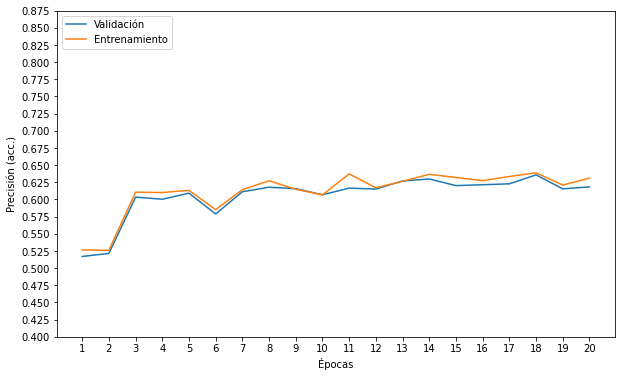

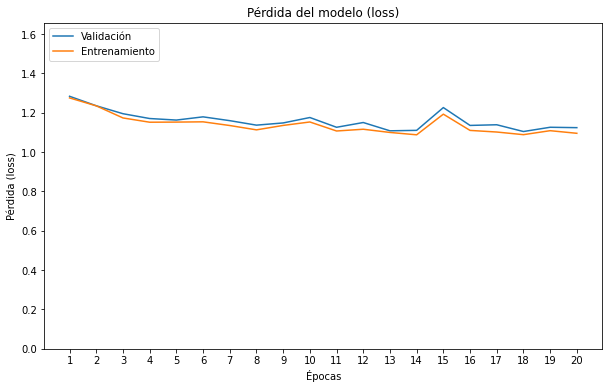

In [ ]:
plot_customHistory(callback=call)

### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 71s 869ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 62s 752ms/step - loss: 1.1157 - acc: 0.6308


[1.1157444715499878, 0.6307732462882996]

Se crea la matriz de confusión:

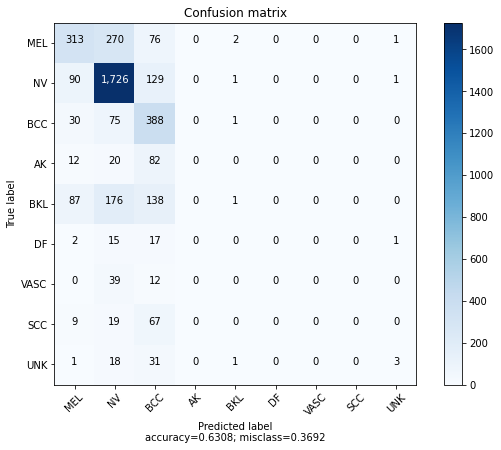

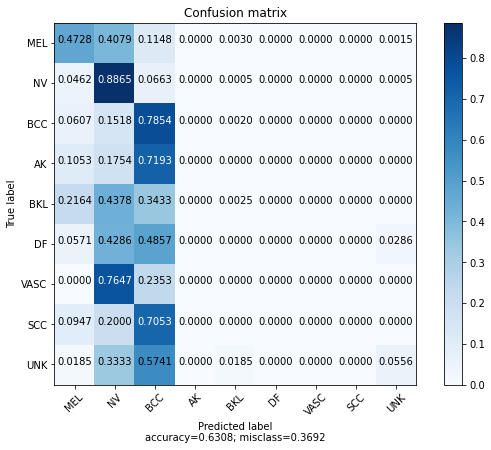

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in true_divide


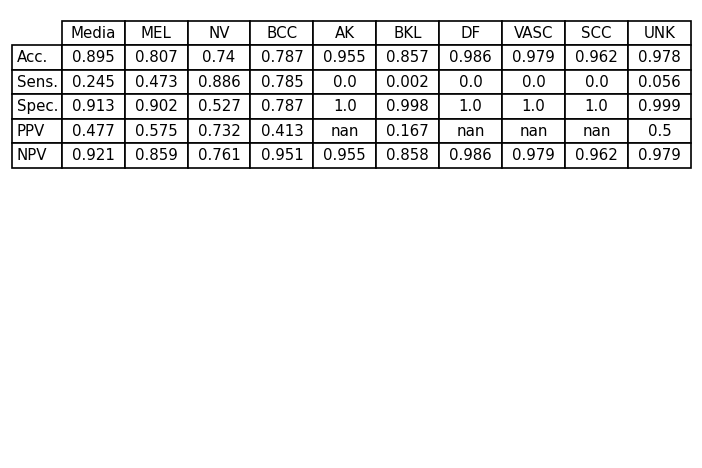

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

# Si PPV es NaN es porque no se ha clasificado ninguna imagen en esa categoría

## B: ISIC+UNK, LR = 1e-4

Se crea el modelo:

In [ ]:
def create_EfficientNetB0():
  # Se crea una red EfficientNetB0 sin el clasificador (include_top = false) y con los pesos de haber sido entrenada con ImageNet
  modelEf = efn.EfficientNetB0(include_top=False, weights='imagenet', input_shape=(224,224,3))

  # Las capas de la red se ponen como no entrenables
  for layer in modelEf.layers:
    layer.trainable = False

  # Se añade nuestro clasificador
  last_layer = modelEf.layers[-1]
  last_output = last_layer.output
  x=keras.layers.Flatten()(last_output)
  x=keras.layers.Dense(128,activation='relu')(x)
  x=keras.layers.Dropout(0.5)(x)
  x=keras.layers.Dense(9,activation='softmax')(x)

  model = keras.Model(modelEf.input, x)

  # Se descongelan las 3 últimas capas, en este caso solo el clasificador
  for layer in model.layers[-3:]:
      layer.trainable=True
  
  return model

In [ ]:
model = create_EfficientNetB0()

Se crea un Callback que sea llamado al final de cada epoch del entrenamiento para calcular la precisión y error durante el entrenamiento. Esto ya lo hace por defecto la función fit() pero las curvas estaban dando un resultado un tanto extraño (la curva de la precisión de validación mucho mayor que la de entrenamiento), por lo que se optó mejor por esta opción, cuyas curvas sí eran coherentes

In [ ]:
class TrainingHistoryEvaluate(tf.keras.callbacks.Callback):
  def __init__(self):
    self.validAcc = [] 
    self.trainAcc = []
    self.validLoss = []
    self.trainLoss = []

  def on_epoch_end(self, epoch, logs=None):
    valid_generator.reset()
    train_generator.reset()

    lossV,accV = model.evaluate(x=valid_generator,steps=STEP_SIZE_VALID,verbose=1)
    lossT,accT = model.evaluate(x=train_generator,steps=STEP_SIZE_TRAIN,verbose=1)

    self.validAcc.append(accV)
    self.trainAcc.append(accT)
    self.validLoss.append(lossV)
    self.trainLoss.append(lossT)

In [ ]:
call = TrainingHistoryEvaluate()

Se eligen optimizador, learning rate y pérdida (loss)

In [ ]:
opt = tf.keras.optimizers.Adam(learning_rate=0.0001)

model.compile(optimizer=opt,loss='categorical_crossentropy',metrics = ['acc'])

Se entrena el modelo:

In [ ]:
history = model.fit(train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=20,
                    callbacks=[call]
                    )

Epoch 1/20
562/562 [==============================] - 1196s 2s/step - loss: 1.3709 - acc: 0.5486 - val_loss: 1.1452 - val_acc: 0.5969
Epoch 2/20
562/562 [==============================] - 1119s 2s/step - loss: 1.2373 - acc: 0.5802 - val_loss: 1.0663 - val_acc: 0.6207
Epoch 3/20
562/562 [==============================] - 1133s 2s/step - loss: 1.2112 - acc: 0.5924 - val_loss: 1.0430 - val_acc: 0.6340
Epoch 4/20
562/562 [==============================] - 1136s 2s/step - loss: 1.1775 - acc: 0.5990 - val_loss: 1.0169 - val_acc: 0.6317
Epoch 5/20
562/562 [==============================] - 1125s 2s/step - loss: 1.1477 - acc: 0.6044 - val_loss: 1.0138 - val_acc: 0.6304
Epoch 6/20
562/562 [==============================] - 1110s 2s/step - loss: 1.1267 - acc: 0.6109 - val_loss: 1.0152 - val_acc: 0.6290
Epoch 7/20
562/562 [==============================] - 1107s 2s/step - loss: 1.1167 - acc: 0.6142 - val_loss: 0.9962 - val_acc: 0.6366
Epoch 8/20
562/562 [==============================] - 1103s 2s

### Gráficas

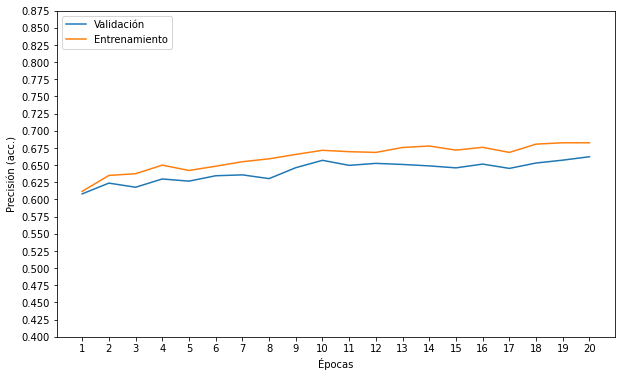

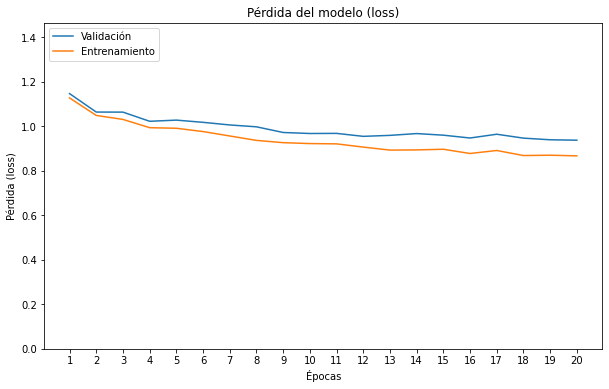

In [ ]:
plot_customHistory(call)

### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 71s 871ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 62s 757ms/step - loss: 0.9259 - acc: 0.6819


[0.9258934855461121, 0.6818889379501343]

Se crea la matriz de confusión:

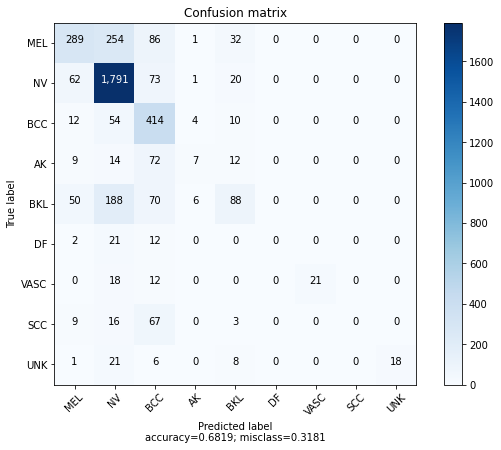

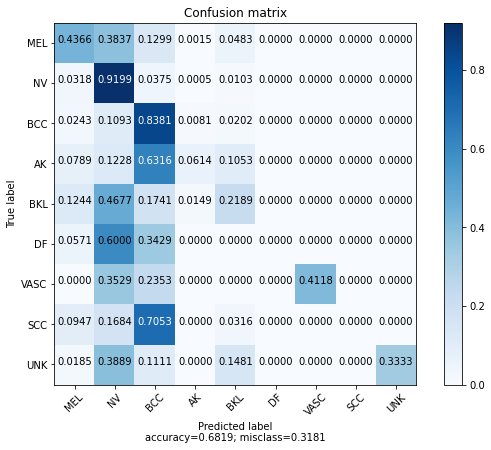

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in true_divide


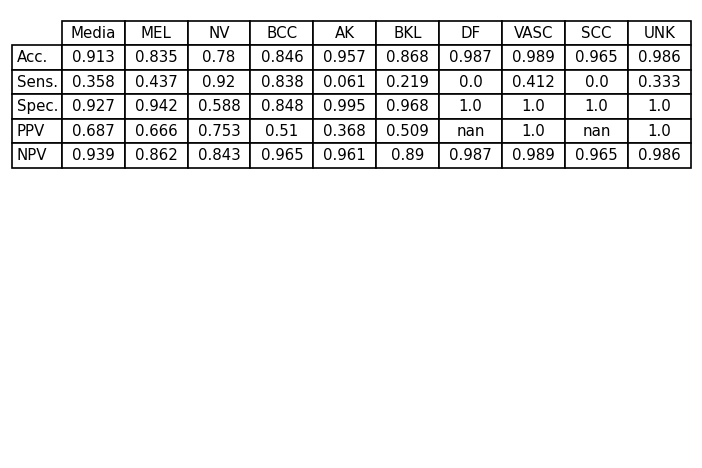

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

# Si PPV es NaN es porque no se ha clasificado ninguna imagen en esa categoría

## C: ISIC+UNK, LR = 1e-5

Se crea el modelo:

In [ ]:
def create_EfficientNetB0():
  # Se crea una red EfficientNetB0 sin el clasificador (include_top = false) y con los pesos de haber sido entrenada con ImageNet
  modelEf = efn.EfficientNetB0(include_top=False, weights='imagenet', input_shape=(224,224,3))

  # Las capas de la red se ponen como no entrenables
  for layer in modelEf.layers:
    layer.trainable = False

  # Se añade nuestro clasificador
  last_layer = modelEf.layers[-1]
  last_output = last_layer.output
  x=keras.layers.Flatten()(last_output)
  x=keras.layers.Dense(128,activation='relu')(x)
  x=keras.layers.Dropout(0.5)(x)
  x=keras.layers.Dense(9,activation='softmax')(x)

  model = keras.Model(modelEf.input, x)

  # Se descongelan las 3 últimas capas, en este caso solo el clasificador
  for layer in model.layers[-3:]:
      layer.trainable=True
  
  return model

In [ ]:
model = create_EfficientNetB0()

16809984/16804768 [==============================] - 1s 0us/step


Se crea un Callback que sea llamado al final de cada epoch del entrenamiento para calcular la precisión y error durante el entrenamiento. Esto ya lo hace por defecto la función fit() pero las curvas estaban dando un resultado un tanto extraño (la curva de la precisión de validación mucho mayor que la de entrenamiento), por lo que se optó mejor por esta opción, cuyas curvas sí eran coherentes

In [ ]:
class TrainingHistoryEvaluate(tf.keras.callbacks.Callback):
  def __init__(self):
    self.validAcc = [] 
    self.trainAcc = []
    self.validLoss = []
    self.trainLoss = []

  def on_epoch_end(self, epoch, logs=None):
    valid_generator.reset()
    train_generator.reset()

    lossV,accV = model.evaluate(x=valid_generator,steps=STEP_SIZE_VALID,verbose=1)
    lossT,accT = model.evaluate(x=train_generator,steps=STEP_SIZE_TRAIN,verbose=1)

    self.validAcc.append(accV)
    self.trainAcc.append(accT)
    self.validLoss.append(lossV)
    self.trainLoss.append(lossT)

In [ ]:
call = TrainingHistoryEvaluate()

Se eligen optimizador, learning rate y pérdida (loss)

In [ ]:
opt = tf.keras.optimizers.Adam(learning_rate=0.00001)

model.compile(optimizer=opt,loss='categorical_crossentropy',metrics = ['acc'])

Se entrena el modelo:

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=20,
                    callbacks=[call]
                    )

Epoch 1/20
562/562 [==============================] - 1068s 2s/step - loss: 1.4411 - acc: 0.5257 - val_loss: 1.1432 - val_acc: 0.6058
Epoch 2/20
562/562 [==============================] - 982s 2s/step - loss: 1.2253 - acc: 0.5840 - val_loss: 1.0873 - val_acc: 0.6204
Epoch 3/20
562/562 [==============================] - 984s 2s/step - loss: 1.1750 - acc: 0.5966 - val_loss: 1.0525 - val_acc: 0.6298
Epoch 4/20
562/562 [==============================] - 983s 2s/step - loss: 1.1434 - acc: 0.6052 - val_loss: 1.0259 - val_acc: 0.6385
Epoch 5/20
562/562 [==============================] - 986s 2s/step - loss: 1.1081 - acc: 0.6183 - val_loss: 1.0048 - val_acc: 0.6437
Epoch 6/20
562/562 [==============================] - 991s 2s/step - loss: 1.0934 - acc: 0.6227 - val_loss: 0.9897 - val_acc: 0.6499
Epoch 7/20
562/562 [==============================] - 993s 2s/step - loss: 1.0742 - acc: 0.6266 - val_loss: 0.9745 - val_acc: 0.6502
Epoch 8/20
562/562 [==============================] - 994s 2s/step -

### Gráficas

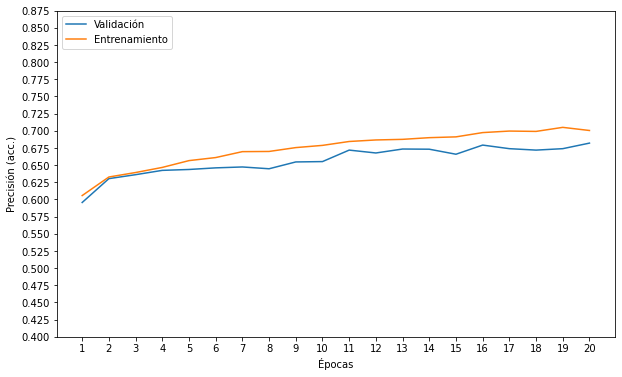

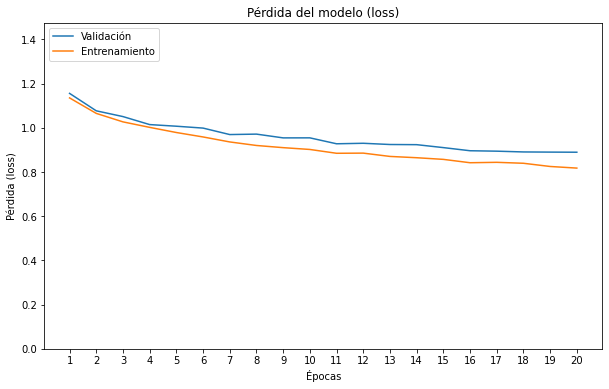

In [ ]:
plot_customHistory(call)

### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST)

pred_label = np.argmax(pred,axis=1)

Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 54s 656ms/step - loss: 0.8797 - acc: 0.6845


[0.8796653151512146, 0.6844836473464966]

Se crea la matriz de confusión:

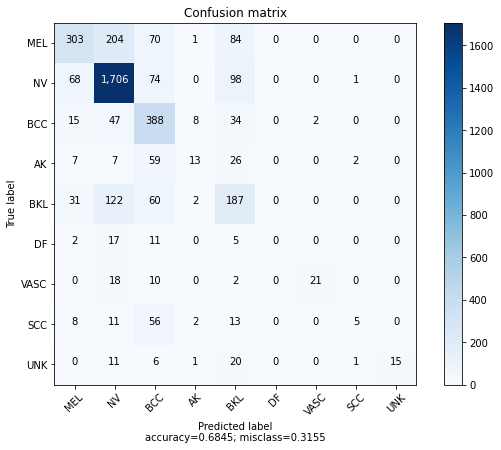

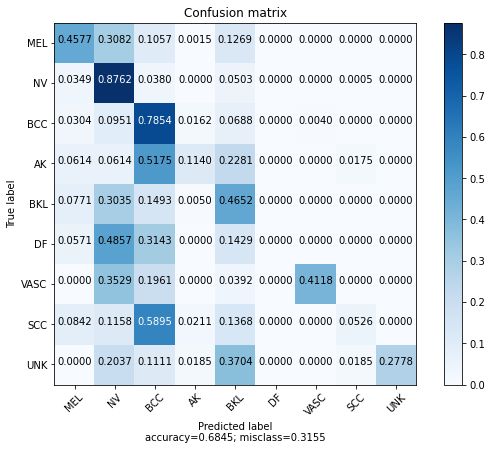

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in true_divide


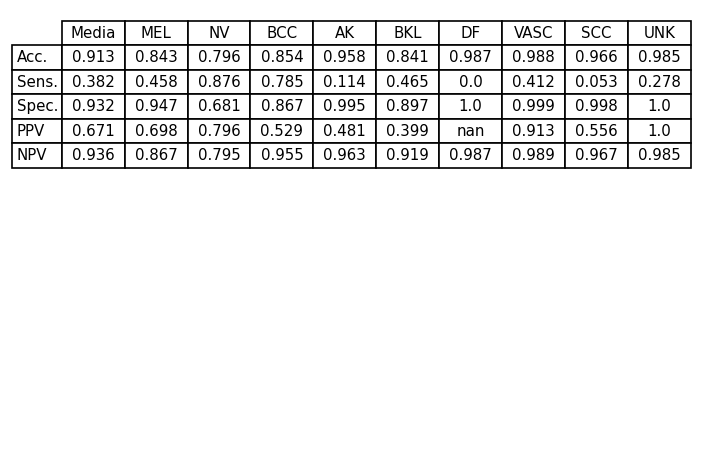

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

# Si PPV es NaN es porque no se ha clasificado ninguna imagen en esa categoría

# AUMENTO DE CAPAS DESCONGELADAS

## D: ISIC+UNK, LR = 1e-4, Descongelando 9 capas

Se crea el modelo:

In [ ]:
def create_EfficientNetB0():
  # Se crea una red EfficientNetB0 sin el clasificador (include_top = false) y con los pesos de haber sido entrenada con ImageNet
  modelEf = efn.EfficientNetB0(include_top=False, weights='imagenet', input_shape=(224,224,3))

  # Las capas de la red se ponen como no entrenables
  for layer in modelEf.layers:
    layer.trainable = False

  # Se añade nuestro clasificador
  last_layer = modelEf.layers[-1]
  last_output = last_layer.output
  x=keras.layers.Flatten()(last_output)
  x=keras.layers.Dense(128,activation='relu')(x)
  x=keras.layers.Dropout(0.5)(x)
  x=keras.layers.Dense(9,activation='softmax')(x)

  model = keras.Model(modelEf.input, x)

  # Se descongelan las 9 últimas capas
  for layer in model.layers[-9:]:
      layer.trainable=True
  
  return model

In [ ]:
model = create_EfficientNetB0()

16809984/16804768 [==============================] - 0s 0us/step


Se crea un Callback que sea llamado al final de cada epoch del entrenamiento para calcular la precisión y error durante el entrenamiento. Esto ya lo hace por defecto la función fit() pero las curvas estaban dando un resultado un tanto extraño (la curva de la precisión de validación mucho mayor que la de entrenamiento), por lo que se optó mejor por esta opción, cuyas curvas sí eran coherentes

In [ ]:
class TrainingHistoryEvaluate(tf.keras.callbacks.Callback):
  def __init__(self):
    self.validAcc = [] 
    self.trainAcc = []
    self.validLoss = []
    self.trainLoss = []

  def on_epoch_end(self, epoch, logs=None):
    valid_generator.reset()
    train_generator.reset()

    lossV,accV = model.evaluate(x=valid_generator,steps=STEP_SIZE_VALID,verbose=1)
    lossT,accT = model.evaluate(x=train_generator,steps=STEP_SIZE_TRAIN,verbose=1)

    self.validAcc.append(accV)
    self.trainAcc.append(accT)
    self.validLoss.append(lossV)
    self.trainLoss.append(lossT)

In [ ]:
call = TrainingHistoryEvaluate()

Se eligen optimizador, learning rate y pérdida (loss)

In [ ]:
opt = tf.keras.optimizers.Adam(learning_rate=0.0001)

model.compile(optimizer=opt,loss='categorical_crossentropy',metrics = ['acc'])

Se entrena el modelo:

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=20,
                    callbacks=[call]
                    )

Epoch 1/20
562/562 [==============================] - 1039s 2s/step - loss: 1.3404 - acc: 0.5566 - val_loss: 0.9819 - val_acc: 0.6507
Epoch 2/20
562/562 [==============================] - 996s 2s/step - loss: 1.1378 - acc: 0.6114 - val_loss: 0.9421 - val_acc: 0.6622
Epoch 3/20
562/562 [==============================] - 1019s 2s/step - loss: 1.0843 - acc: 0.6256 - val_loss: 0.8861 - val_acc: 0.6784
Epoch 4/20
562/562 [==============================] - 1015s 2s/step - loss: 1.0318 - acc: 0.6442 - val_loss: 0.8611 - val_acc: 0.6860
Epoch 5/20
562/562 [==============================] - 1005s 2s/step - loss: 0.9790 - acc: 0.6610 - val_loss: 0.8510 - val_acc: 0.6917
Epoch 6/20
562/562 [==============================] - 978s 2s/step - loss: 0.9641 - acc: 0.6648 - val_loss: 0.8363 - val_acc: 0.7056
Epoch 7/20
562/562 [==============================] - 975s 2s/step - loss: 0.9469 - acc: 0.6678 - val_loss: 0.8389 - val_acc: 0.6993
Epoch 8/20
562/562 [==============================] - 975s 2s/ste

### Gráficas

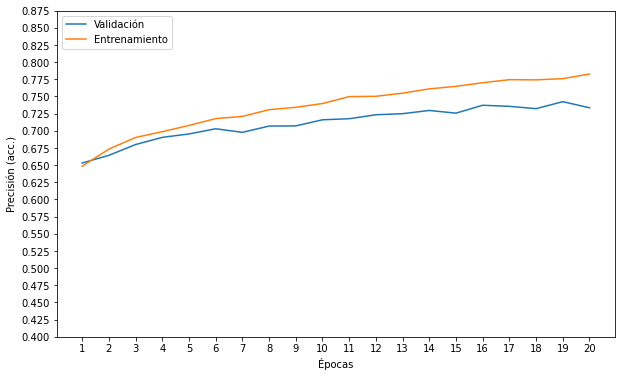

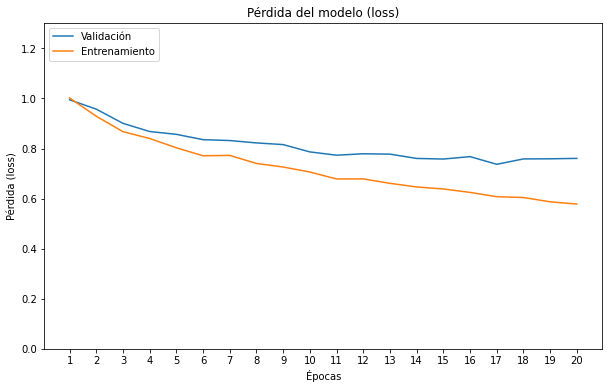

In [ ]:
plot_customHistory(call)

### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 62s 758ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 54s 662ms/step - loss: 0.7798 - acc: 0.7353


[0.7797724008560181, 0.735339879989624]

Se crea la matriz de confusión:

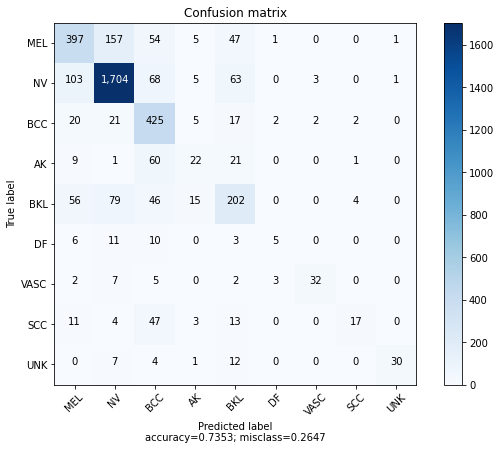

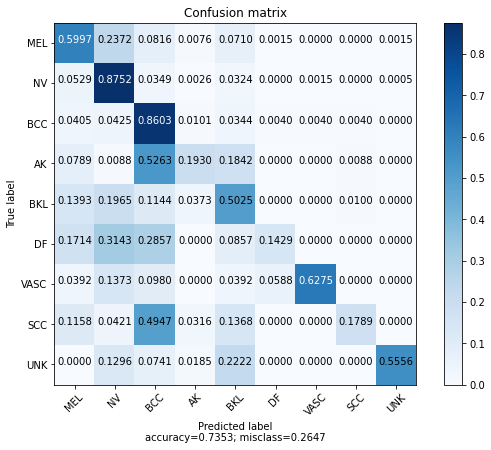

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

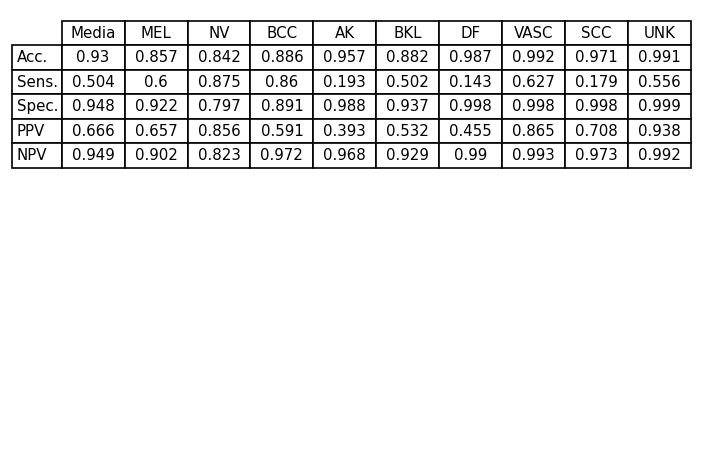

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

## E: ISIC+UNK, LR = 1e-5, Descongelando 9 capas

Se crea el modelo:

In [ ]:
def create_EfficientNetB0():
  # Se crea una red EfficientNetB0 sin el clasificador (include_top = false) y con los pesos de haber sido entrenada con ImageNet
  modelEf = efn.EfficientNetB0(include_top=False, weights='imagenet', input_shape=(224,224,3))

  # Las capas de la red se ponen como no entrenables
  for layer in modelEf.layers:
    layer.trainable = False

  # Se añade nuestro clasificador
  last_layer = modelEf.layers[-1]
  last_output = last_layer.output
  x=keras.layers.Flatten()(last_output)
  x=keras.layers.Dense(128,activation='relu')(x)
  x=keras.layers.Dropout(0.5)(x)
  x=keras.layers.Dense(9,activation='softmax')(x)

  model = keras.Model(modelEf.input, x)

  # Se descongelan las 9 últimas capas
  for layer in model.layers[-9:]:
      layer.trainable=True
  
  return model

In [ ]:
model = create_EfficientNetB0()

Se crea un Callback que sea llamado al final de cada epoch del entrenamiento para calcular la precisión y error durante el entrenamiento. Esto ya lo hace por defecto la función fit() pero las curvas estaban dando un resultado un tanto extraño (la curva de la precisión de validación mucho mayor que la de entrenamiento), por lo que se optó mejor por esta opción, cuyas curvas sí eran coherentes

In [ ]:
class TrainingHistoryEvaluate(tf.keras.callbacks.Callback):
  def __init__(self):
    self.validAcc = [] 
    self.trainAcc = []
    self.validLoss = []
    self.trainLoss = []

  def on_epoch_end(self, epoch, logs=None):
    valid_generator.reset()
    train_generator.reset()

    lossV,accV = model.evaluate(x=valid_generator,steps=STEP_SIZE_VALID,verbose=1)
    lossT,accT = model.evaluate(x=train_generator,steps=STEP_SIZE_TRAIN,verbose=1)

    self.validAcc.append(accV)
    self.trainAcc.append(accT)
    self.validLoss.append(lossV)
    self.trainLoss.append(lossT)

In [ ]:
call = TrainingHistoryEvaluate()

Se eligen optimizador, learning rate y pérdida (loss)

In [ ]:
opt = tf.keras.optimizers.Adam(learning_rate=0.00001)

model.compile(optimizer=opt,loss='categorical_crossentropy',metrics = ['acc'])

Se entrena el modelo:

In [ ]:
history = model.fit(train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=20,
                    callbacks=[call]
                    )

Epoch 1/20
562/562 [==============================] - 987s 2s/step - loss: 1.5051 - acc: 0.5065 - val_loss: 1.1491 - val_acc: 0.6021
Epoch 2/20
562/562 [==============================] - 989s 2s/step - loss: 1.2395 - acc: 0.5729 - val_loss: 1.0818 - val_acc: 0.6202
Epoch 3/20
562/562 [==============================] - 999s 2s/step - loss: 1.1680 - acc: 0.5923 - val_loss: 1.0298 - val_acc: 0.6374
Epoch 4/20
562/562 [==============================] - 996s 2s/step - loss: 1.1284 - acc: 0.6052 - val_loss: 1.0199 - val_acc: 0.6364
Epoch 5/20
562/562 [==============================] - 990s 2s/step - loss: 1.0948 - acc: 0.6210 - val_loss: 0.9897 - val_acc: 0.6494
Epoch 6/20
562/562 [==============================] - 982s 2s/step - loss: 1.0681 - acc: 0.6273 - val_loss: 0.9683 - val_acc: 0.6575
Epoch 7/20
562/562 [==============================] - 977s 2s/step - loss: 1.0389 - acc: 0.6355 - val_loss: 0.9521 - val_acc: 0.6588
Epoch 8/20
562/562 [==============================] - 972s 2s/step - 

### Gráficas

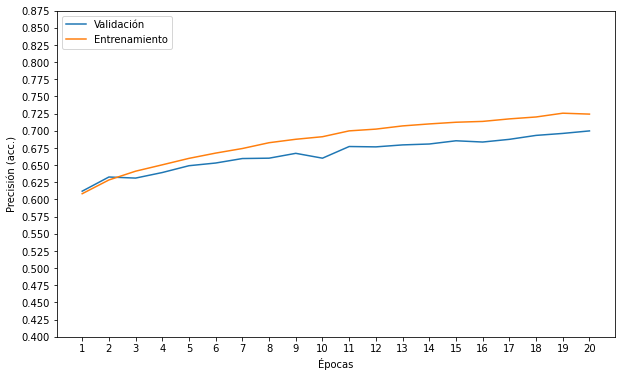

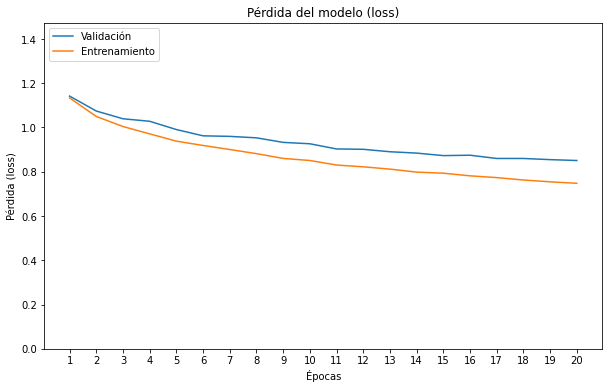

In [ ]:
plot_customHistory(call)

### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 53s 647ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 53s 649ms/step - loss: 0.8269 - acc: 0.7099


[0.8268939256668091, 0.7099117636680603]

Se crea la matriz de confusión:

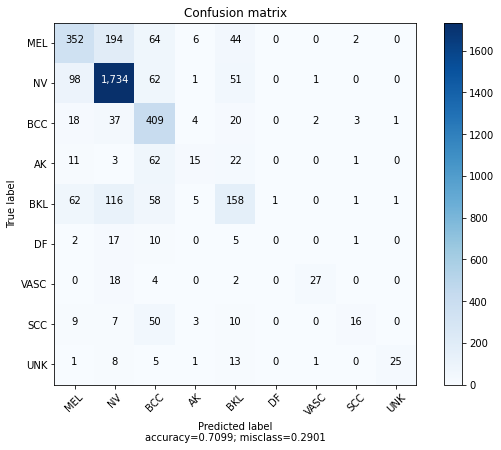

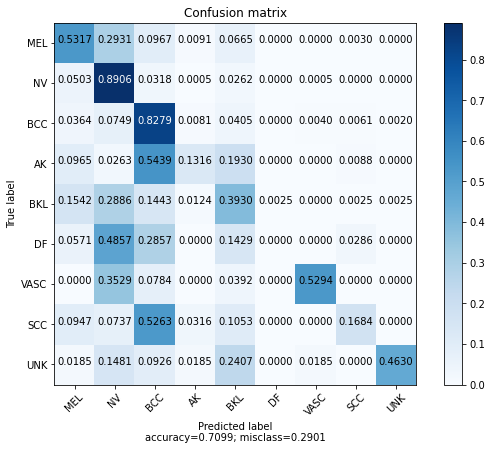

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

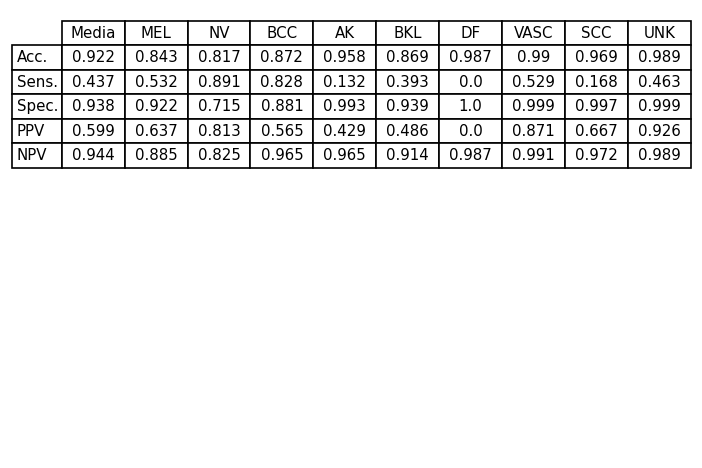

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

# INTRODUCCIÓN L2

## F: ISIC+UNK, LR = 1e-4, Descongelando 9 capas, L2 = 0.01

Se crea el modelo:

In [ ]:
def create_EfficientNetB0():
  # Se crea una red EfficientNetB0 sin el clasificador (include_top = false) y con los pesos de haber sido entrenada con ImageNet
  modelEf = efn.EfficientNetB0(include_top=False, weights='imagenet', input_shape=(224,224,3))

  # Las capas de la red se ponen como no entrenables
  for layer in modelEf.layers:
    layer.trainable = False

  # Se añade nuestro clasificador
  last_layer = modelEf.layers[-1]
  last_output = last_layer.output
  x=keras.layers.Flatten()(last_output)
  x=keras.layers.Dense(128,activation='relu',kernel_regularizer=regularizers.l2(0.01))(x) # Se añade regularización L2
  x=keras.layers.Dropout(0.5)(x)
  x=keras.layers.Dense(9,activation='softmax')(x)

  model = keras.Model(modelEf.input, x)

  # Se descongelan las 9 últimas capas
  for layer in model.layers[-9:]:
      layer.trainable=True
  
  return model

In [ ]:
model = create_EfficientNetB0()

16809984/16804768 [==============================] - 2s 0us/step


Se crea un Callback que sea llamado al final de cada epoch del entrenamiento para calcular la precisión y error durante el entrenamiento. Esto ya lo hace por defecto la función fit() pero las curvas estaban dando un resultado un tanto extraño (la curva de la precisión de validación mucho mayor que la de entrenamiento), por lo que se optó mejor por esta opción, cuyas curvas sí eran coherentes

In [ ]:
class TrainingHistoryEvaluate(tf.keras.callbacks.Callback):
  def __init__(self):
    self.validAcc = [] 
    self.trainAcc = []
    self.validLoss = []
    self.trainLoss = []

  def on_epoch_end(self, epoch, logs=None):
    valid_generator.reset()
    train_generator.reset()

    lossV,accV = model.evaluate(x=valid_generator,steps=STEP_SIZE_VALID,verbose=1)
    lossT,accT = model.evaluate(x=train_generator,steps=STEP_SIZE_TRAIN,verbose=1)

    self.validAcc.append(accV)
    self.trainAcc.append(accT)
    self.validLoss.append(lossV)
    self.trainLoss.append(lossT)

In [ ]:
call = TrainingHistoryEvaluate()

Se eligen optimizador, learning rate y pérdida (loss)

In [ ]:
opt = tf.keras.optimizers.Adam(learning_rate=0.0001)

model.compile(optimizer=opt,loss='categorical_crossentropy',metrics = ['acc'])

Se entrena el modelo:

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=20,
                    callbacks=[call]
                    )

Epoch 1/20
562/562 [==============================] - 1059s 2s/step - loss: 3.4527 - acc: 0.5661 - val_loss: 2.7579 - val_acc: 0.6403
Epoch 2/20
562/562 [==============================] - 977s 2s/step - loss: 2.4987 - acc: 0.6112 - val_loss: 2.0875 - val_acc: 0.6633
Epoch 3/20
562/562 [==============================] - 979s 2s/step - loss: 1.9782 - acc: 0.6364 - val_loss: 1.7515 - val_acc: 0.6614
Epoch 4/20
562/562 [==============================] - 980s 2s/step - loss: 1.7011 - acc: 0.6516 - val_loss: 1.5553 - val_acc: 0.6810
Epoch 5/20
562/562 [==============================] - 980s 2s/step - loss: 1.5495 - acc: 0.6590 - val_loss: 1.4548 - val_acc: 0.6863
Epoch 6/20
562/562 [==============================] - 987s 2s/step - loss: 1.4607 - acc: 0.6699 - val_loss: 1.3812 - val_acc: 0.6902
Epoch 7/20
562/562 [==============================] - 994s 2s/step - loss: 1.3961 - acc: 0.6743 - val_loss: 1.3440 - val_acc: 0.6964
Epoch 8/20
562/562 [==============================] - 995s 2s/step -

### Gráficas

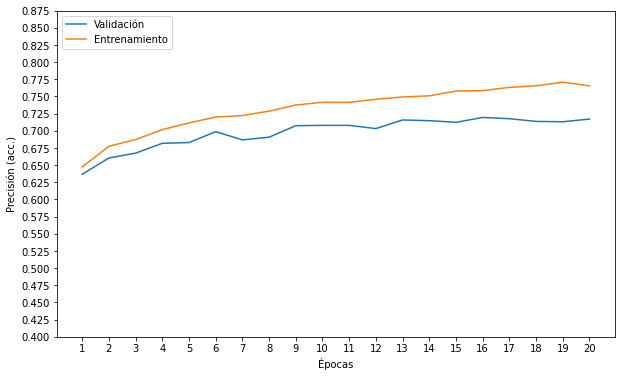

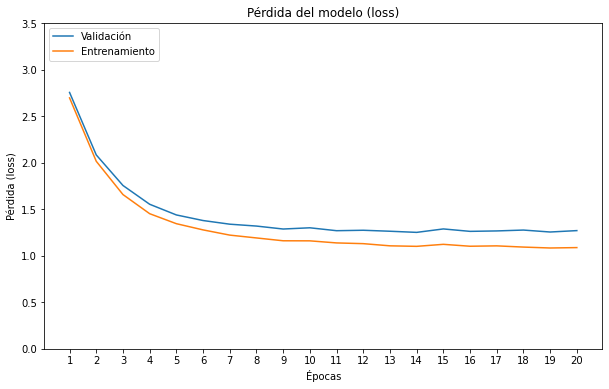

In [ ]:
plot_customHistory(call)

### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 64s 777ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 56s 688ms/step - loss: 1.2761 - acc: 0.7135


[1.2760930061340332, 0.7135443687438965]

Se crea la matriz de confusión:

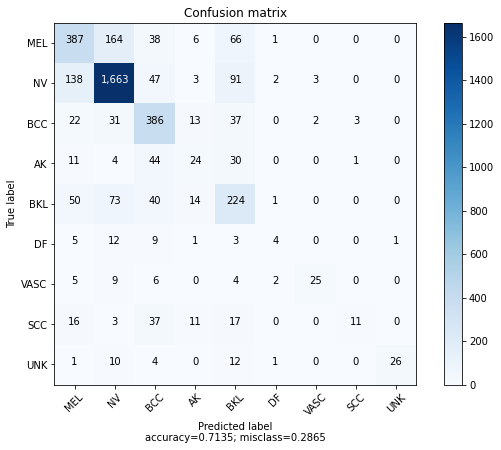

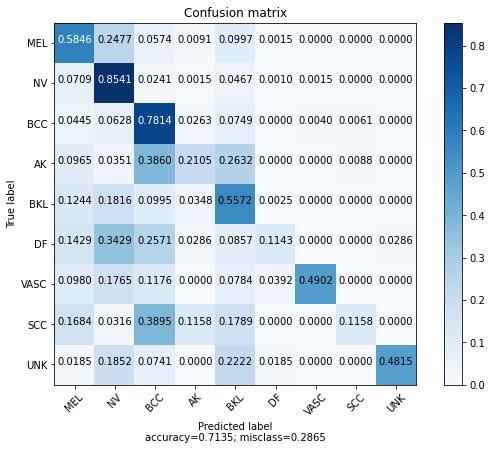

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

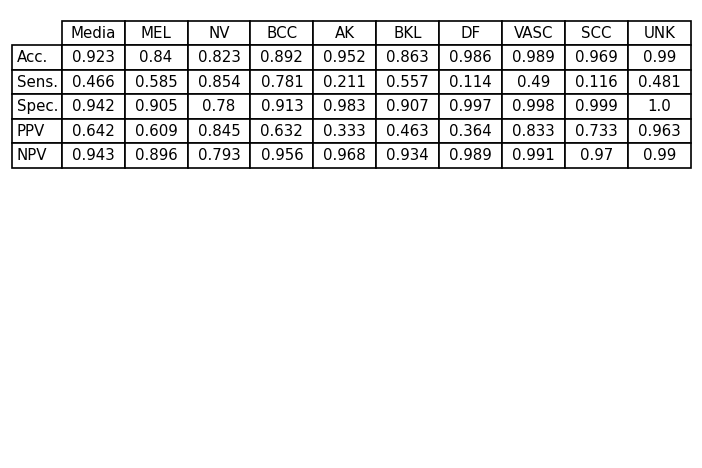

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

## G: ISIC+UNK, LR = 1e-5, Descongelando 9 capas, L2 = 0.01

Se crea el modelo:

In [ ]:
def create_EfficientNetB0():
  # Se crea una red EfficientNetB0 sin el clasificador (include_top = false) y con los pesos de haber sido entrenada con ImageNet
  modelEf = efn.EfficientNetB0(include_top=False, weights='imagenet', input_shape=(224,224,3))

  # Las capas de la red se ponen como no entrenables
  for layer in modelEf.layers:
    layer.trainable = False

  # Se añade nuestro clasificador
  last_layer = modelEf.layers[-1]
  last_output = last_layer.output
  x=keras.layers.Flatten()(last_output)
  x=keras.layers.Dense(128,activation='relu',kernel_regularizer=regularizers.l2(0.01))(x)  # Se añade regularización L2
  x=keras.layers.Dropout(0.5)(x)
  x=keras.layers.Dense(9,activation='softmax')(x)

  model = keras.Model(modelEf.input, x)

  # Se descongelan las 9 últimas capas
  for layer in model.layers[-9:]:
      layer.trainable=True
  
  return model

In [ ]:
model = create_EfficientNetB0()

16809984/16804768 [==============================] - 0s 0us/step


Se crea un Callback que sea llamado al final de cada epoch del entrenamiento para calcular la precisión y error durante el entrenamiento. Esto ya lo hace por defecto la función fit() pero las curvas estaban dando un resultado un tanto extraño (la curva de la precisión de validación mucho mayor que la de entrenamiento), por lo que se optó mejor por esta opción, cuyas curvas sí eran coherentes

In [ ]:
class TrainingHistoryEvaluate(tf.keras.callbacks.Callback):
  def __init__(self):
    self.validAcc = [] 
    self.trainAcc = []
    self.validLoss = []
    self.trainLoss = []

  def on_epoch_end(self, epoch, logs=None):
    valid_generator.reset()
    train_generator.reset()

    lossV,accV = model.evaluate(x=valid_generator,steps=STEP_SIZE_VALID,verbose=1)
    lossT,accT = model.evaluate(x=train_generator,steps=STEP_SIZE_TRAIN,verbose=1)

    self.validAcc.append(accV)
    self.trainAcc.append(accT)
    self.validLoss.append(lossV)
    self.trainLoss.append(lossT)

In [ ]:
call = TrainingHistoryEvaluate()

Se eligen optimizador, learning rate y pérdida (loss)

In [ ]:
opt = tf.keras.optimizers.Adam(learning_rate=0.00001)

model.compile(optimizer=opt,loss='categorical_crossentropy',metrics = ['acc'])

Se entrena el modelo:

In [ ]:
history = model.fit(train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=20,
                    callbacks=[call]
                    )

Epoch 1/20
562/562 [==============================] - 1218s 2s/step - loss: 4.0308 - acc: 0.5067 - val_loss: 3.6613 - val_acc: 0.5951
Epoch 2/20
562/562 [==============================] - 1103s 2s/step - loss: 3.6735 - acc: 0.5807 - val_loss: 3.4926 - val_acc: 0.6162
Epoch 3/20
562/562 [==============================] - 1123s 2s/step - loss: 3.5164 - acc: 0.6038 - val_loss: 3.3498 - val_acc: 0.6309
Epoch 4/20
562/562 [==============================] - 1099s 2s/step - loss: 3.3750 - acc: 0.6100 - val_loss: 3.2074 - val_acc: 0.6387
Epoch 5/20
562/562 [==============================] - 1147s 2s/step - loss: 3.2374 - acc: 0.6227 - val_loss: 3.0804 - val_acc: 0.6437
Epoch 6/20
562/562 [==============================] - 1154s 2s/step - loss: 3.1023 - acc: 0.6313 - val_loss: 2.9601 - val_acc: 0.6601
Epoch 7/20
562/562 [==============================] - 1120s 2s/step - loss: 2.9811 - acc: 0.6423 - val_loss: 2.8436 - val_acc: 0.6557
Epoch 8/20
562/562 [==============================] - 1145s 2s

### Gráficas

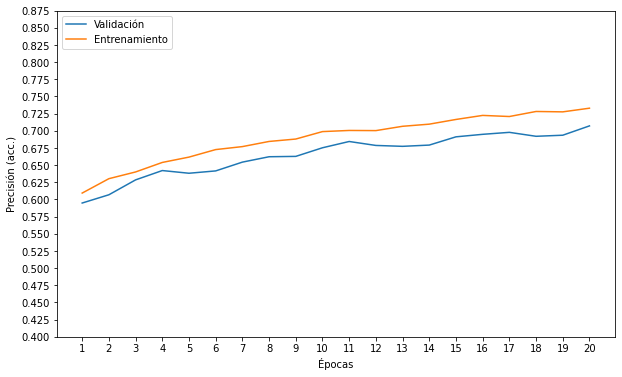

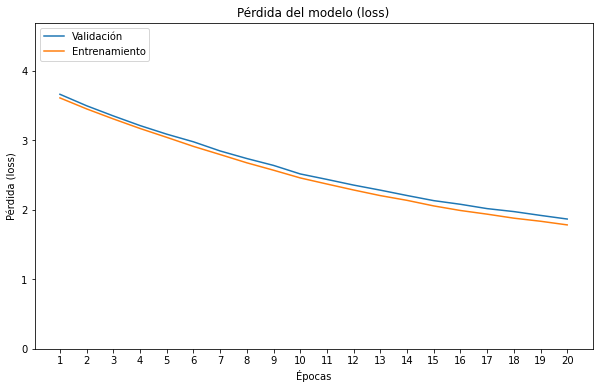

In [ ]:
plot_customHistory(call)

### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 71s 869ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 62s 762ms/step - loss: 1.8612 - acc: 0.7109


[1.8611843585968018, 0.7109496593475342]

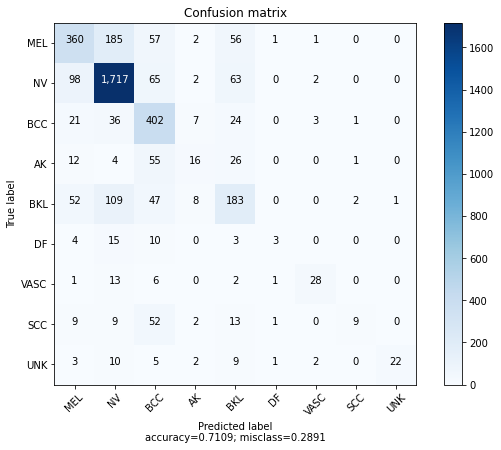

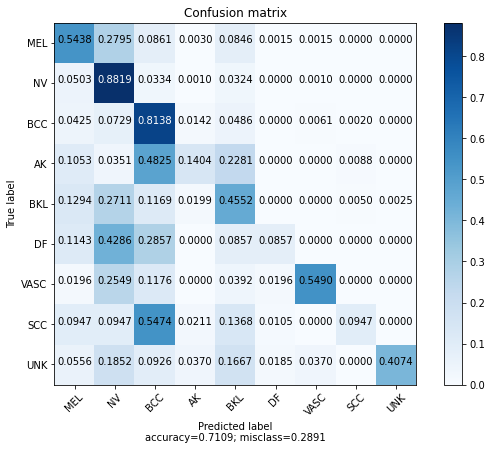

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

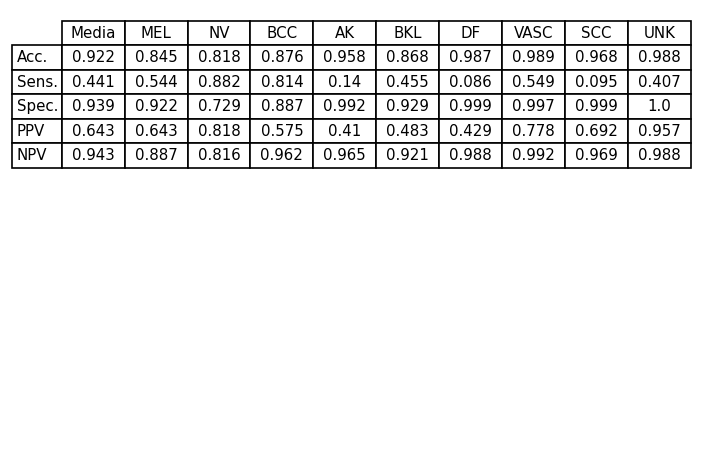

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

# REDUCCIÓN DE NEURONAS (SIN L2)

## H: ISIC+UNK, Dropout=0.5, LR = 1e-4, Descongelando 9 capas, Neuronas a la mitad DATAFRAME

Se crea el modelo:

In [ ]:
def create_EfficientNetB0():
  # Se crea una red EfficientNetB0 sin el clasificador (include_top = false) y con los pesos de haber sido entrenada con ImageNet
  modelEf = efn.EfficientNetB0(include_top=False, weights='imagenet', input_shape=(224,224,3))

  # Las capas de la red se ponen como no entrenables
  for layer in modelEf.layers:
    layer.trainable = False

  # Se añade nuestro clasificador
  last_layer = modelEf.layers[-1]
  last_output = last_layer.output
  x=keras.layers.Flatten()(last_output)
  x=keras.layers.Dense(64,activation='relu')(x) # Reducción de neuronas
  x=keras.layers.Dropout(0.5)(x)
  x=keras.layers.Dense(9,activation='softmax')(x)

  model = keras.Model(modelEf.input, x)

  # Se descongelan las 9 últimas capas
  for layer in model.layers[-9:]:
      layer.trainable=True
  
  return model

In [ ]:
model = create_EfficientNetB0()

16809984/16804768 [==============================] - 0s 0us/step


Se crea un Callback que sea llamado al final de cada epoch del entrenamiento para calcular la precisión y error durante el entrenamiento. Esto ya lo hace por defecto la función fit() pero las curvas estaban dando un resultado un tanto extraño (la curva de la precisión de validación mucho mayor que la de entrenamiento), por lo que se optó mejor por esta opción, cuyas curvas sí eran coherentes

In [ ]:
class TrainingHistoryEvaluate(tf.keras.callbacks.Callback):
  def __init__(self):
    self.validAcc = [] 
    self.trainAcc = []
    self.validLoss = []
    self.trainLoss = []

  def on_epoch_end(self, epoch, logs=None):
    valid_generator.reset()
    train_generator.reset()

    lossV,accV = model.evaluate(x=valid_generator,steps=STEP_SIZE_VALID,verbose=1)
    lossT,accT = model.evaluate(x=train_generator,steps=STEP_SIZE_TRAIN,verbose=1)

    self.validAcc.append(accV)
    self.trainAcc.append(accT)
    self.validLoss.append(lossV)
    self.trainLoss.append(lossT)

In [ ]:
call = TrainingHistoryEvaluate()

Se eligen optimizador, learning rate y pérdida (loss)

In [ ]:
opt = tf.keras.optimizers.Adam(learning_rate=0.0001)

model.compile(optimizer=opt,loss='categorical_crossentropy',metrics = ['acc'])

Se entrena el modelo. Primero se entrena por 20 epochs, para comparar con todos los anteriores, que también se han entrenado por 20 epochs. Después se sigue hasta 50 ya que en la siguiente prueba (incorporar otros datasets) se entrenarán por 50, ya que de ahí saldrá el modelo final:

### 20 epochs

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=20,
                    callbacks=[call]
                    )

Epoch 1/20
562/562 [==============================] - 1155s 2s/step - loss: 1.4367 - acc: 0.5355 - val_loss: 1.0755 - val_acc: 0.6306
Epoch 2/20
562/562 [==============================] - 1091s 2s/step - loss: 1.2630 - acc: 0.5759 - val_loss: 1.0205 - val_acc: 0.6479
Epoch 3/20
562/562 [==============================] - 1090s 2s/step - loss: 1.1879 - acc: 0.5984 - val_loss: 0.9704 - val_acc: 0.6607
Epoch 4/20
562/562 [==============================] - 1093s 2s/step - loss: 1.1401 - acc: 0.6174 - val_loss: 0.9236 - val_acc: 0.6748
Epoch 5/20
562/562 [==============================] - 1094s 2s/step - loss: 1.0967 - acc: 0.6282 - val_loss: 0.9132 - val_acc: 0.6818
Epoch 6/20
562/562 [==============================] - 1099s 2s/step - loss: 1.0720 - acc: 0.6320 - val_loss: 0.9101 - val_acc: 0.6917
Epoch 7/20
562/562 [==============================] - 1085s 2s/step - loss: 1.0415 - acc: 0.6429 - val_loss: 0.8842 - val_acc: 0.6920
Epoch 8/20
562/562 [==============================] - 1090s 2s

#### Gráficas

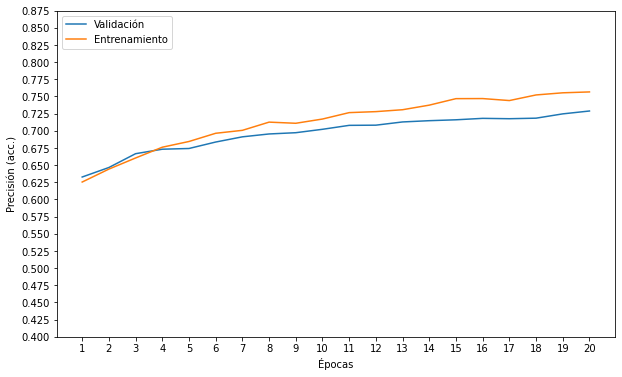

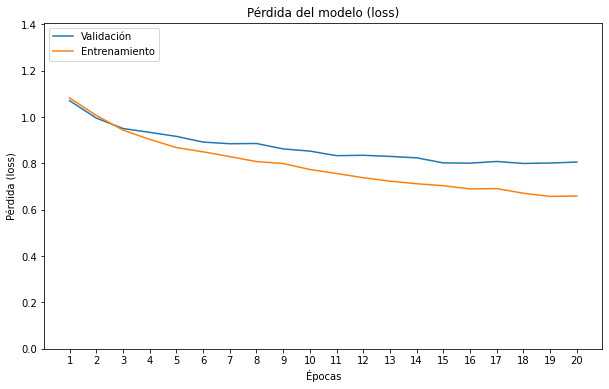

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 69s 841ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 60s 726ms/step - loss: 0.7814 - acc: 0.7218


[0.7813608646392822, 0.721847414970398]

Se crea la matriz de confusión:

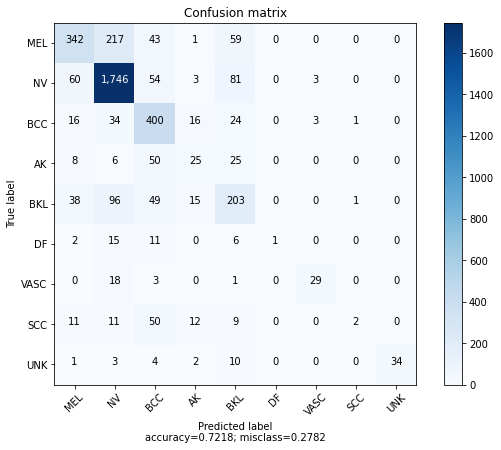

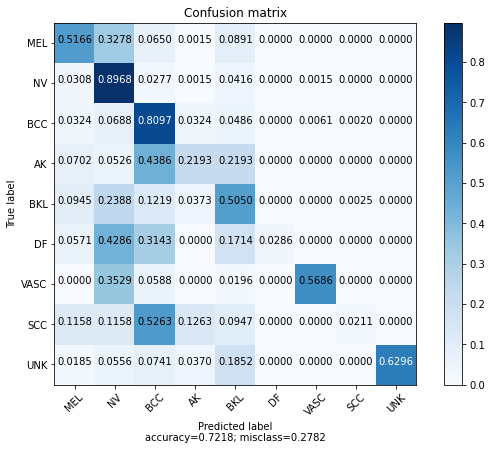

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

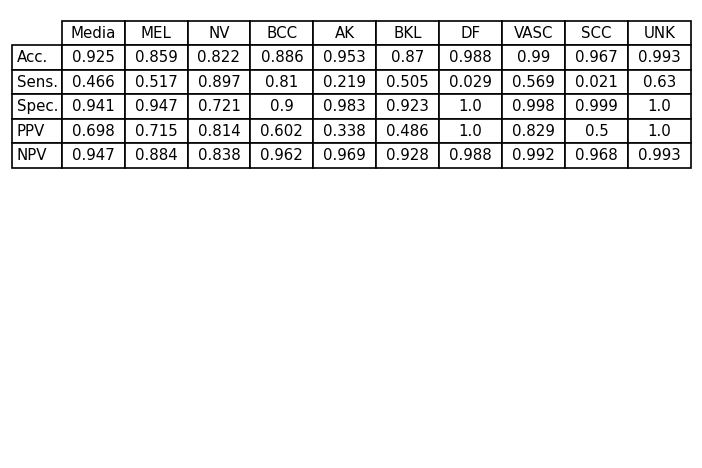

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

### 30 epochs

In [ ]:
model = load_model('/content/drive/My Drive/efficientNet7C4.h5') # se cargó el modelo para cotinuar el entrenamiento hasta 50 epoch

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=10,
                    callbacks=[call]
                    )

Epoch 1/10
562/562 [==============================] - 1052s 2s/step - loss: 0.8524 - acc: 0.6960 - val_loss: 0.7135 - val_acc: 0.7419
Epoch 2/10
562/562 [==============================] - 991s 2s/step - loss: 0.8477 - acc: 0.6989 - val_loss: 0.7064 - val_acc: 0.7406
Epoch 3/10
562/562 [==============================] - 990s 2s/step - loss: 0.8255 - acc: 0.7027 - val_loss: 0.7358 - val_acc: 0.7354
Epoch 4/10
562/562 [==============================] - 1025s 2s/step - loss: 0.8235 - acc: 0.7016 - val_loss: 0.7146 - val_acc: 0.7416
Epoch 5/10
562/562 [==============================] - 1045s 2s/step - loss: 0.8233 - acc: 0.7068 - val_loss: 0.7193 - val_acc: 0.7401
Epoch 6/10
562/562 [==============================] - 1054s 2s/step - loss: 0.8148 - acc: 0.7083 - val_loss: 0.7191 - val_acc: 0.7385
Epoch 7/10
562/562 [==============================] - 1073s 2s/step - loss: 0.7922 - acc: 0.7161 - val_loss: 0.7181 - val_acc: 0.7458
Epoch 8/10
562/562 [==============================] - 981s 2s/st

#### Gráficas

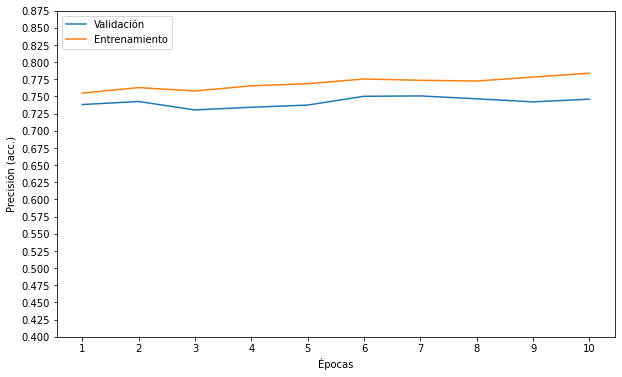

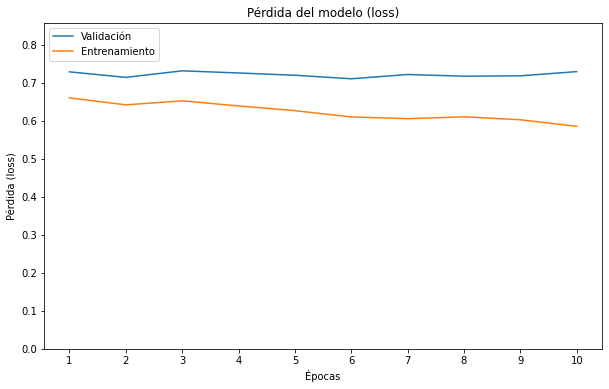

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 65s 797ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 57s 690ms/step - loss: 0.8022 - acc: 0.7206


[0.8021650910377502, 0.7205500602722168]

Se crea la matriz de confusión:

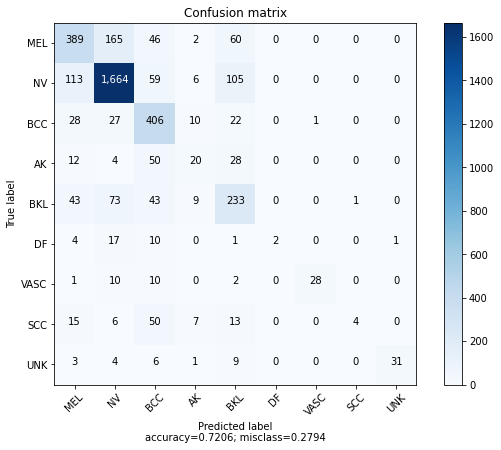

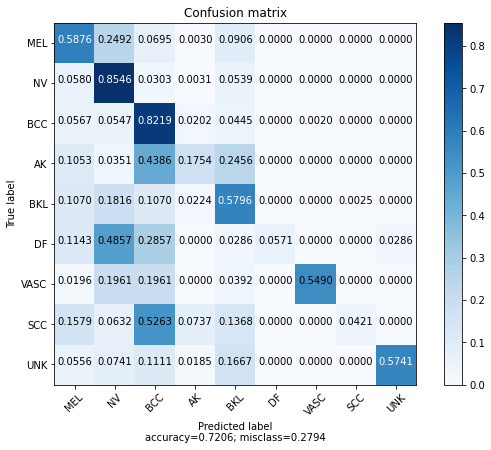

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

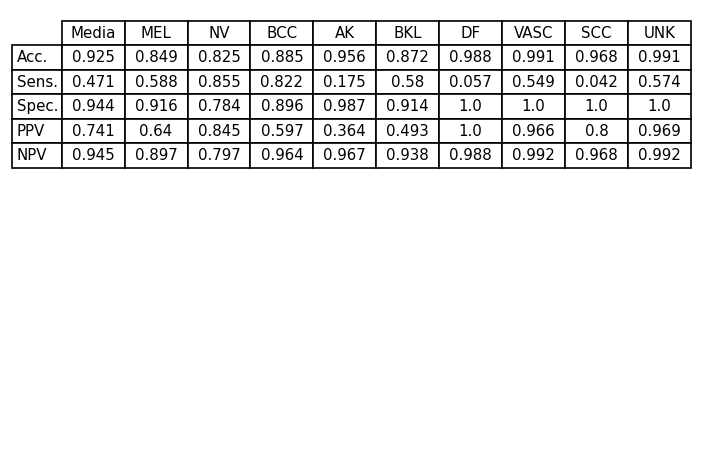

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

### 40 epochs

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=10,
                    callbacks=[call]
                    )

Epoch 1/10
562/562 [==============================] - 989s 2s/step - loss: 0.7740 - acc: 0.7228 - val_loss: 0.7178 - val_acc: 0.7531
Epoch 2/10
562/562 [==============================] - 998s 2s/step - loss: 0.7554 - acc: 0.7229 - val_loss: 0.7149 - val_acc: 0.7461
Epoch 3/10
562/562 [==============================] - 981s 2s/step - loss: 0.7622 - acc: 0.7274 - val_loss: 0.7066 - val_acc: 0.7508
Epoch 4/10
562/562 [==============================] - 991s 2s/step - loss: 0.7408 - acc: 0.7337 - val_loss: 0.7175 - val_acc: 0.7510
Epoch 5/10
562/562 [==============================] - 997s 2s/step - loss: 0.7471 - acc: 0.7311 - val_loss: 0.7193 - val_acc: 0.7495
Epoch 6/10
562/562 [==============================] - 1001s 2s/step - loss: 0.7433 - acc: 0.7338 - val_loss: 0.7057 - val_acc: 0.7466
Epoch 7/10
562/562 [==============================] - 1002s 2s/step - loss: 0.7354 - acc: 0.7354 - val_loss: 0.7214 - val_acc: 0.7557
Epoch 8/10
562/562 [==============================] - 989s 2s/step 

#### Gráficas

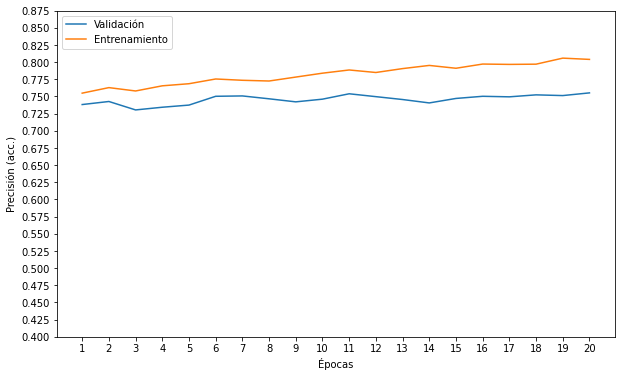

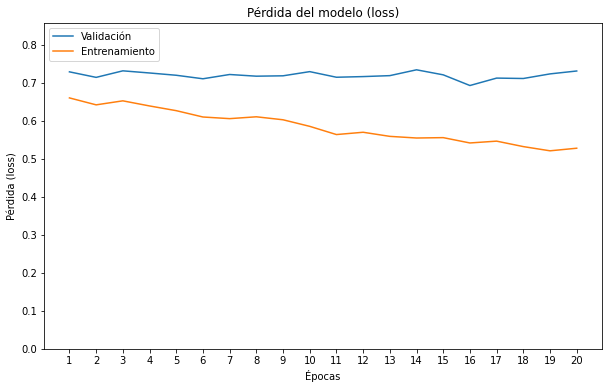

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 53s 647ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 53s 648ms/step - loss: 0.7795 - acc: 0.7356


[0.7795397043228149, 0.7355993986129761]

Se crea la matriz de confusión:

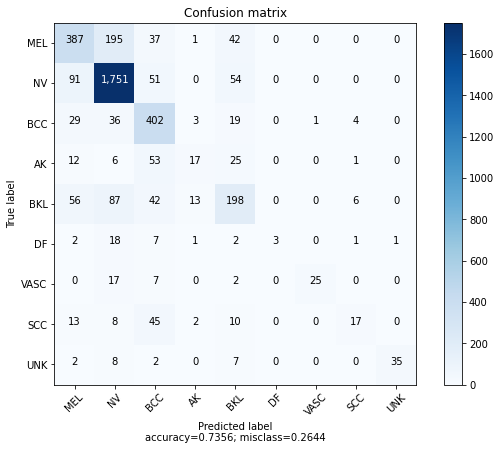

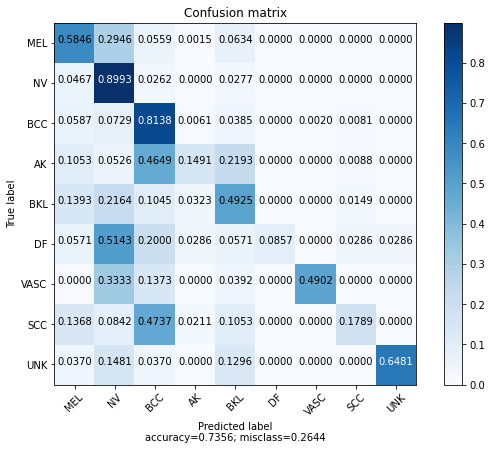

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

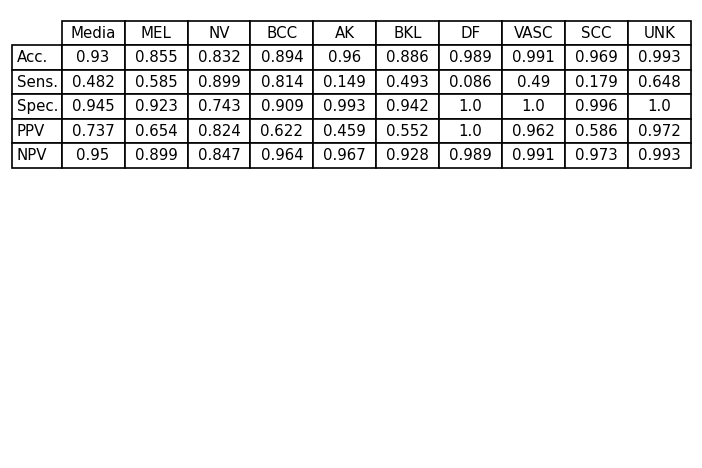

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

### 50 epochs

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=10,
                    callbacks=[call]
                    )

Epoch 1/10
562/562 [==============================] - 978s 2s/step - loss: 0.7077 - acc: 0.7423 - val_loss: 0.7000 - val_acc: 0.7521
Epoch 2/10
562/562 [==============================] - 978s 2s/step - loss: 0.6997 - acc: 0.7472 - val_loss: 0.7182 - val_acc: 0.7531
Epoch 3/10
562/562 [==============================] - 989s 2s/step - loss: 0.6974 - acc: 0.7475 - val_loss: 0.7015 - val_acc: 0.7510
Epoch 4/10
562/562 [==============================] - 970s 2s/step - loss: 0.6861 - acc: 0.7484 - val_loss: 0.7103 - val_acc: 0.7524
Epoch 5/10
562/562 [==============================] - 973s 2s/step - loss: 0.6939 - acc: 0.7505 - val_loss: 0.7002 - val_acc: 0.7623
Epoch 6/10
562/562 [==============================] - 985s 2s/step - loss: 0.6823 - acc: 0.7534 - val_loss: 0.7170 - val_acc: 0.7597
Epoch 7/10
562/562 [==============================] - 991s 2s/step - loss: 0.6865 - acc: 0.7511 - val_loss: 0.6951 - val_acc: 0.7547
Epoch 8/10
562/562 [==============================] - 984s 2s/step - 

#### Gráficas

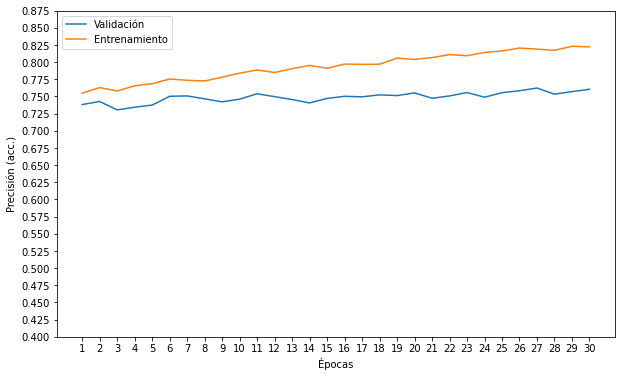

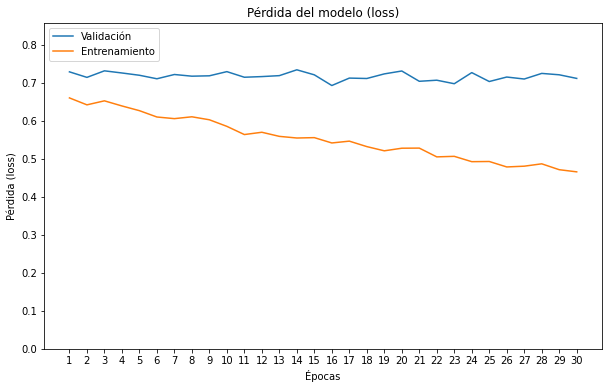

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 54s 656ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 54s 663ms/step - loss: 0.7874 - acc: 0.7294


[0.7873916029930115, 0.7293720841407776]

Se crea la matriz de confusión:

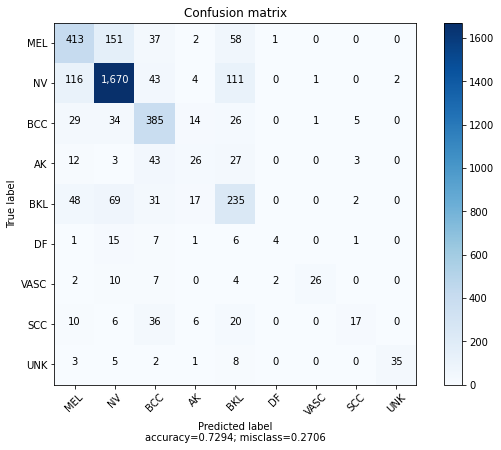

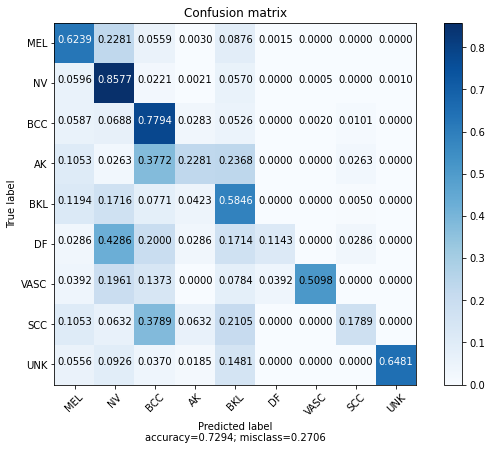

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

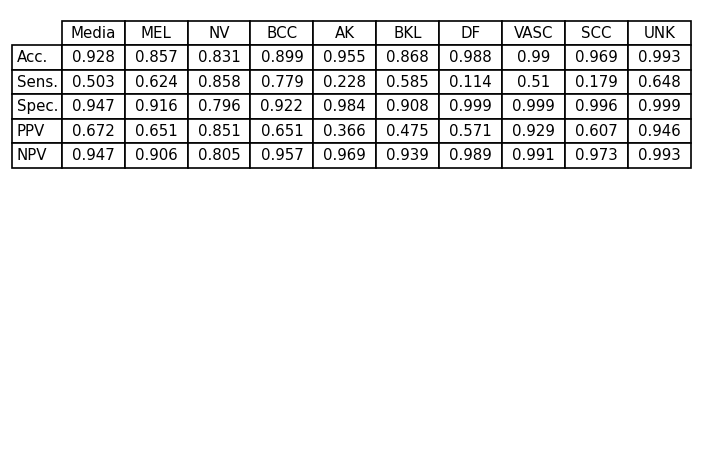

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

## I: ISIC+UNK, LR = 1e-5, Descongelando 9 capas, Neuronas a la mitad

Se crea el modelo:

In [ ]:
def create_EfficientNetB0():
  # Se crea una red EfficientNetB0 sin el clasificador (include_top = false) y con los pesos de haber sido entrenada con ImageNet
  modelEf = efn.EfficientNetB0(include_top=False, weights='imagenet', input_shape=(224,224,3))

  # Las capas de la red se ponen como no entrenables
  for layer in modelEf.layers:
    layer.trainable = False

  # Se añade nuestro clasificador
  last_layer = modelEf.layers[-1]
  last_output = last_layer.output
  x=keras.layers.Flatten()(last_output)
  x=keras.layers.Dense(64,activation='relu')(x) # Reducción de neuronas
  x=keras.layers.Dropout(0.5)(x)
  x=keras.layers.Dense(9,activation='softmax')(x)

  model = keras.Model(modelEf.input, x)

  # Se descongelan las 9 últimas capas
  for layer in model.layers[-9:]:
      layer.trainable=True
  
  return model

In [ ]:
model = create_EfficientNetB0()

16809984/16804768 [==============================] - 0s 0us/step


Se crea un Callback que sea llamado al final de cada epoch del entrenamiento para calcular la precisión y error durante el entrenamiento. Esto ya lo hace por defecto la función fit() pero las curvas estaban dando un resultado un tanto extraño (la curva de la precisión de validación mucho mayor que la de entrenamiento), por lo que se optó mejor por esta opción, cuyas curvas sí eran coherentes

In [ ]:
class TrainingHistoryEvaluate(tf.keras.callbacks.Callback):
  def __init__(self):
    self.validAcc = [] 
    self.trainAcc = []
    self.validLoss = []
    self.trainLoss = []

  def on_epoch_end(self, epoch, logs=None):
    valid_generator.reset()
    train_generator.reset()

    lossV,accV = model.evaluate(x=valid_generator,steps=STEP_SIZE_VALID,verbose=1)
    lossT,accT = model.evaluate(x=train_generator,steps=STEP_SIZE_TRAIN,verbose=1)

    self.validAcc.append(accV)
    self.trainAcc.append(accT)
    self.validLoss.append(lossV)
    self.trainLoss.append(lossT)

In [ ]:
call = TrainingHistoryEvaluate()

Se eligen optimizador, learning rate y pérdida (loss)

In [ ]:
opt = tf.keras.optimizers.Adam(learning_rate=0.00001)

model.compile(optimizer=opt,loss='categorical_crossentropy',metrics = ['acc'])

Se entrena el modelo:

### 20 epochs

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=20,
                    callbacks=[call]
                    )

Epoch 1/20
562/562 [==============================] - 1089s 2s/step - loss: 1.5921 - acc: 0.4899 - val_loss: 1.1943 - val_acc: 0.5927
Epoch 2/20
562/562 [==============================] - 1033s 2s/step - loss: 1.3407 - acc: 0.5577 - val_loss: 1.1257 - val_acc: 0.6134
Epoch 3/20
562/562 [==============================] - 1039s 2s/step - loss: 1.2748 - acc: 0.5741 - val_loss: 1.0767 - val_acc: 0.6251
Epoch 4/20
562/562 [==============================] - 1044s 2s/step - loss: 1.2328 - acc: 0.5871 - val_loss: 1.0464 - val_acc: 0.6377
Epoch 5/20
562/562 [==============================] - 1033s 2s/step - loss: 1.1914 - acc: 0.5975 - val_loss: 1.0253 - val_acc: 0.6473
Epoch 6/20
562/562 [==============================] - 1032s 2s/step - loss: 1.1762 - acc: 0.6020 - val_loss: 1.0094 - val_acc: 0.6452
Epoch 7/20
562/562 [==============================] - 1001s 2s/step - loss: 1.1545 - acc: 0.6101 - val_loss: 0.9906 - val_acc: 0.6570
Epoch 8/20
562/562 [==============================] - 1012s 2s

#### Gráficas

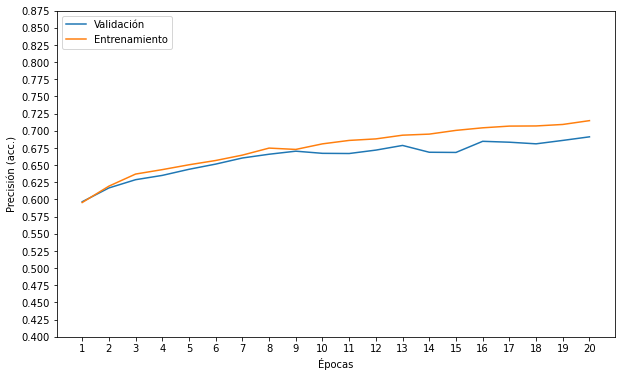

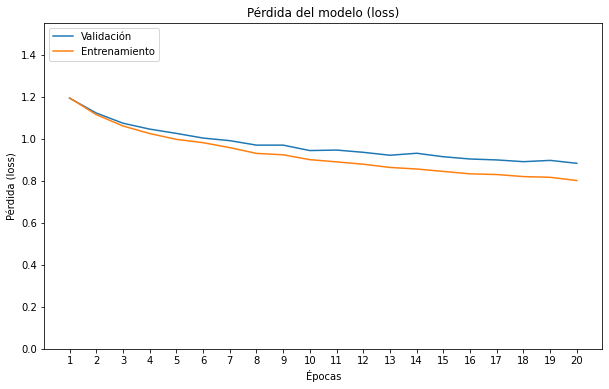

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 65s 788ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 56s 683ms/step - loss: 0.8652 - acc: 0.6980


[0.8651711940765381, 0.6979761123657227]

Se crea la matriz de confusión:

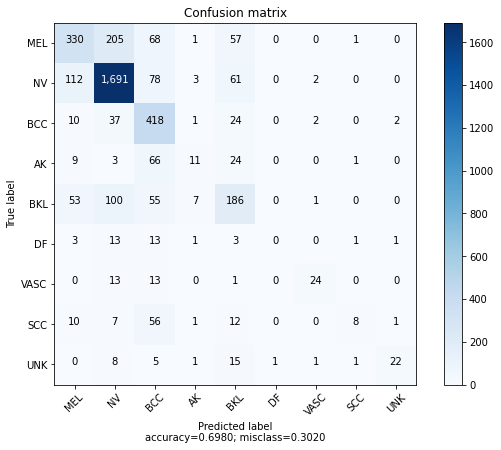

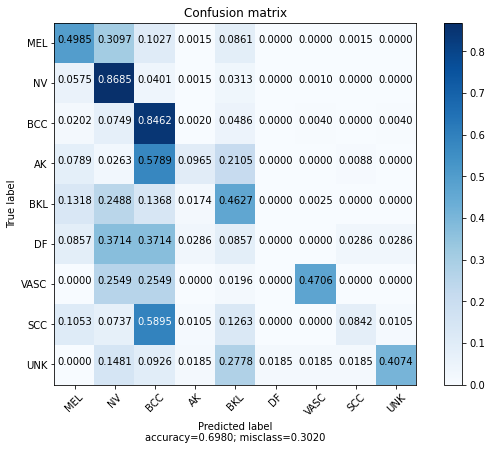

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

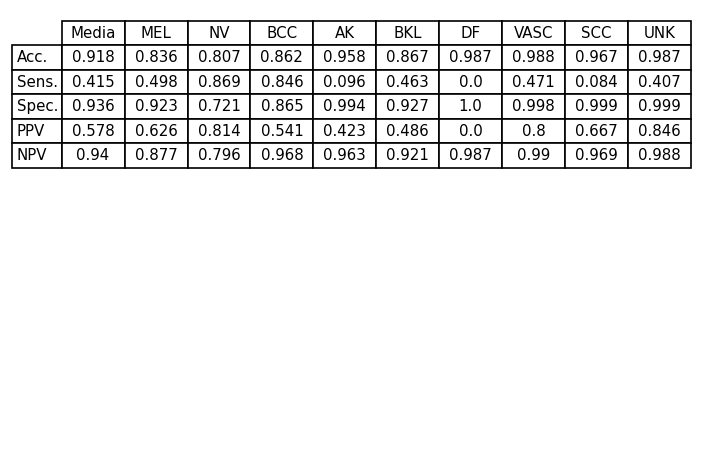

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

# REDUCCIÓN NEURONAS (CON L2)

## J: ISIC+UNK, LR = 1e-4, Descongelando 9 capas, L2 = 0.01, Neuronas a la mitad

Se crea el modelo:

In [ ]:
def create_EfficientNetB0():
  # Se crea una red EfficientNetB0 sin el clasificador (include_top = false) y con los pesos de haber sido entrenada con ImageNet
  modelEf = efn.EfficientNetB0(include_top=False, weights='imagenet', input_shape=(224,224,3))

  # Las capas de la red se ponen como no entrenables
  for layer in modelEf.layers:
    layer.trainable = False

  # Se añade nuestro clasificador
  last_layer = modelEf.layers[-1]
  last_output = last_layer.output
  x=keras.layers.Flatten()(last_output)
  x=keras.layers.Dense(64,activation='relu',kernel_regularizer=regularizers.l2(0.01))(x) # Se añade regularización L2 # Reducción de neuronas
  x=keras.layers.Dropout(0.5)(x)
  x=keras.layers.Dense(9,activation='softmax')(x)

  model = keras.Model(modelEf.input, x)

  # Se descongelan las 9 últimas capas
  for layer in model.layers[-9:]:
      layer.trainable=True
  
  return model

In [ ]:
model = create_EfficientNetB0()

16809984/16804768 [==============================] - 0s 0us/step


Se crea un Callback que sea llamado al final de cada epoch del entrenamiento para calcular la precisión y error durante el entrenamiento. Esto ya lo hace por defecto la función fit() pero las curvas estaban dando un resultado un tanto extraño (la curva de la precisión de validación mucho mayor que la de entrenamiento), por lo que se optó mejor por esta opción, cuyas curvas sí eran coherentes

In [ ]:
class TrainingHistoryEvaluate(tf.keras.callbacks.Callback):
  def __init__(self):
    self.validAcc = [] 
    self.trainAcc = []
    self.validLoss = []
    self.trainLoss = []

  def on_epoch_end(self, epoch, logs=None):
    valid_generator.reset()
    train_generator.reset()

    lossV,accV = model.evaluate(x=valid_generator,steps=STEP_SIZE_VALID,verbose=1)
    lossT,accT = model.evaluate(x=train_generator,steps=STEP_SIZE_TRAIN,verbose=1)

    self.validAcc.append(accV)
    self.trainAcc.append(accT)
    self.validLoss.append(lossV)
    self.trainLoss.append(lossT)

In [ ]:
call = TrainingHistoryEvaluate()

Se eligen optimizador, learning rate y pérdida (loss)

In [ ]:
opt = tf.keras.optimizers.Adam(learning_rate=0.0001)

model.compile(optimizer=opt,loss='categorical_crossentropy',metrics = ['acc'])

Se entrena el modelo. Primero se entrena por 20 epochs, para comparar con todos los anteriores, que también se han entrenado por 20 epochs. Después se sigue hasta 50 ya que en la siguiente prueba (incorporar otros datasets) se entrenarán por 50, ya que de ahí saldrá el modelo final:

### 20 epochs

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=20,
                    callbacks=[call]
                    )

Epoch 1/20
562/562 [==============================] - 1077s 2s/step - loss: 2.5347 - acc: 0.5331 - val_loss: 2.0382 - val_acc: 0.6243
Epoch 2/20
562/562 [==============================] - 1004s 2s/step - loss: 2.0446 - acc: 0.5850 - val_loss: 1.7055 - val_acc: 0.6499
Epoch 3/20
562/562 [==============================] - 1004s 2s/step - loss: 1.7578 - acc: 0.6089 - val_loss: 1.5058 - val_acc: 0.6633
Epoch 4/20
562/562 [==============================] - 995s 2s/step - loss: 1.5955 - acc: 0.6274 - val_loss: 1.3908 - val_acc: 0.6795
Epoch 5/20
562/562 [==============================] - 997s 2s/step - loss: 1.4834 - acc: 0.6390 - val_loss: 1.3074 - val_acc: 0.6810
Epoch 6/20
562/562 [==============================] - 985s 2s/step - loss: 1.4080 - acc: 0.6448 - val_loss: 1.2572 - val_acc: 0.6813
Epoch 7/20
562/562 [==============================] - 984s 2s/step - loss: 1.3449 - acc: 0.6539 - val_loss: 1.1958 - val_acc: 0.6920
Epoch 8/20
562/562 [==============================] - 985s 2s/step

#### Gráficas

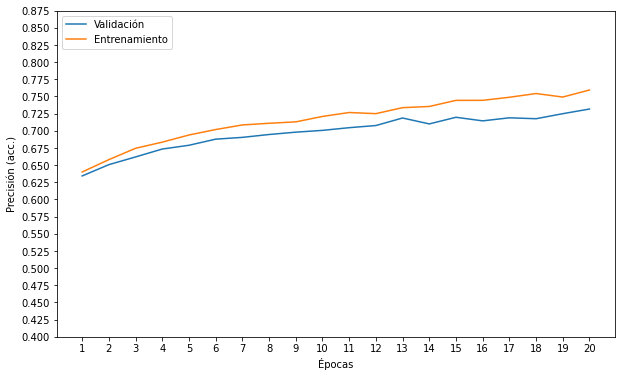

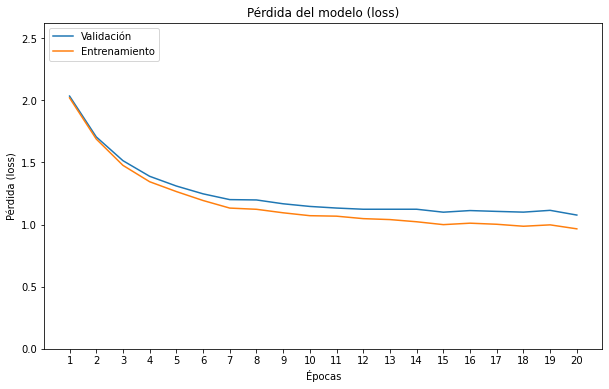

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 63s 769ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 55s 665ms/step - loss: 1.1265 - acc: 0.7154


[1.126518964767456, 0.7153606414794922]

Se crea la matriz de confusión:

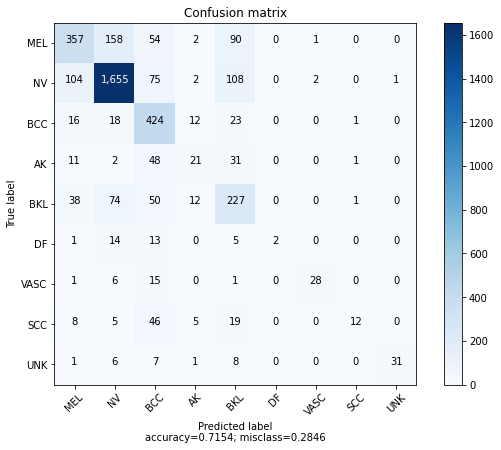

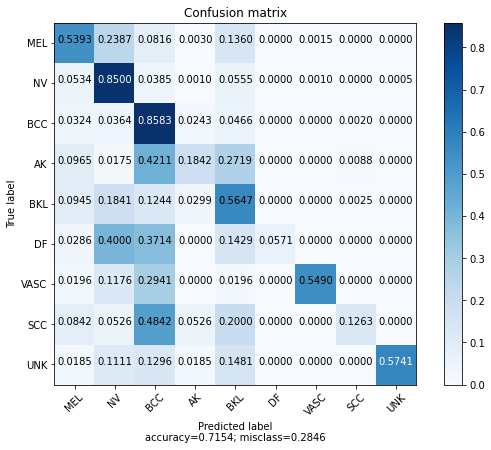

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

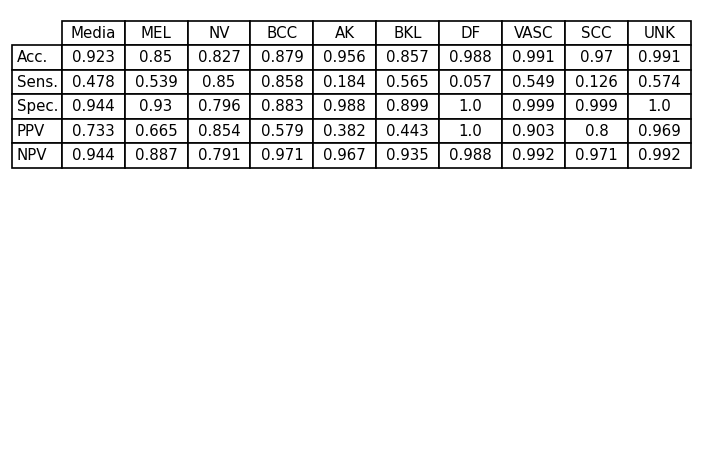

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

### 30 epochs

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=10,
                    callbacks=[call]
                    )

Epoch 1/10
562/562 [==============================] - 987s 2s/step - loss: 1.1386 - acc: 0.7082 - val_loss: 1.0962 - val_acc: 0.7322
Epoch 2/10
562/562 [==============================] - 994s 2s/step - loss: 1.1281 - acc: 0.7124 - val_loss: 1.0752 - val_acc: 0.7301
Epoch 3/10
562/562 [==============================] - 999s 2s/step - loss: 1.1263 - acc: 0.7140 - val_loss: 1.0736 - val_acc: 0.7364
Epoch 4/10
562/562 [==============================] - 989s 2s/step - loss: 1.1193 - acc: 0.7153 - val_loss: 1.0962 - val_acc: 0.7299
Epoch 5/10
562/562 [==============================] - 980s 2s/step - loss: 1.1069 - acc: 0.7235 - val_loss: 1.0749 - val_acc: 0.7281
Epoch 6/10
562/562 [==============================] - 974s 2s/step - loss: 1.1060 - acc: 0.7218 - val_loss: 1.0782 - val_acc: 0.7364
Epoch 7/10
562/562 [==============================] - 985s 2s/step - loss: 1.1044 - acc: 0.7241 - val_loss: 1.0894 - val_acc: 0.7294
Epoch 8/10
562/562 [==============================] - 985s 2s/step - 

#### Gráficas

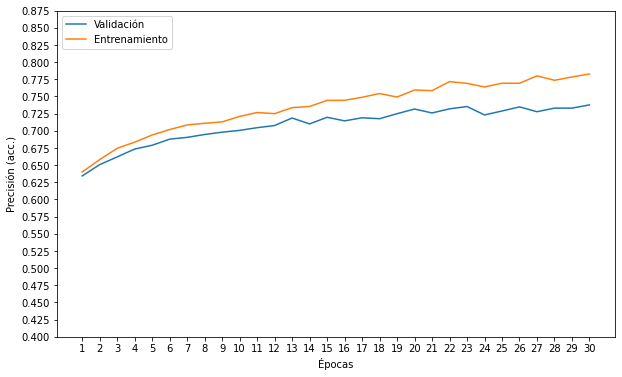

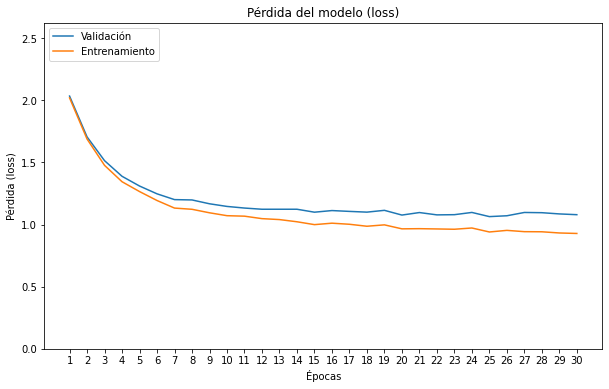

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 58s 701ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 57s 698ms/step - loss: 1.1152 - acc: 0.7289


[1.1152292490005493, 0.728853166103363]

Se crea la matriz de confusión:

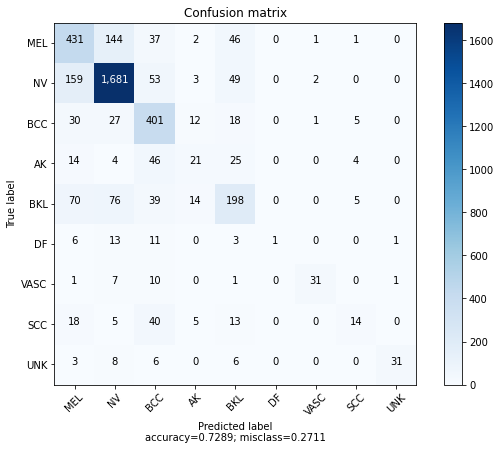

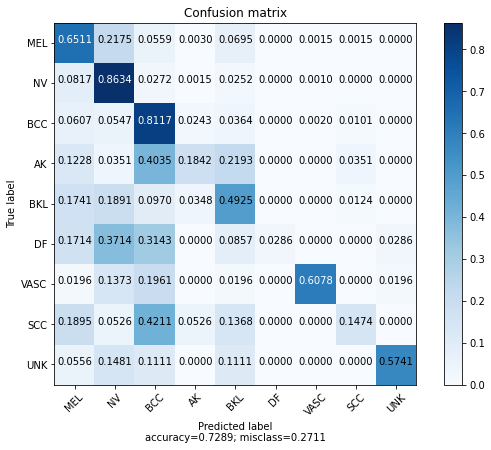

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

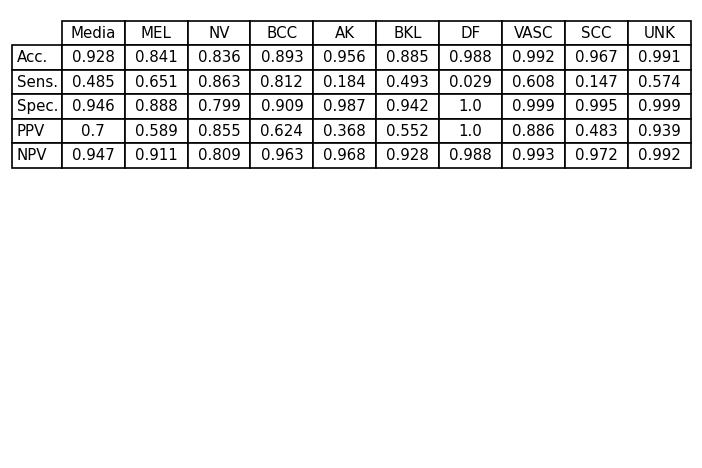

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

### 40 epochs

In [ ]:
model = load_model('/content/drive/My Drive/efficientNet7C2_10mas.h5')
# Es necesario dividir el entrenamiento en dos partes ya que tarda mucho tiempo
# (Se carga entrenado durante 30 epochs y se sigue hasta 50)

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=10,
                    callbacks=[call]
                    )

Epoch 1/10
562/562 [==============================] - 1153s 2s/step - loss: 1.1075 - acc: 0.7254 - val_loss: 0.9619 - val_acc: 0.7725
Epoch 2/10
562/562 [==============================] - 1110s 2s/step - loss: 1.1105 - acc: 0.7246 - val_loss: 0.9508 - val_acc: 0.7732
Epoch 3/10
562/562 [==============================] - 1113s 2s/step - loss: 1.0933 - acc: 0.7311 - val_loss: 0.9813 - val_acc: 0.7725
Epoch 4/10
562/562 [==============================] - 1116s 2s/step - loss: 1.1068 - acc: 0.7324 - val_loss: 0.9673 - val_acc: 0.7746
Epoch 5/10
562/562 [==============================] - 1111s 2s/step - loss: 1.0844 - acc: 0.7355 - val_loss: 0.9810 - val_acc: 0.7638
Epoch 6/10
562/562 [==============================] - 1122s 2s/step - loss: 1.0731 - acc: 0.7384 - val_loss: 0.9777 - val_acc: 0.7654
Epoch 7/10
562/562 [==============================] - 1119s 2s/step - loss: 1.0755 - acc: 0.7369 - val_loss: 0.9777 - val_acc: 0.7683
Epoch 8/10
562/562 [==============================] - 1112s 2s

#### Gráficas

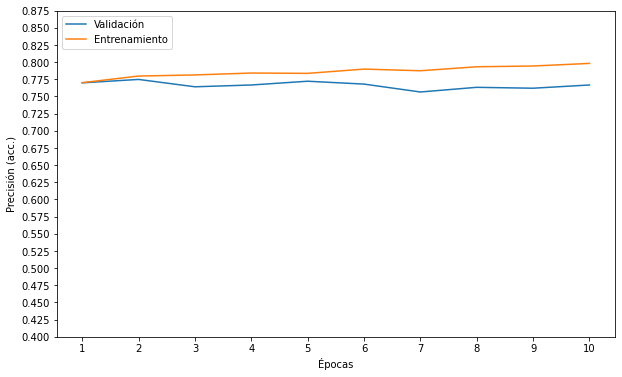

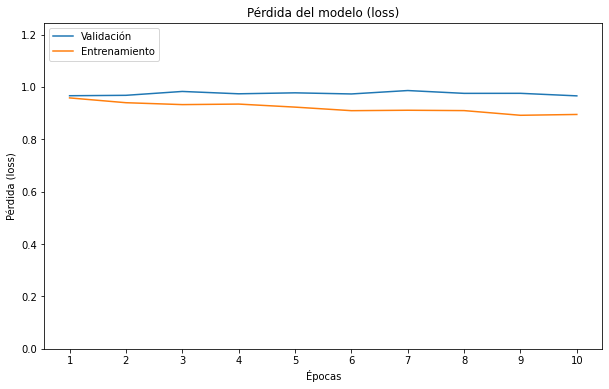

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 69s 844ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 55s 673ms/step - loss: 1.1224 - acc: 0.7263


[1.122407078742981, 0.7262584567070007]

Se crea la matriz de confusión:

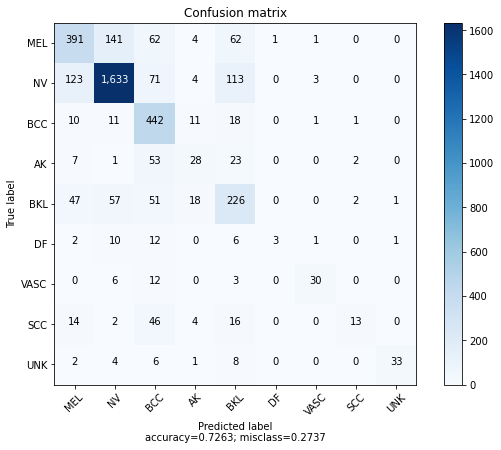

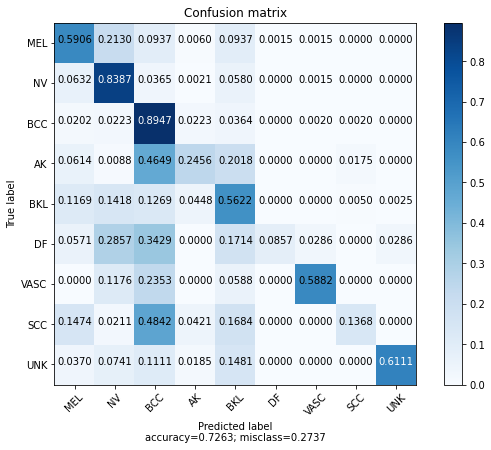

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

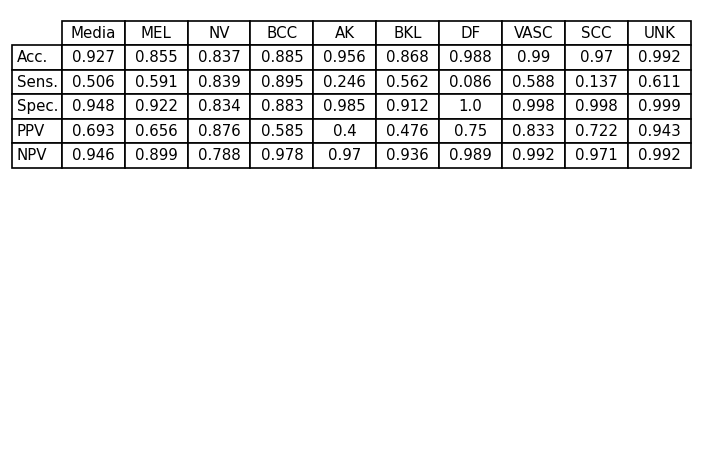

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

### 50 epochs

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=10,
                    callbacks=[call]
                    )

Epoch 1/10
562/562 [==============================] - 1136s 2s/step - loss: 1.0617 - acc: 0.7416 - val_loss: 0.9684 - val_acc: 0.7759
Epoch 2/10
562/562 [==============================] - 1122s 2s/step - loss: 1.0395 - acc: 0.7479 - val_loss: 0.9823 - val_acc: 0.7594
Epoch 3/10
562/562 [==============================] - 1155s 2s/step - loss: 1.0426 - acc: 0.7506 - val_loss: 0.9776 - val_acc: 0.7657
Epoch 4/10
562/562 [==============================] - 1120s 2s/step - loss: 1.0445 - acc: 0.7470 - val_loss: 0.9682 - val_acc: 0.7701
Epoch 5/10
562/562 [==============================] - 1117s 2s/step - loss: 1.0366 - acc: 0.7515 - val_loss: 0.9823 - val_acc: 0.7699
Epoch 6/10
562/562 [==============================] - 1135s 2s/step - loss: 1.0383 - acc: 0.7522 - val_loss: 0.9764 - val_acc: 0.7680
Epoch 7/10
562/562 [==============================] - 1158s 2s/step - loss: 1.0322 - acc: 0.7523 - val_loss: 0.9924 - val_acc: 0.7670
Epoch 8/10
562/562 [==============================] - 1164s 2s

#### Gráficas

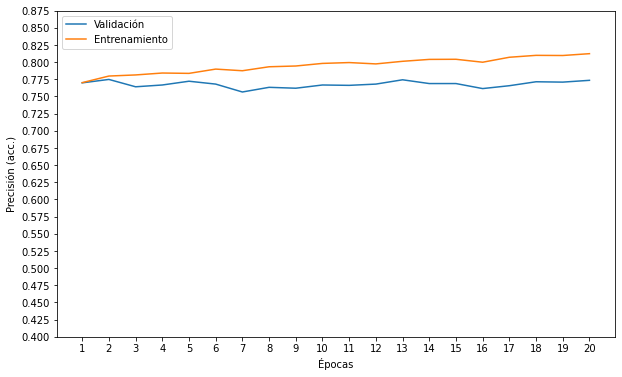

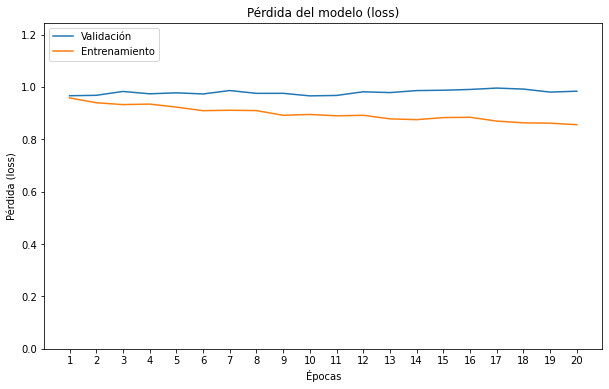

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 71s 860ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 56s 680ms/step - loss: 1.1273 - acc: 0.7340


[1.1273396015167236, 0.7340425252914429]

Se crea la matriz de confusión:

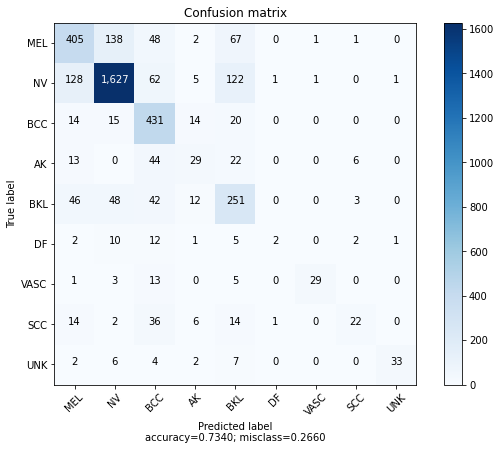

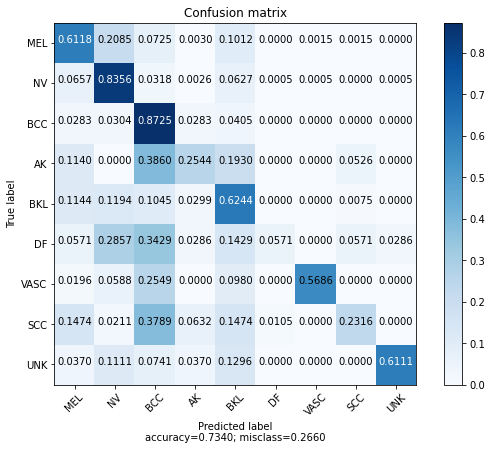

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

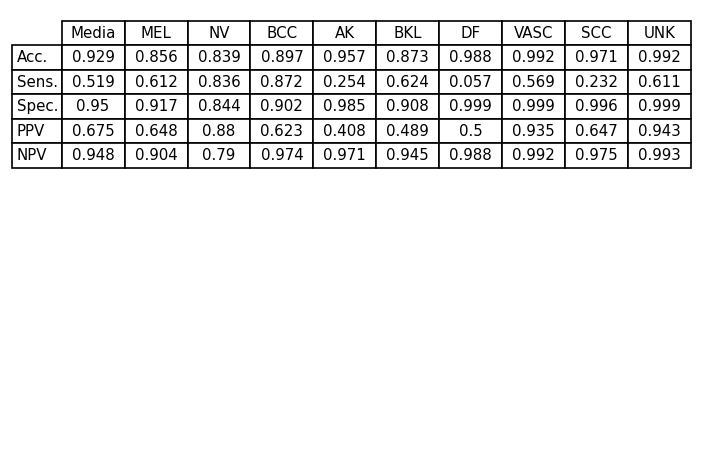

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

## K: ISIC+UNK, LR = 1e-5, Descongelando 9 capas, L2 = 0.01, Neuronas a la mitad

Se crea el modelo:

In [ ]:
def create_EfficientNetB0():
  # Se crea una red EfficientNetB0 sin el clasificador (include_top = false) y con los pesos de haber sido entrenada con ImageNet
  modelEf = efn.EfficientNetB0(include_top=False, weights='imagenet', input_shape=(224,224,3))

  # Las capas de la red se ponen como no entrenables
  for layer in modelEf.layers:
    layer.trainable = False

  # Se añade nuestro clasificador
  last_layer = modelEf.layers[-1]
  last_output = last_layer.output
  x=keras.layers.Flatten()(last_output)
  x=keras.layers.Dense(64,activation='relu',kernel_regularizer=regularizers.l2(0.01))(x) # Se añade regularización L2 # Reducción de neuronas
  x=keras.layers.Dropout(0.5)(x)
  x=keras.layers.Dense(9,activation='softmax')(x)

  model = keras.Model(modelEf.input, x)

  # Se descongelan las 9 últimas capas
  for layer in model.layers[-9:]:
      layer.trainable=True
  
  return model

In [ ]:
model = create_EfficientNetB0()

16809984/16804768 [==============================] - 1s 0us/step


Se crea un Callback que sea llamado al final de cada epoch del entrenamiento para calcular la precisión y error durante el entrenamiento. Esto ya lo hace por defecto la función fit() pero las curvas estaban dando un resultado un tanto extraño (la curva de la precisión de validación mucho mayor que la de entrenamiento), por lo que se optó mejor por esta opción, cuyas curvas sí eran coherentes

In [ ]:
class TrainingHistoryEvaluate(tf.keras.callbacks.Callback):
  def __init__(self):
    self.validAcc = [] 
    self.trainAcc = []
    self.validLoss = []
    self.trainLoss = []

  def on_epoch_end(self, epoch, logs=None):
    valid_generator.reset()
    train_generator.reset()

    lossV,accV = model.evaluate(x=valid_generator,steps=STEP_SIZE_VALID,verbose=1)
    lossT,accT = model.evaluate(x=train_generator,steps=STEP_SIZE_TRAIN,verbose=1)

    self.validAcc.append(accV)
    self.trainAcc.append(accT)
    self.validLoss.append(lossV)
    self.trainLoss.append(lossT)

In [ ]:
call = TrainingHistoryEvaluate()

Se eligen optimizador, learning rate y pérdida (loss)

In [ ]:
opt = tf.keras.optimizers.Adam(learning_rate=0.00001)

model.compile(optimizer=opt,loss='categorical_crossentropy',metrics = ['acc'])

Se entrena el modelo:

### 20 epoch

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=20,
                    callbacks=[call]
                    )

Epoch 1/20
562/562 [==============================] - 1199s 2s/step - loss: 2.8752 - acc: 0.4790 - val_loss: 2.4346 - val_acc: 0.5990
Epoch 2/20
562/562 [==============================] - 1122s 2s/step - loss: 2.5791 - acc: 0.5554 - val_loss: 2.3077 - val_acc: 0.6283
Epoch 3/20
562/562 [==============================] - 1119s 2s/step - loss: 2.4657 - acc: 0.5730 - val_loss: 2.2347 - val_acc: 0.6343
Epoch 4/20
562/562 [==============================] - 1120s 2s/step - loss: 2.3878 - acc: 0.5814 - val_loss: 2.1699 - val_acc: 0.6463
Epoch 5/20
562/562 [==============================] - 1115s 2s/step - loss: 2.3094 - acc: 0.5912 - val_loss: 2.1011 - val_acc: 0.6507
Epoch 6/20
562/562 [==============================] - 1127s 2s/step - loss: 2.2364 - acc: 0.6007 - val_loss: 2.0385 - val_acc: 0.6533
Epoch 7/20
562/562 [==============================] - 1110s 2s/step - loss: 2.1618 - acc: 0.6153 - val_loss: 1.9647 - val_acc: 0.6635
Epoch 8/20
562/562 [==============================] - 1111s 2s

#### Gráficas

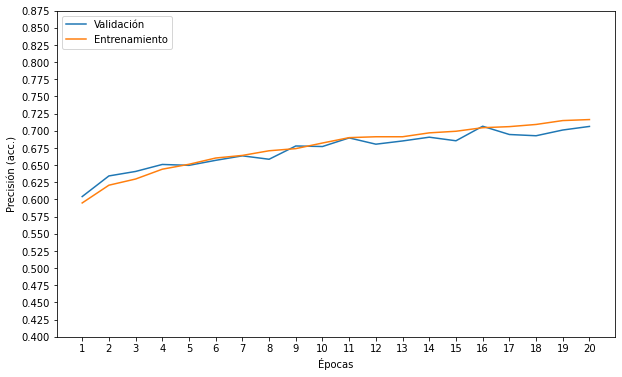

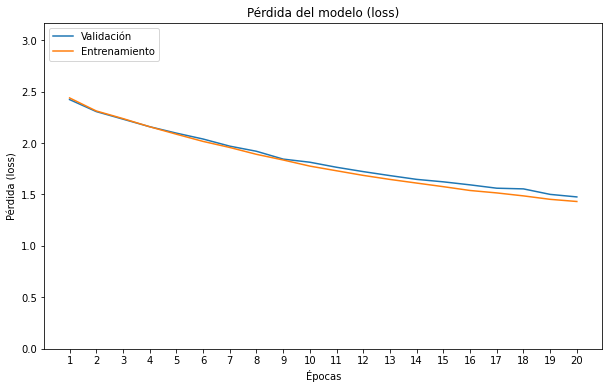

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 62s 757ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 63s 765ms/step - loss: 1.4953 - acc: 0.6993


[1.4953105449676514, 0.6992734670639038]

Se crea la matriz de confusión:

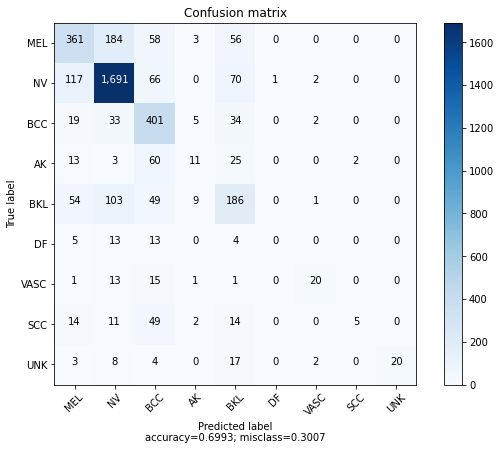

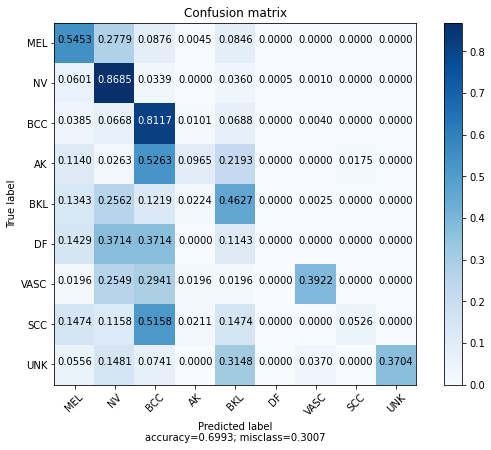

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

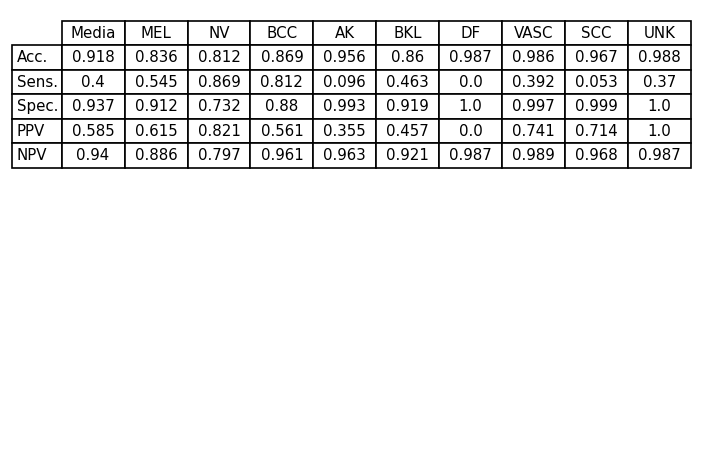

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

# INCORPORACIÓN DATASETS (SIN L2)

## L: ISIC+UNK+L2+7P, LR = 1e-4, Descongelando 9 capas, Neuronas a la mitad

Se crea el modelo:

In [ ]:
def create_EfficientNetB0():
  # Se crea una red EfficientNetB0 sin el clasificador (include_top = false) y con los pesos de haber sido entrenada con ImageNet
  modelEf = efn.EfficientNetB0(include_top=False, weights='imagenet', input_shape=(224,224,3))

  # Las capas de la red se ponen como no entrenables
  for layer in modelEf.layers:
    layer.trainable = False

  # Se añade nuestro clasificador
  last_layer = modelEf.layers[-1]
  last_output = last_layer.output
  x=keras.layers.Flatten()(last_output)
  x=keras.layers.Dense(64,activation='relu')(x)
  x=keras.layers.Dropout(0.5)(x)
  x=keras.layers.Dense(9,activation='softmax')(x)

  model = keras.Model(modelEf.input, x)

  # Se descongelan las 9 últimas capas
  for layer in model.layers[-9:]:
      layer.trainable=True
  
  return model

In [ ]:
model = create_EfficientNetB0()

16809984/16804768 [==============================] - 1s 0us/step


Se crea un Callback que sea llamado al final de cada epoch del entrenamiento para calcular la precisión y error durante el entrenamiento. Esto ya lo hace por defecto la función fit() pero las curvas estaban dando un resultado un tanto extraño (la curva de la precisión de validación mucho mayor que la de entrenamiento), por lo que se optó mejor por esta opción, cuyas curvas sí eran coherentes

In [ ]:
class TrainingHistoryEvaluate(tf.keras.callbacks.Callback):
  def __init__(self):
    self.validAcc = [] 
    self.trainAcc = []
    self.validLoss = []
    self.trainLoss = []

  def on_epoch_end(self, epoch, logs=None):
    valid_generator.reset()
    train_generator.reset()

    lossV,accV = model.evaluate(x=valid_generator,steps=STEP_SIZE_VALID,verbose=1)
    lossT,accT = model.evaluate(x=train_generator,steps=STEP_SIZE_TRAIN,verbose=1)

    self.validAcc.append(accV)
    self.trainAcc.append(accT)
    self.validLoss.append(lossV)
    self.trainLoss.append(lossT)

In [ ]:
call = TrainingHistoryEvaluate()

Se eligen optimizador, learning rate y pérdida (loss)

In [ ]:
opt = tf.keras.optimizers.Adam(learning_rate=0.0001)

model.compile(optimizer=opt,loss='categorical_crossentropy',metrics = ['acc'])

Se entrena el modelo:

### 10 epochs

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=10,
                    callbacks=[call]
                    )

Epoch 1/10
598/598 [==============================] - 1250s 2s/step - loss: 1.4117 - acc: 0.5390 - val_loss: 1.0911 - val_acc: 0.6223
Epoch 2/10
598/598 [==============================] - 1094s 2s/step - loss: 1.2253 - acc: 0.5842 - val_loss: 1.0272 - val_acc: 0.6383
Epoch 3/10
598/598 [==============================] - 1125s 2s/step - loss: 1.1461 - acc: 0.6114 - val_loss: 0.9791 - val_acc: 0.6542
Epoch 4/10
598/598 [==============================] - 1121s 2s/step - loss: 1.0932 - acc: 0.6233 - val_loss: 0.9597 - val_acc: 0.6593
Epoch 5/10
598/598 [==============================] - 1056s 2s/step - loss: 1.0629 - acc: 0.6304 - val_loss: 0.9426 - val_acc: 0.6603
Epoch 6/10
598/598 [==============================] - 1054s 2s/step - loss: 1.0299 - acc: 0.6420 - val_loss: 0.9329 - val_acc: 0.6719
Epoch 7/10
598/598 [==============================] - 1080s 2s/step - loss: 1.0051 - acc: 0.6473 - val_loss: 0.9103 - val_acc: 0.6779
Epoch 8/10
598/598 [==============================] - 1064s 2s

#### Gráficas

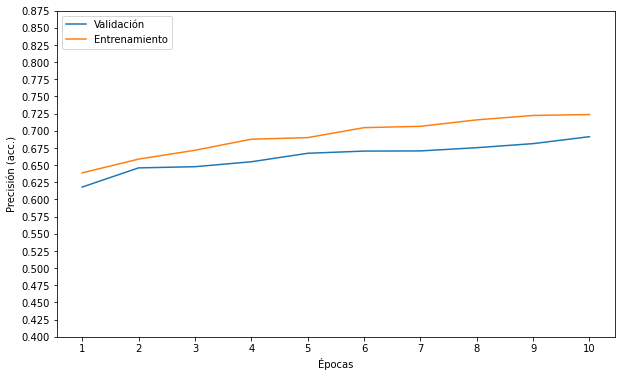

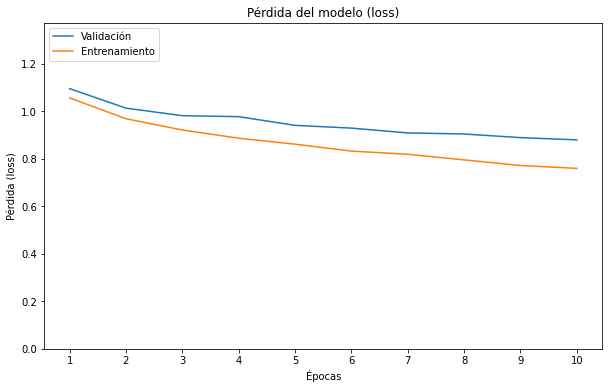

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 69s 836ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 57s 699ms/step - loss: 0.8370 - acc: 0.7050


[0.8370034098625183, 0.7049818634986877]

Se crea la matriz de confusión:

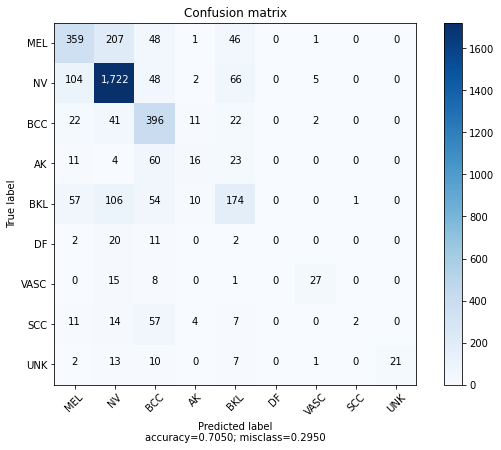

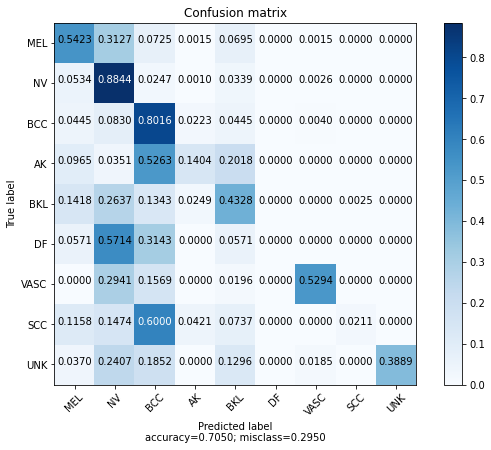

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in true_divide


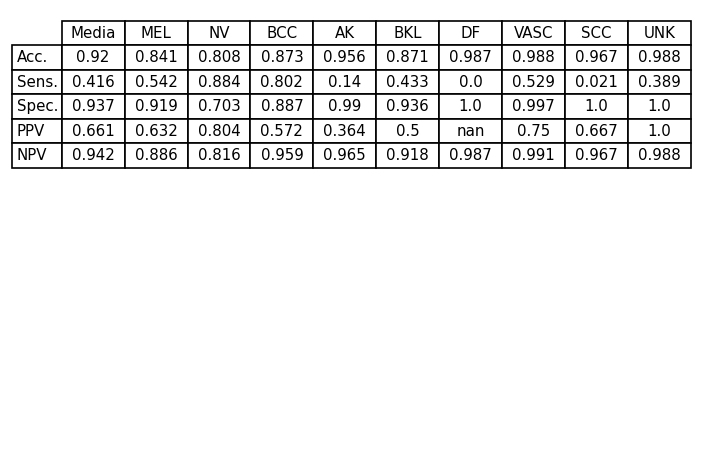

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

### 20 epochs

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=10,
                    callbacks=[call]
                    )

Epoch 1/10
598/598 [==============================] - 1139s 2s/step - loss: 0.9403 - acc: 0.6719 - val_loss: 0.8837 - val_acc: 0.6818
Epoch 2/10
598/598 [==============================] - 1157s 2s/step - loss: 0.9287 - acc: 0.6736 - val_loss: 0.8708 - val_acc: 0.6895
Epoch 3/10
598/598 [==============================] - 1185s 2s/step - loss: 0.9158 - acc: 0.6794 - val_loss: 0.8319 - val_acc: 0.6976
Epoch 4/10
598/598 [==============================] - 1192s 2s/step - loss: 0.8982 - acc: 0.6817 - val_loss: 0.8444 - val_acc: 0.6897
Epoch 5/10
598/598 [==============================] - 1194s 2s/step - loss: 0.8916 - acc: 0.6828 - val_loss: 0.8525 - val_acc: 0.7021
Epoch 6/10
598/598 [==============================] - 1194s 2s/step - loss: 0.8796 - acc: 0.6858 - val_loss: 0.8411 - val_acc: 0.7055
Epoch 7/10
598/598 [==============================] - 1186s 2s/step - loss: 0.8612 - acc: 0.6947 - val_loss: 0.8320 - val_acc: 0.6994
Epoch 8/10
598/598 [==============================] - 1195s 2s

#### Gráficas

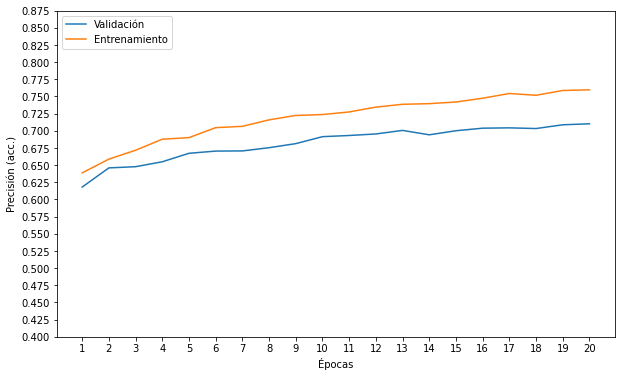

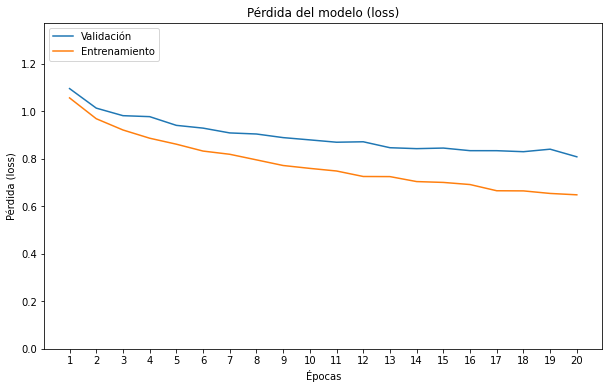

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 60s 734ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 61s 738ms/step - loss: 0.8431 - acc: 0.7102


[0.8430570363998413, 0.7101712226867676]

Se crea la matriz de confusión:

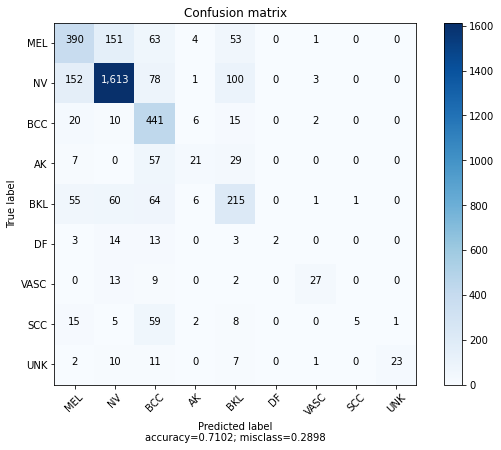

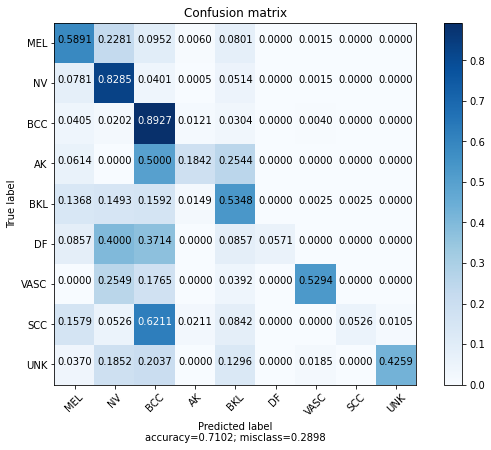

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

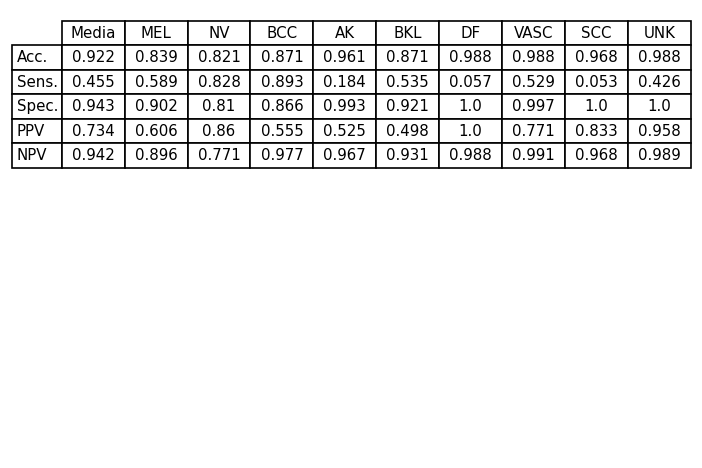

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

### 30 epochs

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=10,
                    callbacks=[call]
                    )

Epoch 1/10
598/598 [==============================] - 1202s 2s/step - loss: 0.8264 - acc: 0.7068 - val_loss: 0.8088 - val_acc: 0.7142
Epoch 2/10
598/598 [==============================] - 1206s 2s/step - loss: 0.8212 - acc: 0.7067 - val_loss: 0.8089 - val_acc: 0.7102
Epoch 3/10
598/598 [==============================] - 1199s 2s/step - loss: 0.8122 - acc: 0.7094 - val_loss: 0.8085 - val_acc: 0.7115
Epoch 4/10
598/598 [==============================] - 1198s 2s/step - loss: 0.8076 - acc: 0.7109 - val_loss: 0.8121 - val_acc: 0.7142
Epoch 5/10
598/598 [==============================] - 1196s 2s/step - loss: 0.7929 - acc: 0.7166 - val_loss: 0.8146 - val_acc: 0.7137
Epoch 6/10
598/598 [==============================] - 1188s 2s/step - loss: 0.7934 - acc: 0.7194 - val_loss: 0.7932 - val_acc: 0.7189
Epoch 7/10
598/598 [==============================] - 1198s 2s/step - loss: 0.7811 - acc: 0.7217 - val_loss: 0.8125 - val_acc: 0.7105
Epoch 8/10
598/598 [==============================] - 1174s 2s

#### Gráficas

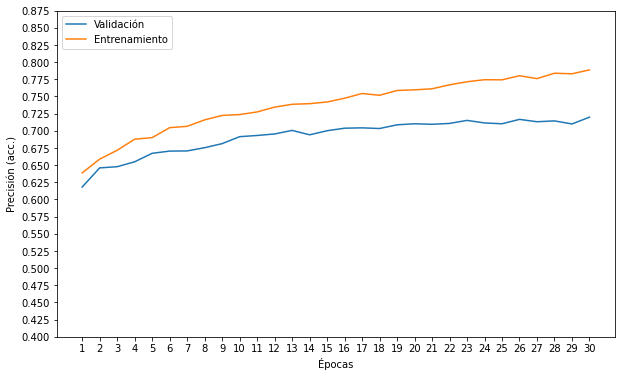

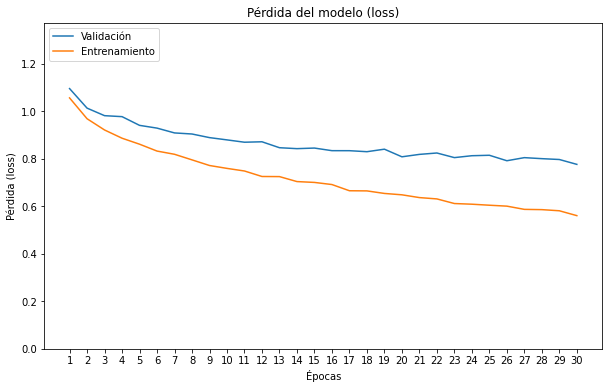

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 59s 718ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 59s 715ms/step - loss: 0.8067 - acc: 0.7250


[0.8066989183425903, 0.7249611020088196]

Se crea la matriz de confusión:

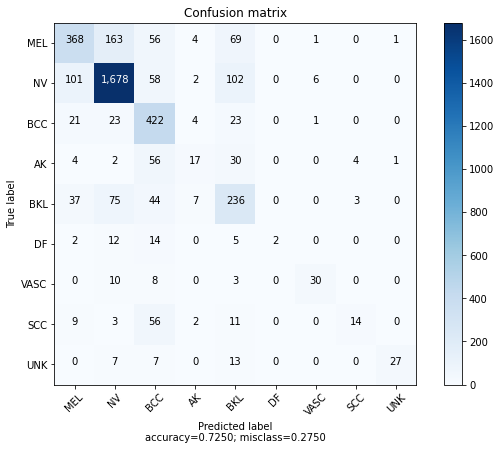

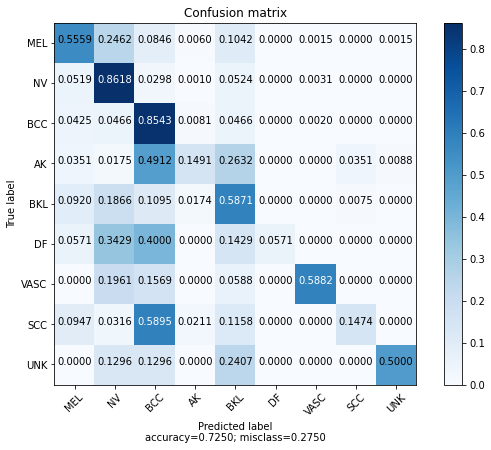

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

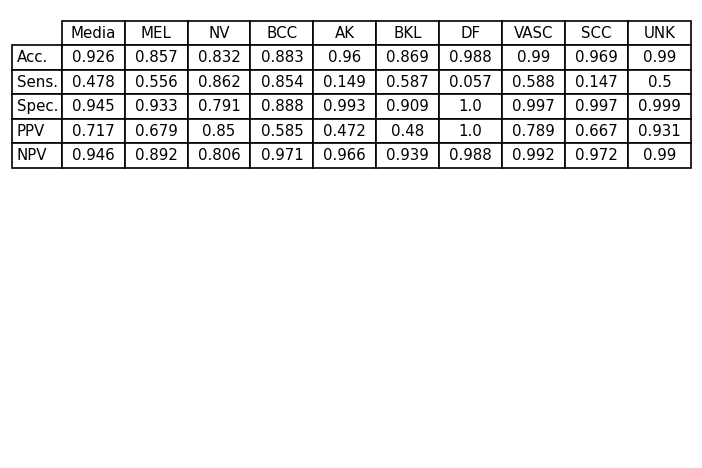

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

### 40 epochs

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=10,
                    callbacks=[call]
                    )

Epoch 1/10
598/598 [==============================] - 1159s 2s/step - loss: 0.7521 - acc: 0.7305 - val_loss: 0.7755 - val_acc: 0.7201
Epoch 2/10
598/598 [==============================] - 1165s 2s/step - loss: 0.7456 - acc: 0.7308 - val_loss: 0.7873 - val_acc: 0.7211
Epoch 3/10
598/598 [==============================] - 1195s 2s/step - loss: 0.7451 - acc: 0.7359 - val_loss: 0.7785 - val_acc: 0.7273
Epoch 4/10
598/598 [==============================] - 1198s 2s/step - loss: 0.7392 - acc: 0.7358 - val_loss: 0.7884 - val_acc: 0.7270
Epoch 5/10
598/598 [==============================] - 1200s 2s/step - loss: 0.7376 - acc: 0.7354 - val_loss: 0.7827 - val_acc: 0.7248
Epoch 6/10
598/598 [==============================] - 1189s 2s/step - loss: 0.7174 - acc: 0.7414 - val_loss: 0.7699 - val_acc: 0.7221
Epoch 7/10
598/598 [==============================] - 1207s 2s/step - loss: 0.7226 - acc: 0.7410 - val_loss: 0.7684 - val_acc: 0.7302
Epoch 8/10
598/598 [==============================] - 1206s 2s

#### Gráficas

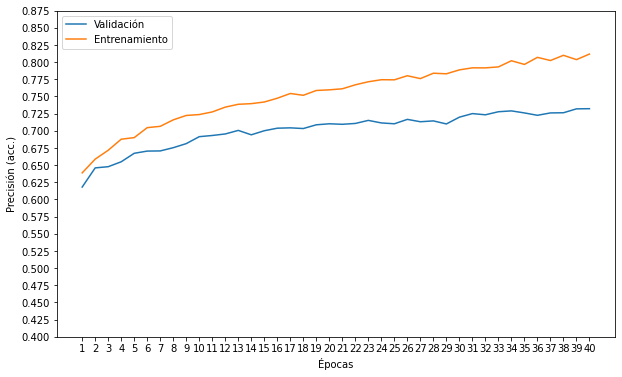

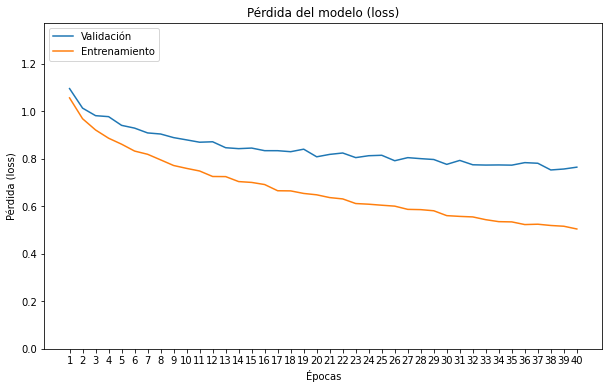

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 58s 707ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 58s 707ms/step - loss: 0.8294 - acc: 0.7330


[0.8294001817703247, 0.7330046892166138]

Se crea la matriz de confusión:

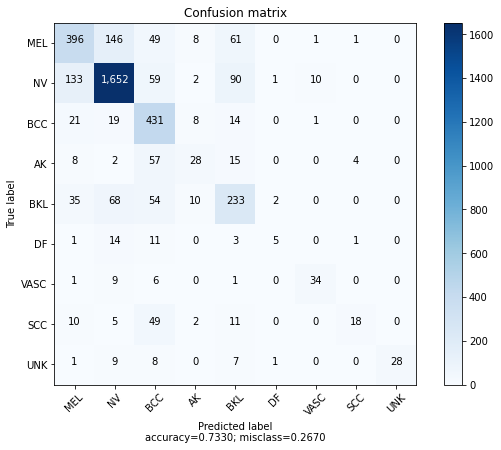

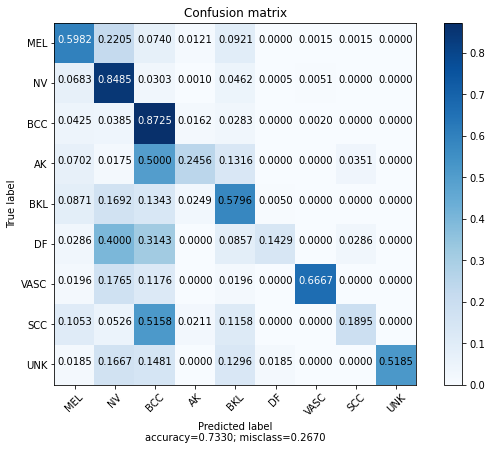

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

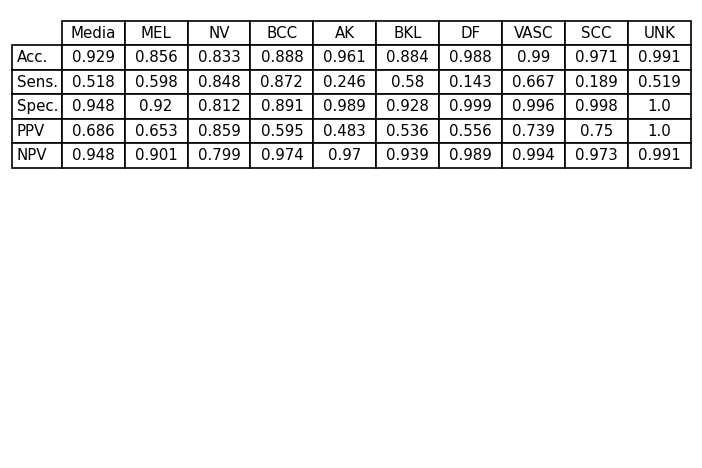

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

### 50 epochs

In [ ]:
model = load_model('/content/drive/My Drive/efficientNet8C2_40.h5')
# es necesario dividir el entrenamiento en dos partes para llegar a 50 epoch (ya 
# que requiere mucho tiempo) Se carga el modelo entrenado por 40 epochs y se sigue hasta 50

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=10,
                    callbacks=[call]
                    )

Epoch 1/10
598/598 [==============================] - 1255s 2s/step - loss: 0.7360 - acc: 0.7415 - val_loss: 0.5624 - val_acc: 0.7903
Epoch 2/10
598/598 [==============================] - 1159s 2s/step - loss: 0.7279 - acc: 0.7398 - val_loss: 0.5494 - val_acc: 0.7999
Epoch 3/10
598/598 [==============================] - 1142s 2s/step - loss: 0.7264 - acc: 0.7376 - val_loss: 0.5597 - val_acc: 0.7905
Epoch 4/10
598/598 [==============================] - 1127s 2s/step - loss: 0.7270 - acc: 0.7422 - val_loss: 0.5633 - val_acc: 0.7893
Epoch 5/10
598/598 [==============================] - 1114s 2s/step - loss: 0.7108 - acc: 0.7458 - val_loss: 0.5763 - val_acc: 0.7913
Epoch 6/10
598/598 [==============================] - 1111s 2s/step - loss: 0.7033 - acc: 0.7456 - val_loss: 0.5683 - val_acc: 0.7927
Epoch 7/10
598/598 [==============================] - 1146s 2s/step - loss: 0.6885 - acc: 0.7536 - val_loss: 0.5937 - val_acc: 0.7789
Epoch 8/10
598/598 [==============================] - 1136s 2s

#### Gráficas

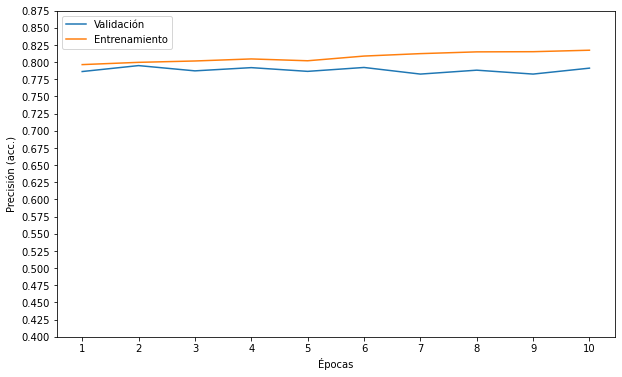

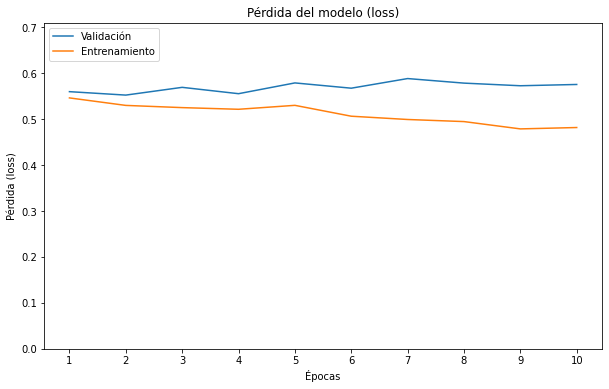

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 69s 842ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 58s 711ms/step - loss: 0.7795 - acc: 0.7460


[0.7795137763023376, 0.7459781765937805]

Se crea la matriz de confusión:

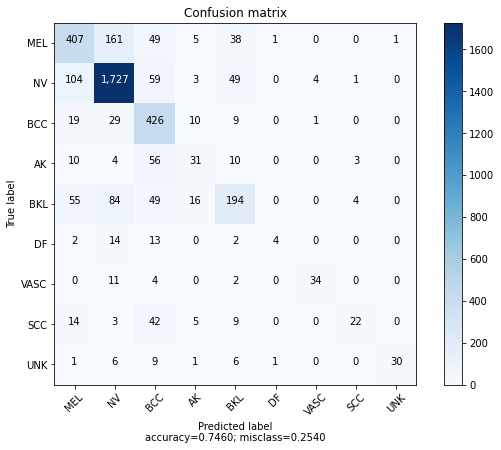

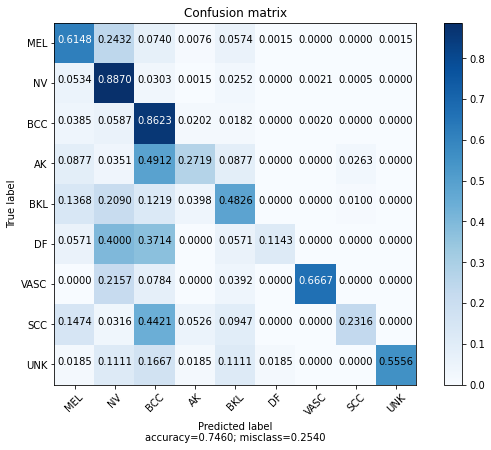

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

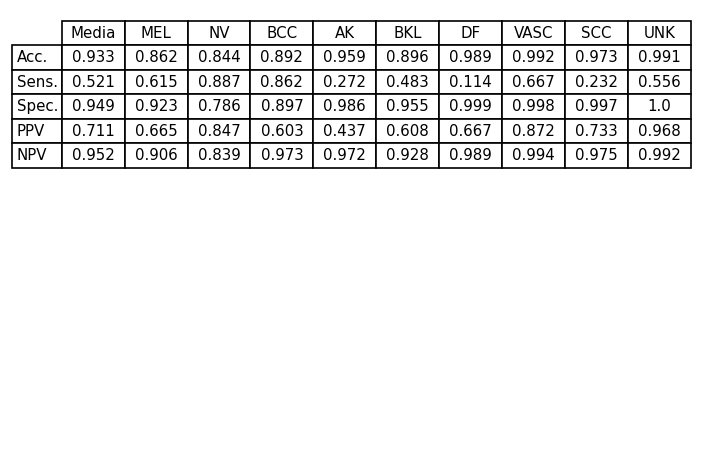

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

## M: ISIC+UNK+SD, LR = 1e-4, Descongelando 9 capas, Neuronas a la mitad

Se crea el modelo:

In [ ]:
def create_EfficientNetB0():
  # Se crea una red EfficientNetB0 sin el clasificador (include_top = false) y con los pesos de haber sido entrenada con ImageNet
  modelEf = efn.EfficientNetB0(include_top=False, weights='imagenet', input_shape=(224,224,3))

  # Las capas de la red se ponen como no entrenables
  for layer in modelEf.layers:
    layer.trainable = False

  # Se añade nuestro clasificador
  last_layer = modelEf.layers[-1]
  last_output = last_layer.output
  x=keras.layers.Flatten()(last_output)
  x=keras.layers.Dense(64,activation='relu')(x)
  x=keras.layers.Dropout(0.5)(x)
  x=keras.layers.Dense(9,activation='softmax')(x)

  model = keras.Model(modelEf.input, x)

  # Se descongelan las 9 últimas capas
  for layer in model.layers[-9:]:
      layer.trainable=True
  
  return model

In [ ]:
model = create_EfficientNetB0()

16809984/16804768 [==============================] - 1s 0us/step


Se crea un Callback que sea llamado al final de cada epoch del entrenamiento para calcular la precisión y error durante el entrenamiento. Esto ya lo hace por defecto la función fit() pero las curvas estaban dando un resultado un tanto extraño (la curva de la precisión de validación mucho mayor que la de entrenamiento), por lo que se optó mejor por esta opción, cuyas curvas sí eran coherentes

In [ ]:
class TrainingHistoryEvaluate(tf.keras.callbacks.Callback):
  def __init__(self):
    self.validAcc = [] 
    self.trainAcc = []
    self.validLoss = []
    self.trainLoss = []

  def on_epoch_end(self, epoch, logs=None):
    valid_generator.reset()
    train_generator.reset()

    lossV,accV = model.evaluate(x=valid_generator,steps=STEP_SIZE_VALID,verbose=1)
    lossT,accT = model.evaluate(x=train_generator,steps=STEP_SIZE_TRAIN,verbose=1)

    self.validAcc.append(accV)
    self.trainAcc.append(accT)
    self.validLoss.append(lossV)
    self.trainLoss.append(lossT)

In [ ]:
call = TrainingHistoryEvaluate()

Se eligen optimizador, learning rate y pérdida (loss)

In [ ]:
opt = tf.keras.optimizers.Adam(learning_rate=0.0001)

model.compile(optimizer=opt,loss='categorical_crossentropy',metrics = ['acc'])

Se entrena el modelo:

### 10 epochs

In [ ]:
# Necesario para cargar imágenes del dataset SD
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=10,
                    callbacks=[call]
                    )

Epoch 1/10
939/939 [==============================] - 1837s 2s/step - loss: 1.2515 - acc: 0.6071 - val_loss: 0.9479 - val_acc: 0.7009
Epoch 2/10
939/939 [==============================] - 1745s 2s/step - loss: 1.0898 - acc: 0.6473 - val_loss: 0.8839 - val_acc: 0.7136
Epoch 3/10
939/939 [==============================] - 1736s 2s/step - loss: 1.0067 - acc: 0.6662 - val_loss: 0.8576 - val_acc: 0.7136
Epoch 4/10
939/939 [==============================] - 1708s 2s/step - loss: 0.9621 - acc: 0.6796 - val_loss: 0.8076 - val_acc: 0.7304
Epoch 5/10
939/939 [==============================] - 1810s 2s/step - loss: 0.9288 - acc: 0.6869 - val_loss: 0.8070 - val_acc: 0.7245
Epoch 6/10
939/939 [==============================] - 1847s 2s/step - loss: 0.9042 - acc: 0.6960 - val_loss: 0.7853 - val_acc: 0.7326
Epoch 7/10
939/939 [==============================] - 1788s 2s/step - loss: 0.8899 - acc: 0.6972 - val_loss: 0.7704 - val_acc: 0.7390
Epoch 8/10
939/939 [==============================] - 1811s 2s

#### Gráficas

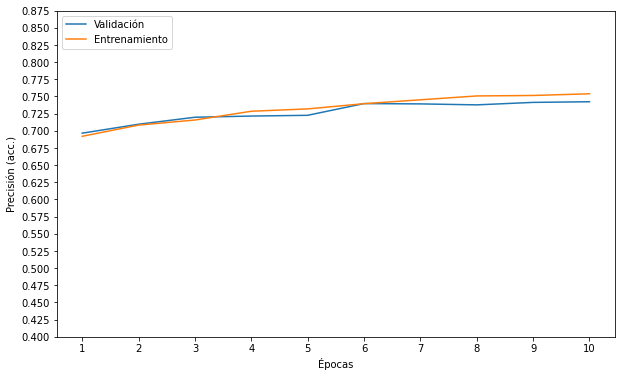

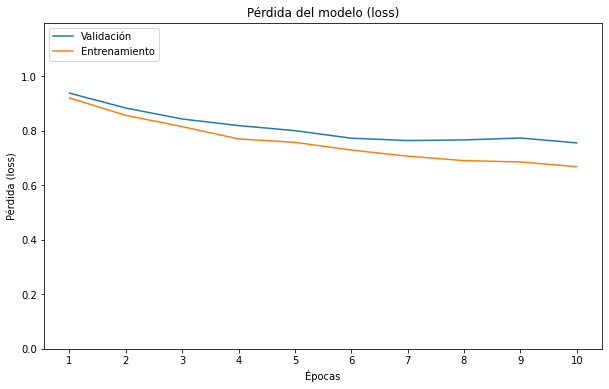

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 69s 839ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 58s 706ms/step - loss: 0.8571 - acc: 0.6923


[0.857146680355072, 0.6922677755355835]

Se crea la matriz de confusión:

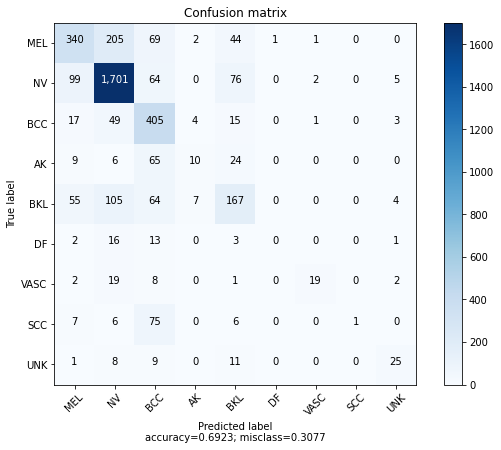

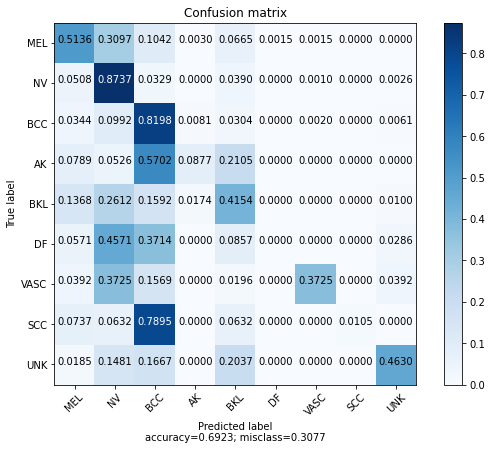

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

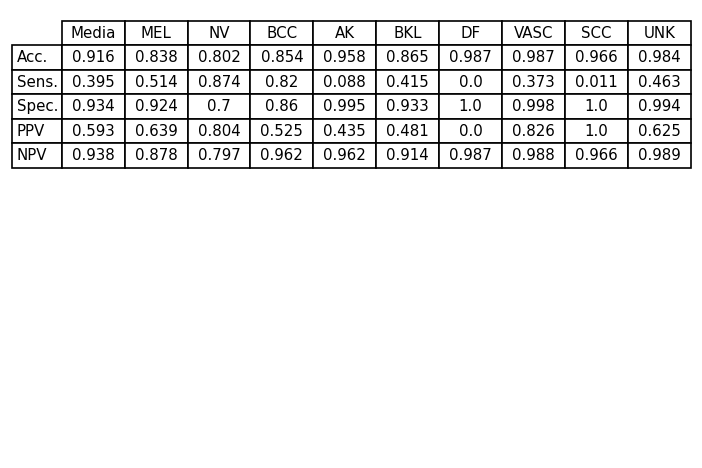

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

### 20 epochs

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=10,
                    callbacks=[call]
                    )

Epoch 1/10
939/939 [==============================] - 1833s 2s/step - loss: 0.8254 - acc: 0.7129 - val_loss: 0.7459 - val_acc: 0.7459
Epoch 2/10
939/939 [==============================] - 1836s 2s/step - loss: 0.8111 - acc: 0.7171 - val_loss: 0.7472 - val_acc: 0.7426
Epoch 3/10
939/939 [==============================] - 1819s 2s/step - loss: 0.8102 - acc: 0.7204 - val_loss: 0.7350 - val_acc: 0.7522
Epoch 4/10
939/939 [==============================] - 1777s 2s/step - loss: 0.7917 - acc: 0.7221 - val_loss: 0.7344 - val_acc: 0.7566
Epoch 5/10
939/939 [==============================] - 1704s 2s/step - loss: 0.7801 - acc: 0.7270 - val_loss: 0.7195 - val_acc: 0.7500
Epoch 6/10
939/939 [==============================] - 1697s 2s/step - loss: 0.7716 - acc: 0.7285 - val_loss: 0.7113 - val_acc: 0.7522
Epoch 7/10
939/939 [==============================] - 1702s 2s/step - loss: 0.7587 - acc: 0.7296 - val_loss: 0.7010 - val_acc: 0.7575
Epoch 8/10
939/939 [==============================] - 1700s 2s

#### Gráficas

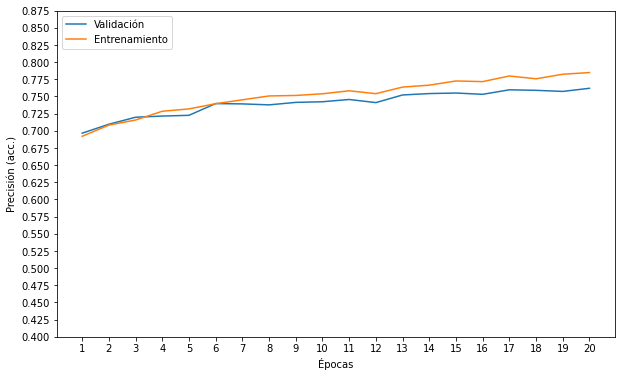

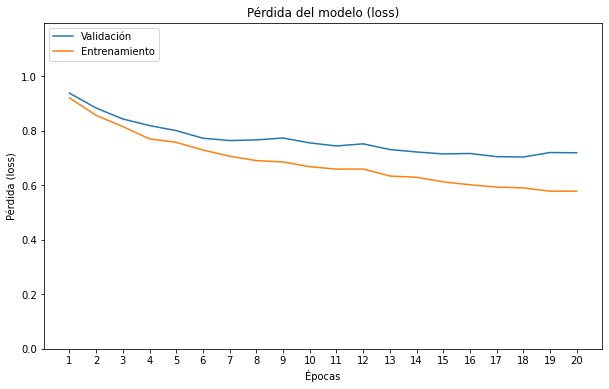

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 55s 677ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 56s 681ms/step - loss: 0.7978 - acc: 0.7177


[0.7977577447891235, 0.7176958918571472]

Se crea la matriz de confusión:

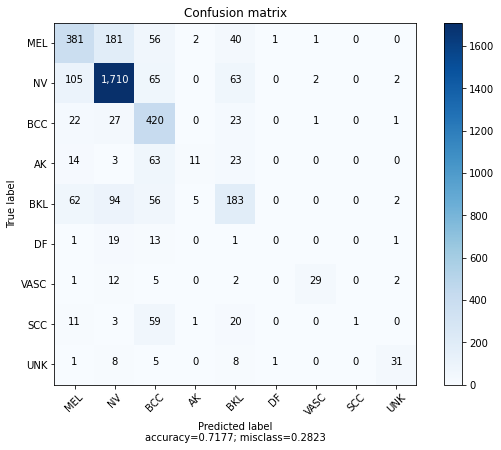

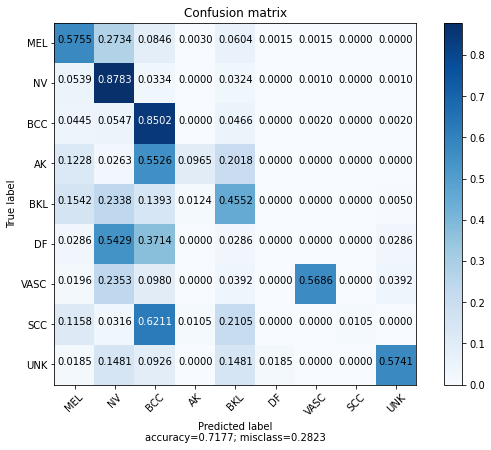

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

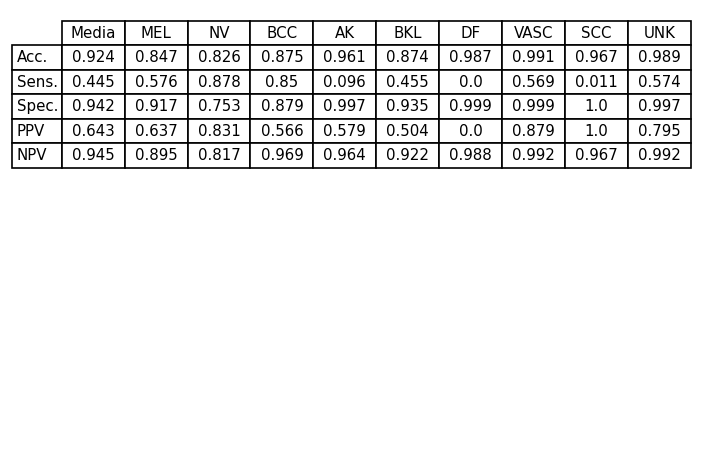

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

### 25 epochs

In [ ]:
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=5,
                    callbacks=[call]
                    )

Epoch 1/5
939/939 [==============================] - 1750s 2s/step - loss: 0.7311 - acc: 0.7393 - val_loss: 0.7075 - val_acc: 0.7600
Epoch 2/5
939/939 [==============================] - 1722s 2s/step - loss: 0.7255 - acc: 0.7409 - val_loss: 0.7033 - val_acc: 0.7585
Epoch 3/5
939/939 [==============================] - 1693s 2s/step - loss: 0.7149 - acc: 0.7430 - val_loss: 0.6948 - val_acc: 0.7610
Epoch 4/5
939/939 [==============================] - 1723s 2s/step - loss: 0.7039 - acc: 0.7471 - val_loss: 0.6799 - val_acc: 0.7666
Epoch 5/5
939/939 [==============================] - 1697s 2s/step - loss: 0.7043 - acc: 0.7499 - val_loss: 0.6833 - val_acc: 0.7649


#### Gráficas

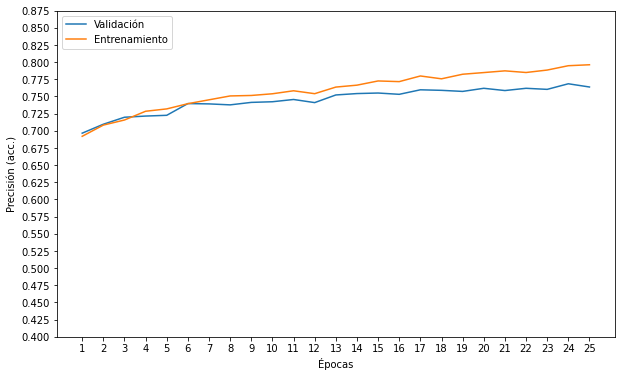

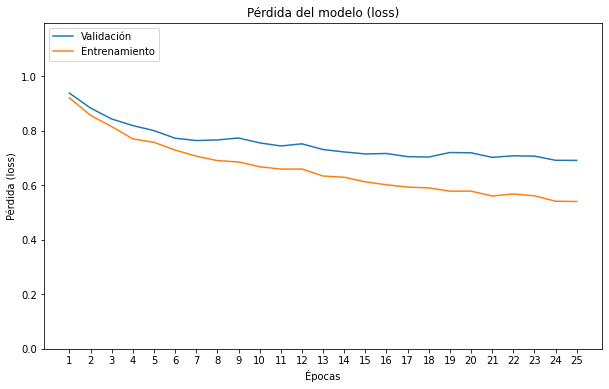

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 57s 689ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 56s 682ms/step - loss: 0.7822 - acc: 0.7226


[0.7822147607803345, 0.7226258516311646]

Se crea la matriz de confusión:

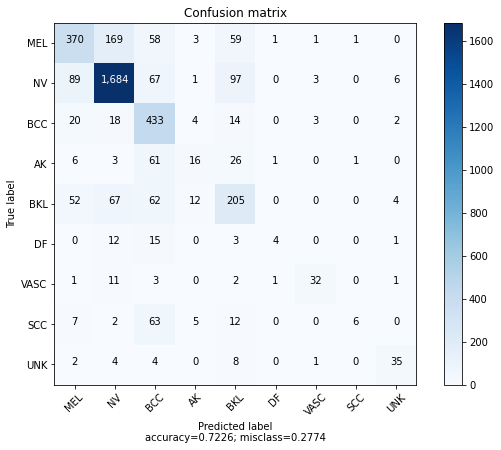

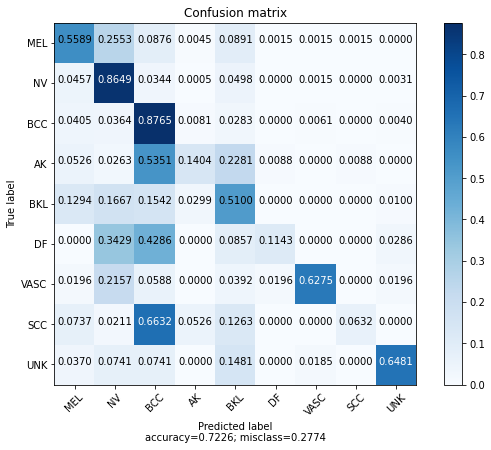

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

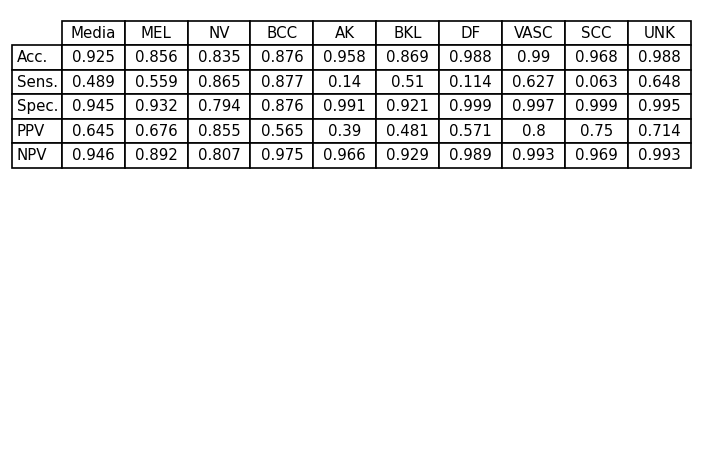

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

### 30 epochs

In [ ]:
model = load_model('/content/drive/My Drive/efficientNet10C2_25.h5')
# es necesario dividir el entrenamiento en partes ya que requiere mucho tiempo
# se carga el modelo entrenado por 25 epochs y se sigue hasta 50

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=5,
                    callbacks=[call]
                    )

Epoch 1/5
939/939 [==============================] - 2119s 2s/step - loss: 0.7209 - acc: 0.7461 - val_loss: 0.5709 - val_acc: 0.7884
Epoch 2/5
939/939 [==============================] - 2017s 2s/step - loss: 0.7190 - acc: 0.7472 - val_loss: 0.5680 - val_acc: 0.7893
Epoch 3/5
939/939 [==============================] - 2005s 2s/step - loss: 0.7042 - acc: 0.7487 - val_loss: 0.5801 - val_acc: 0.7873
Epoch 4/5
939/939 [==============================] - 1992s 2s/step - loss: 0.6994 - acc: 0.7546 - val_loss: 0.5711 - val_acc: 0.7923
Epoch 5/5
939/939 [==============================] - 1995s 2s/step - loss: 0.6921 - acc: 0.7530 - val_loss: 0.5589 - val_acc: 0.7983


#### Gráficas

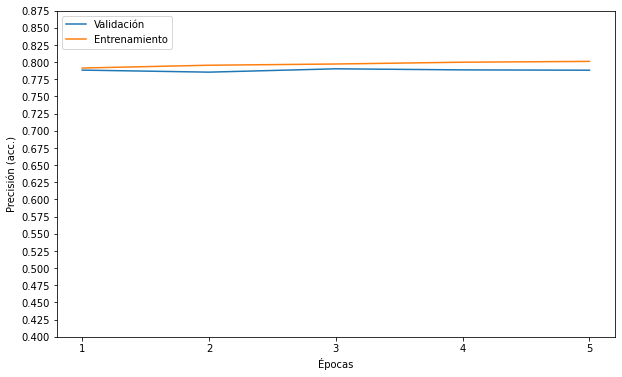

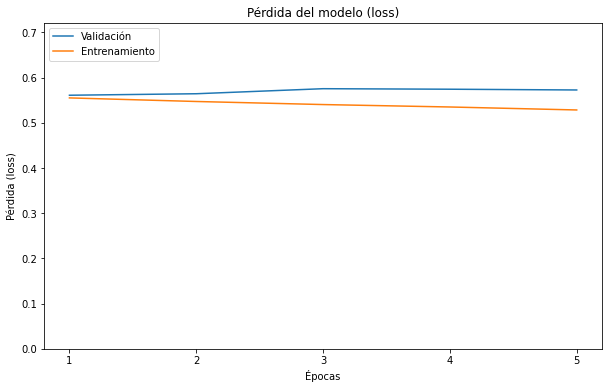

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 75s 916ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 62s 756ms/step - loss: 0.7773 - acc: 0.7263


[0.7772716879844666, 0.7262584567070007]

Se crea la matriz de confusión:

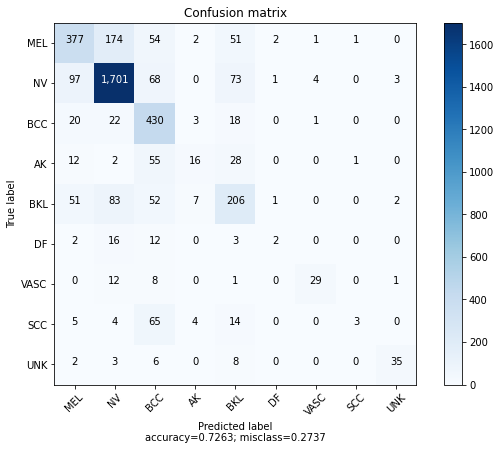

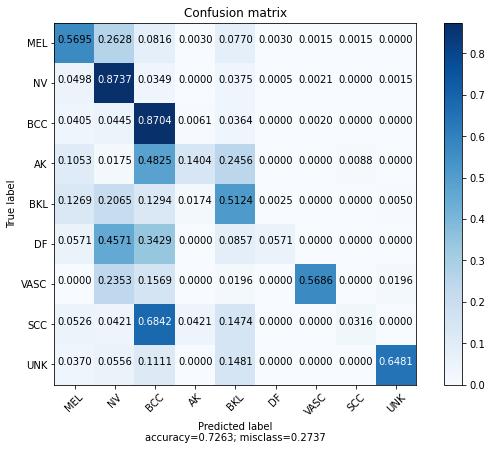

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

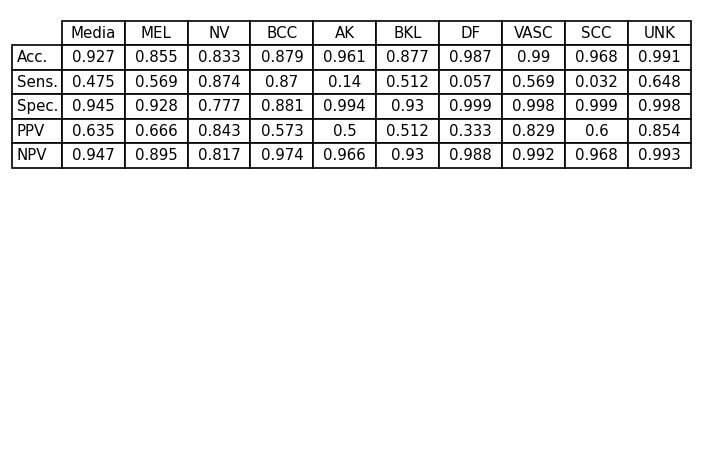

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

### 40 epochs

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=10,
                    callbacks=[call]
                    )

Epoch 1/10
939/939 [==============================] - 2020s 2s/step - loss: 0.6793 - acc: 0.7590 - val_loss: 0.5807 - val_acc: 0.7911
Epoch 2/10
939/939 [==============================] - 2024s 2s/step - loss: 0.6809 - acc: 0.7581 - val_loss: 0.5786 - val_acc: 0.7868
Epoch 3/10
939/939 [==============================] - 2018s 2s/step - loss: 0.6733 - acc: 0.7589 - val_loss: 0.5784 - val_acc: 0.7918
Epoch 4/10
939/939 [==============================] - 2014s 2s/step - loss: 0.6577 - acc: 0.7628 - val_loss: 0.5848 - val_acc: 0.7889
Epoch 5/10
939/939 [==============================] - 2019s 2s/step - loss: 0.6569 - acc: 0.7658 - val_loss: 0.5826 - val_acc: 0.7859
Epoch 6/10
939/939 [==============================] - 2018s 2s/step - loss: 0.6588 - acc: 0.7666 - val_loss: 0.5902 - val_acc: 0.7928
Epoch 7/10
939/939 [==============================] - 2025s 2s/step - loss: 0.6530 - acc: 0.7638 - val_loss: 0.5743 - val_acc: 0.7926
Epoch 8/10
939/939 [==============================] - 2027s 2s

#### Gráficas

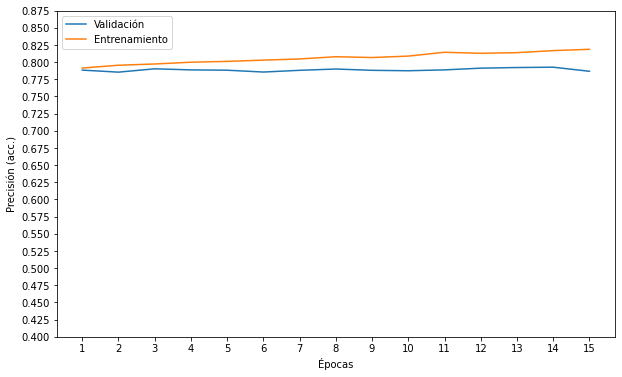

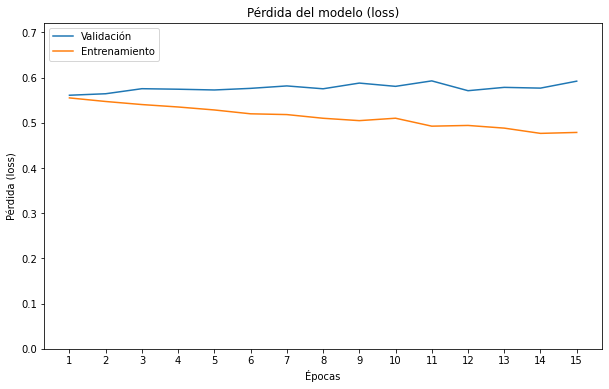

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 62s 756ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 62s 759ms/step - loss: 0.7809 - acc: 0.7291


[0.7809454202651978, 0.7291126251220703]

Se crea la matriz de confusión:

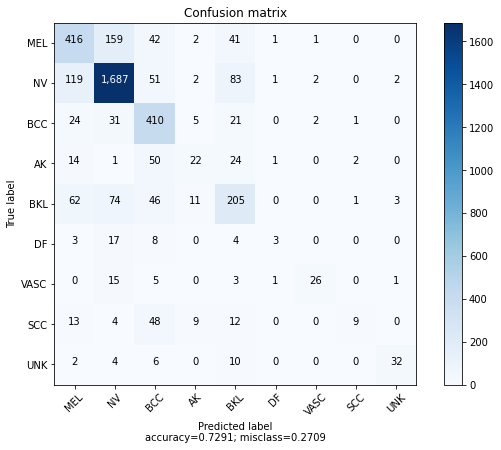

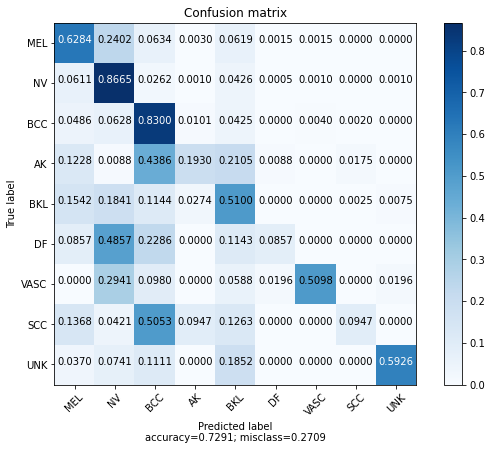

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

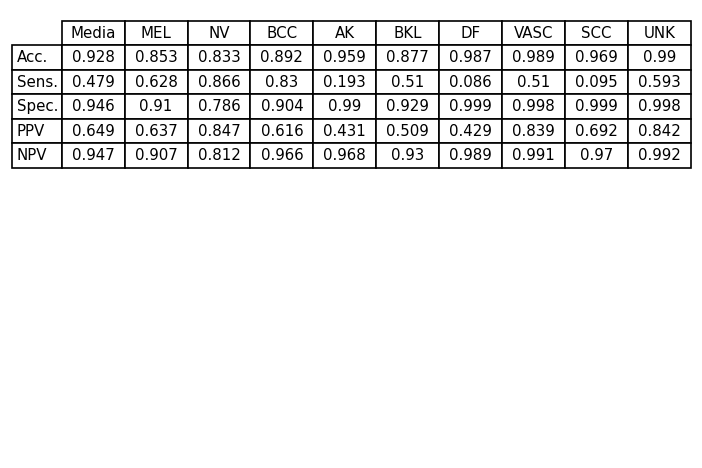

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

### 50 epochs

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=10,
                    callbacks=[call]
                    )

Epoch 1/10
939/939 [==============================] - 2016s 2s/step - loss: 0.6282 - acc: 0.7704 - val_loss: 0.5958 - val_acc: 0.7906
Epoch 2/10
939/939 [==============================] - 2020s 2s/step - loss: 0.6285 - acc: 0.7770 - val_loss: 0.5895 - val_acc: 0.7868
Epoch 3/10
939/939 [==============================] - 2011s 2s/step - loss: 0.6213 - acc: 0.7759 - val_loss: 0.5882 - val_acc: 0.7875
Epoch 4/10
939/939 [==============================] - 2015s 2s/step - loss: 0.6067 - acc: 0.7769 - val_loss: 0.5937 - val_acc: 0.7915
Epoch 5/10
939/939 [==============================] - 2011s 2s/step - loss: 0.6062 - acc: 0.7789 - val_loss: 0.5856 - val_acc: 0.7920
Epoch 6/10
939/939 [==============================] - 2014s 2s/step - loss: 0.6089 - acc: 0.7805 - val_loss: 0.5878 - val_acc: 0.7922
Epoch 7/10
939/939 [==============================] - 2009s 2s/step - loss: 0.6067 - acc: 0.7796 - val_loss: 0.5824 - val_acc: 0.7926
Epoch 8/10
939/939 [==============================] - 2013s 2s

#### Gráficas

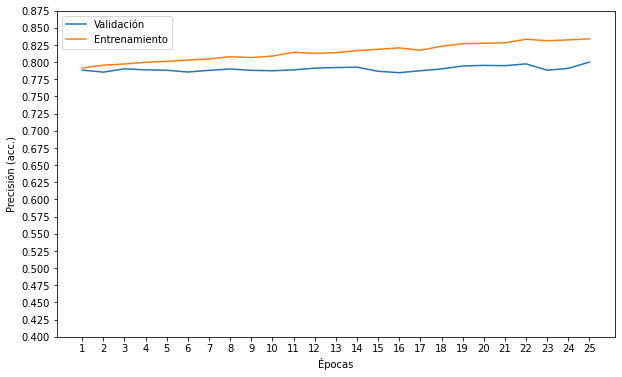

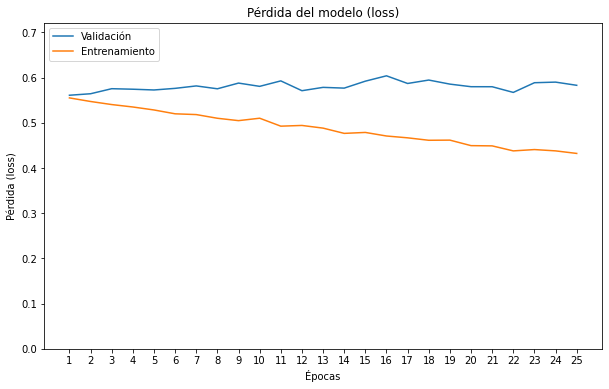

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 62s 760ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 63s 765ms/step - loss: 0.7920 - acc: 0.7410


[0.7920359969139099, 0.741048276424408]

Se crea la matriz de confusión:

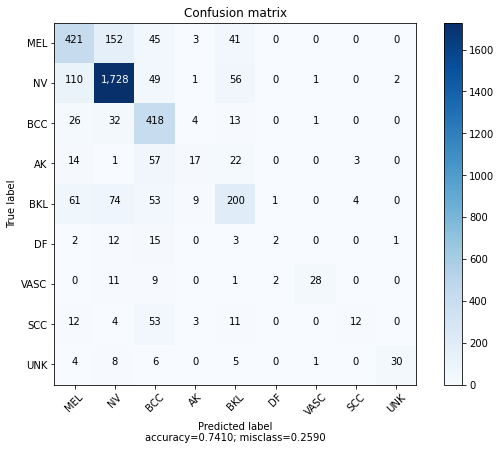

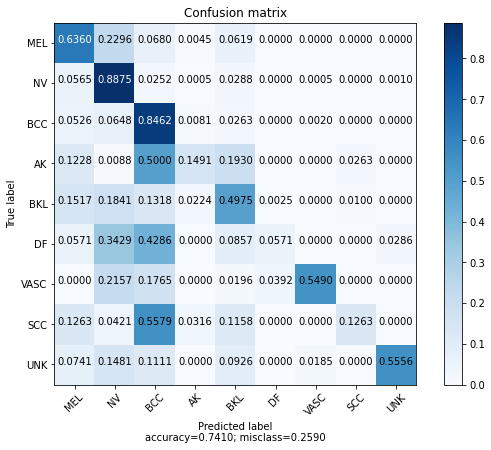

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

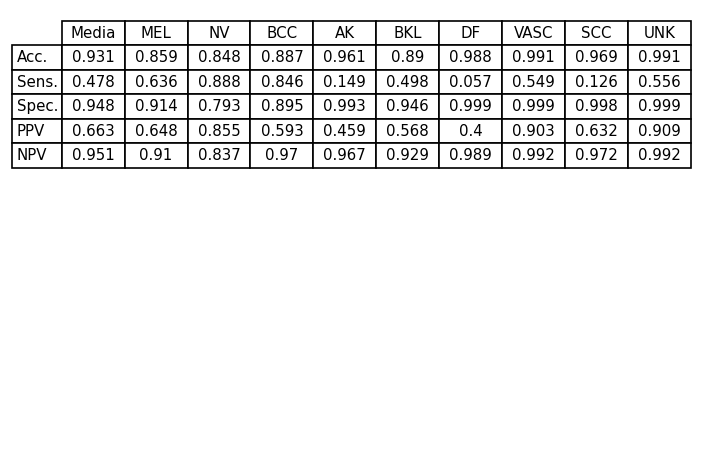

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

## N: ISIC+UNK+L2+7P+SD, LR = 1e-4, Descongelando 9 capas, Neuronas a la mitad

Se crea el modelo:

In [ ]:
def create_EfficientNetB0():
  # Se crea una red EfficientNetB0 sin el clasificador (include_top = false) y con los pesos de haber sido entrenada con ImageNet
  modelEf = efn.EfficientNetB0(include_top=False, weights='imagenet', input_shape=(224,224,3))

  # Las capas de la red se ponen como no entrenables
  for layer in modelEf.layers:
    layer.trainable = False

  # Se añade nuestro clasificador
  last_layer = modelEf.layers[-1]
  last_output = last_layer.output
  x=keras.layers.Flatten()(last_output)
  x=keras.layers.Dense(64,activation='relu')(x)
  x=keras.layers.Dropout(0.5)(x)
  x=keras.layers.Dense(9,activation='softmax')(x)

  model = keras.Model(modelEf.input, x)

  # Se descongelan las 9 últimas capas
  for layer in model.layers[-9:]:
      layer.trainable=True
  
  return model

In [ ]:
model = create_EfficientNetB0()

16809984/16804768 [==============================] - 0s 0us/step


Se crea un Callback que sea llamado al final de cada epoch del entrenamiento para calcular la precisión y error durante el entrenamiento. Esto ya lo hace por defecto la función fit() pero las curvas estaban dando un resultado un tanto extraño (la curva de la precisión de validación mucho mayor que la de entrenamiento), por lo que se optó mejor por esta opción, cuyas curvas sí eran coherentes

In [ ]:
class TrainingHistoryEvaluate(tf.keras.callbacks.Callback):
  def __init__(self):
    self.validAcc = [] 
    self.trainAcc = []
    self.validLoss = []
    self.trainLoss = []

  def on_epoch_end(self, epoch, logs=None):
    valid_generator.reset()
    train_generator.reset()

    lossV,accV = model.evaluate(x=valid_generator,steps=STEP_SIZE_VALID,verbose=1)
    lossT,accT = model.evaluate(x=train_generator,steps=STEP_SIZE_TRAIN,verbose=1)

    self.validAcc.append(accV)
    self.trainAcc.append(accT)
    self.validLoss.append(lossV)
    self.trainLoss.append(lossT)

In [ ]:
call = TrainingHistoryEvaluate()

Se eligen optimizador, learning rate y pérdida (loss)

In [ ]:
opt = tf.keras.optimizers.Adam(learning_rate=0.0001)

model.compile(optimizer=opt,loss='categorical_crossentropy',metrics = ['acc'])

Se entrena el modelo:

### 10 epochs

In [ ]:
# Necesario para cargar imágenes del dataset SD
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=10,
                    callbacks=[call]
                    )

Epoch 1/10
975/975 [==============================] - 1928s 2s/step - loss: 1.2742 - acc: 0.5894 - val_loss: 0.9293 - val_acc: 0.6853
Epoch 2/10
975/975 [==============================] - 1794s 2s/step - loss: 1.0940 - acc: 0.6398 - val_loss: 0.8741 - val_acc: 0.7021
Epoch 3/10
975/975 [==============================] - 1835s 2s/step - loss: 1.0121 - acc: 0.6596 - val_loss: 0.8629 - val_acc: 0.7091
Epoch 4/10
975/975 [==============================] - 1840s 2s/step - loss: 0.9655 - acc: 0.6740 - val_loss: 0.7962 - val_acc: 0.7249
Epoch 5/10
975/975 [==============================] - 1850s 2s/step - loss: 0.9428 - acc: 0.6821 - val_loss: 0.7985 - val_acc: 0.7241
Epoch 6/10
975/975 [==============================] - 1812s 2s/step - loss: 0.9218 - acc: 0.6864 - val_loss: 0.7728 - val_acc: 0.7306
Epoch 7/10
975/975 [==============================] - 1853s 2s/step - loss: 0.8966 - acc: 0.6932 - val_loss: 0.7812 - val_acc: 0.7357
Epoch 8/10
975/975 [==============================] - 1860s 2s

#### Gráficas

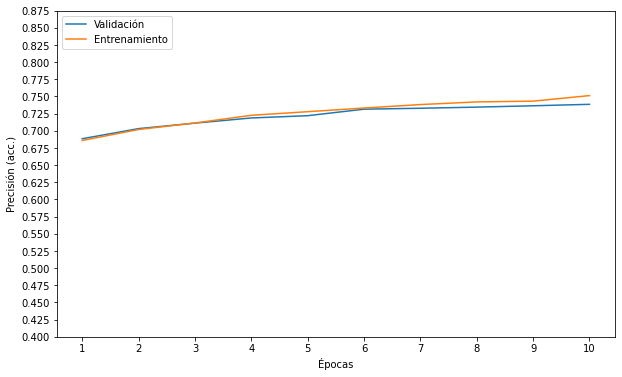

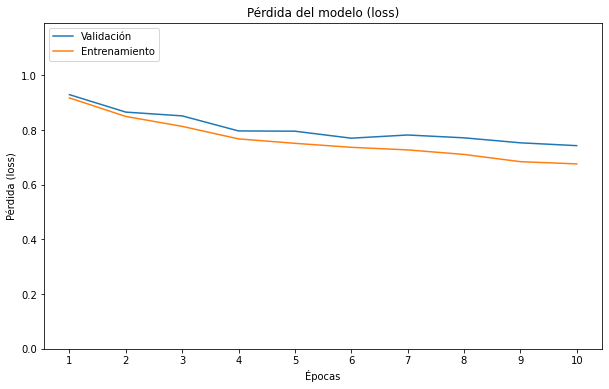

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 73s 890ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 57s 700ms/step - loss: 0.8417 - acc: 0.7055


[0.8417204022407532, 0.7055007815361023]

Se crea la matriz de confusión:

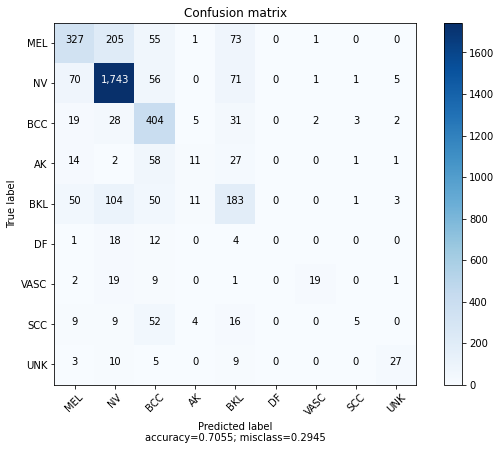

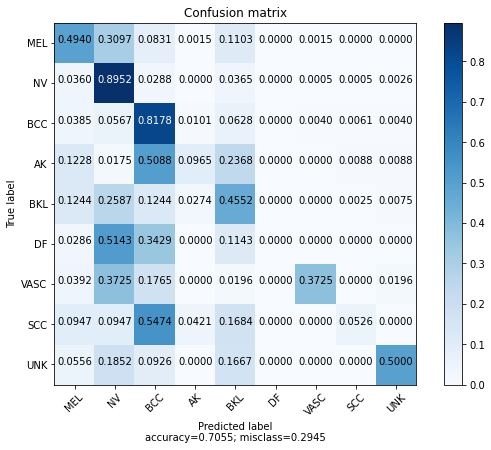

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in true_divide


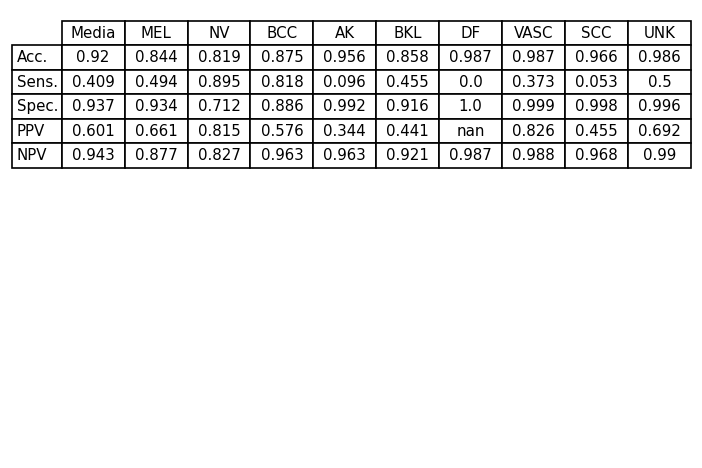

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

### 20 epochs

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=10,
                    callbacks=[call]
                    )

Epoch 1/10
975/975 [==============================] - 1928s 2s/step - loss: 0.8243 - acc: 0.7112 - val_loss: 0.7406 - val_acc: 0.7434
Epoch 2/10
975/975 [==============================] - 1891s 2s/step - loss: 0.8240 - acc: 0.7129 - val_loss: 0.7271 - val_acc: 0.7502
Epoch 3/10
975/975 [==============================] - 1985s 2s/step - loss: 0.8117 - acc: 0.7148 - val_loss: 0.7158 - val_acc: 0.7482
Epoch 4/10
975/975 [==============================] - 2001s 2s/step - loss: 0.7975 - acc: 0.7204 - val_loss: 0.7064 - val_acc: 0.7536
Epoch 5/10
975/975 [==============================] - 2006s 2s/step - loss: 0.7846 - acc: 0.7207 - val_loss: 0.7117 - val_acc: 0.7532
Epoch 6/10
975/975 [==============================] - 1989s 2s/step - loss: 0.7787 - acc: 0.7225 - val_loss: 0.7110 - val_acc: 0.7530
Epoch 7/10
975/975 [==============================] - 1970s 2s/step - loss: 0.7663 - acc: 0.7251 - val_loss: 0.6937 - val_acc: 0.7521
Epoch 8/10
975/975 [==============================] - 1917s 2s

#### Gráficas

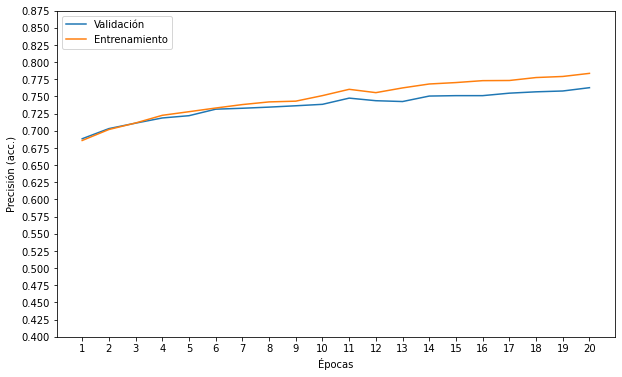

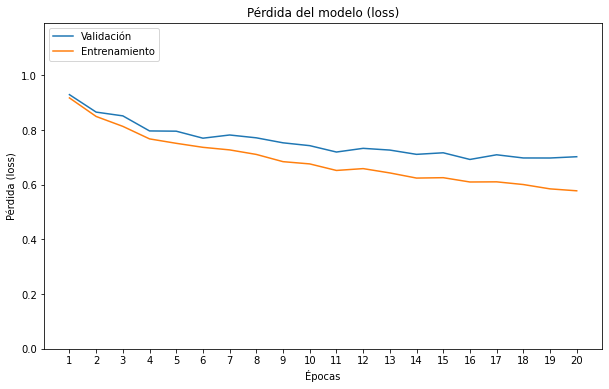

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 56s 688ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 56s 685ms/step - loss: 0.8061 - acc: 0.7226


[0.8061034679412842, 0.7226258516311646]

Se crea la matriz de confusión:

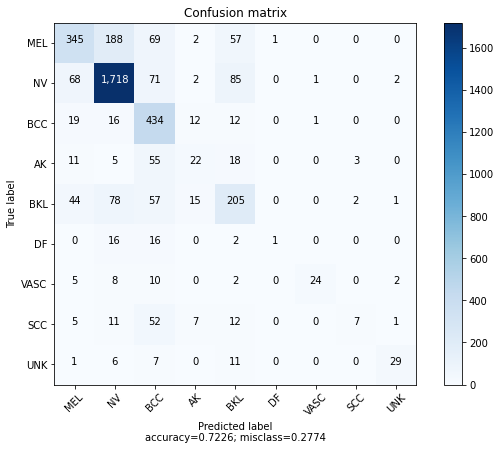

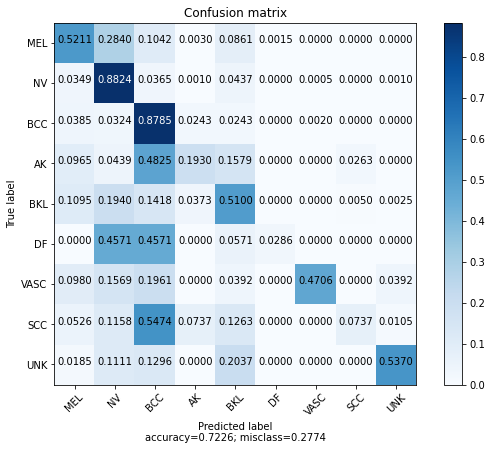

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

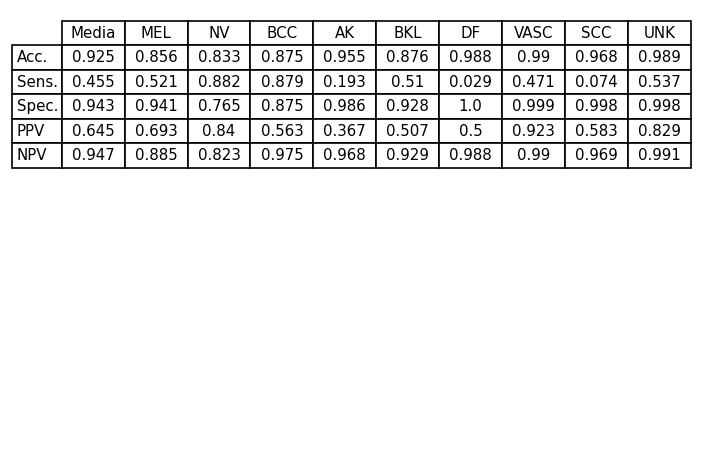

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

### 25 epochs

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=5,
                    callbacks=[call]
                    )

Epoch 1/5
975/975 [==============================] - 1892s 2s/step - loss: 0.7400 - acc: 0.7386 - val_loss: 0.6922 - val_acc: 0.7589
Epoch 2/5
975/975 [==============================] - 1905s 2s/step - loss: 0.7343 - acc: 0.7367 - val_loss: 0.7017 - val_acc: 0.7580
Epoch 3/5
975/975 [==============================] - 1892s 2s/step - loss: 0.7305 - acc: 0.7388 - val_loss: 0.6907 - val_acc: 0.7634
Epoch 4/5
975/975 [==============================] - 1869s 2s/step - loss: 0.7171 - acc: 0.7427 - val_loss: 0.6858 - val_acc: 0.7632
Epoch 5/5
975/975 [==============================] - 1799s 2s/step - loss: 0.7168 - acc: 0.7424 - val_loss: 0.6911 - val_acc: 0.7616


#### Gráficas

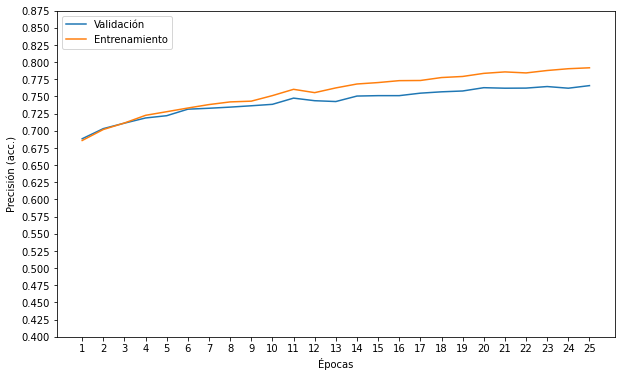

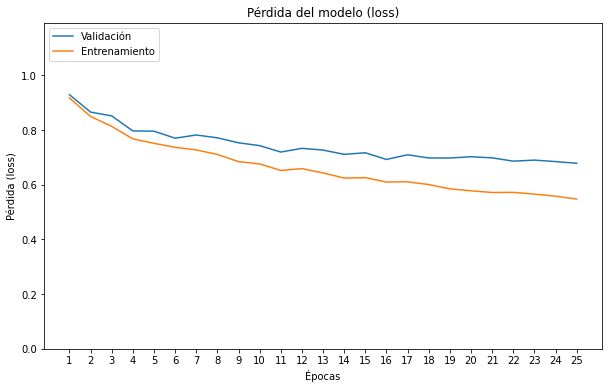

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 53s 652ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 54s 654ms/step - loss: 0.8317 - acc: 0.7244


[0.8316925168037415, 0.7244421243667603]

Se crea la matriz de confusión:

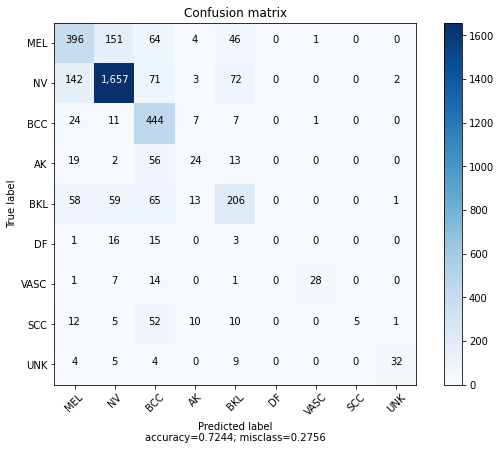

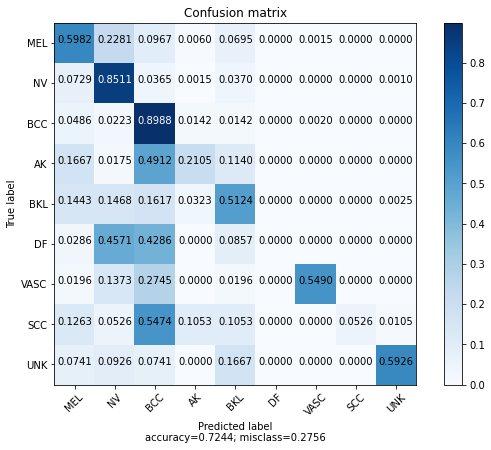

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in true_divide


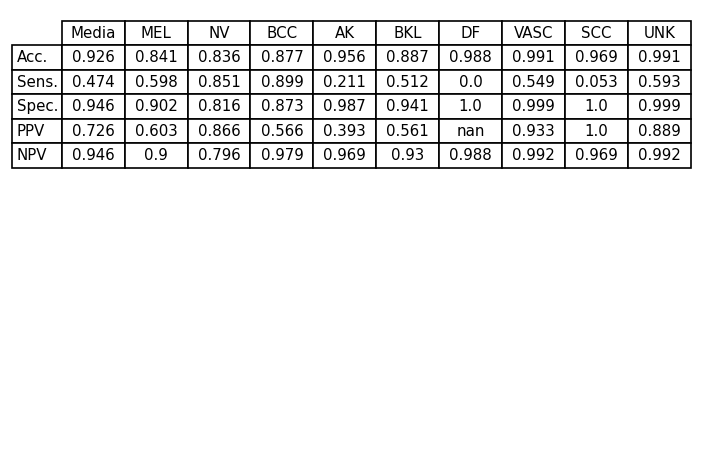

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

### 30 epochs

In [ ]:
model = load_model('/content/drive/My Drive/efficientNet9C2_25.h5')
# es necesario dividir el entrenamiento en partes ya que requiere mucho tiempo
# se carga el modelo entrenado por 25 epochs y se sigue hasta 50

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=5,
                    callbacks=[call]
                    )

Epoch 1/5
975/975 [==============================] - 1944s 2s/step - loss: 0.7300 - acc: 0.7418 - val_loss: 0.5874 - val_acc: 0.7800
Epoch 2/5
975/975 [==============================] - 1800s 2s/step - loss: 0.7231 - acc: 0.7430 - val_loss: 0.5904 - val_acc: 0.7831
Epoch 3/5
975/975 [==============================] - 1840s 2s/step - loss: 0.7092 - acc: 0.7484 - val_loss: 0.5832 - val_acc: 0.7845
Epoch 4/5
975/975 [==============================] - 1842s 2s/step - loss: 0.6982 - acc: 0.7490 - val_loss: 0.5851 - val_acc: 0.7864
Epoch 5/5
975/975 [==============================] - 1806s 2s/step - loss: 0.7011 - acc: 0.7508 - val_loss: 0.5746 - val_acc: 0.7837


#### Gráficas

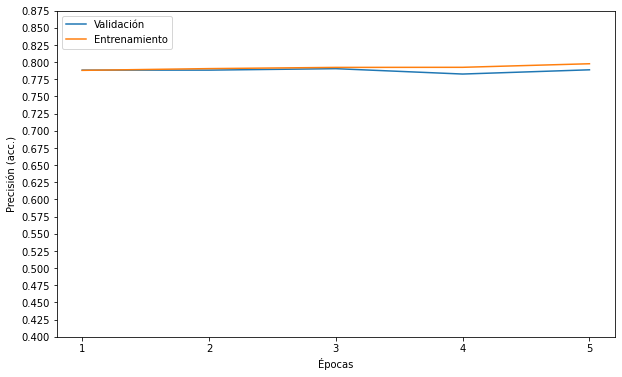

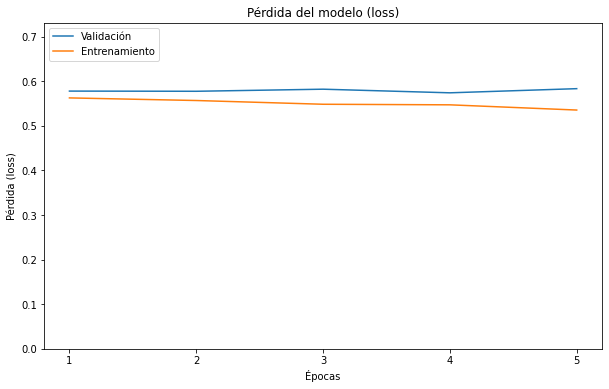

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 72s 872ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 56s 682ms/step - loss: 0.7712 - acc: 0.7359


[0.7711699604988098, 0.7358588576316833]

Se crea la matriz de confusión:

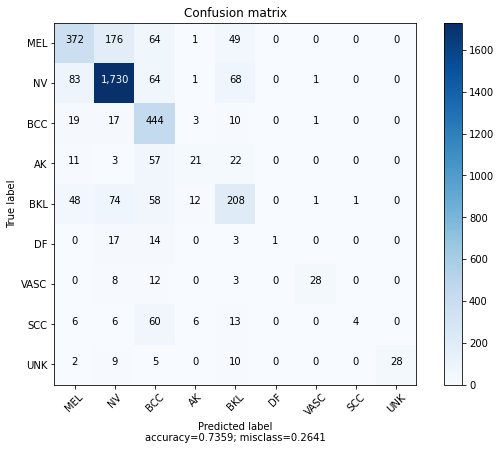

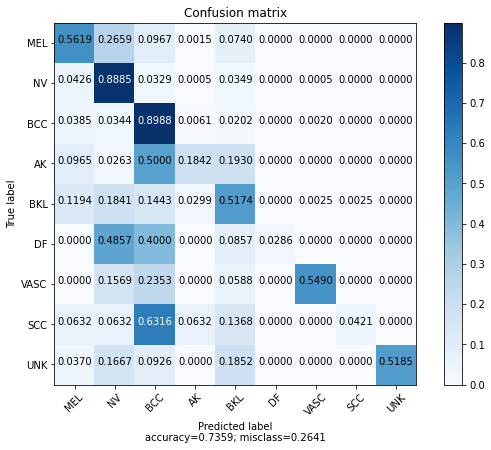

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

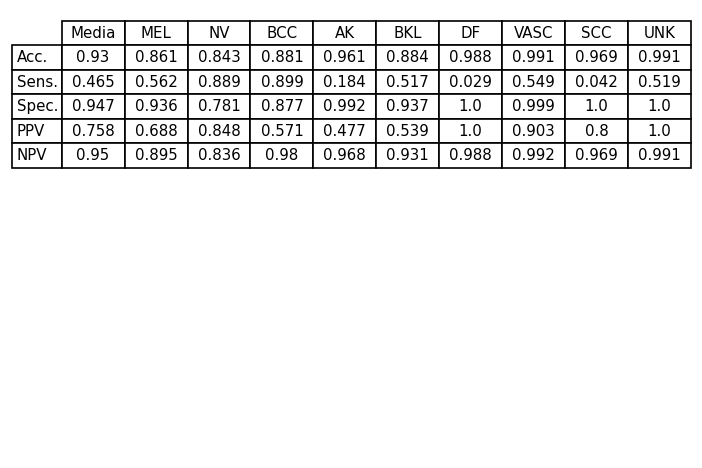

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

### 40 epochs

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=10,
                    callbacks=[call]
                    )

Epoch 1/10
975/975 [==============================] - 1787s 2s/step - loss: 0.6861 - acc: 0.7534 - val_loss: 0.5816 - val_acc: 0.7840
Epoch 2/10
975/975 [==============================] - 1775s 2s/step - loss: 0.6825 - acc: 0.7572 - val_loss: 0.5921 - val_acc: 0.7909
Epoch 3/10
975/975 [==============================] - 1771s 2s/step - loss: 0.6786 - acc: 0.7566 - val_loss: 0.5854 - val_acc: 0.7879
Epoch 4/10
975/975 [==============================] - 1798s 2s/step - loss: 0.6740 - acc: 0.7559 - val_loss: 0.5911 - val_acc: 0.7836
Epoch 5/10
975/975 [==============================] - 1793s 2s/step - loss: 0.6659 - acc: 0.7621 - val_loss: 0.5905 - val_acc: 0.7923
Epoch 6/10
975/975 [==============================] - 1783s 2s/step - loss: 0.6645 - acc: 0.7608 - val_loss: 0.5810 - val_acc: 0.7894
Epoch 7/10
975/975 [==============================] - 1775s 2s/step - loss: 0.6553 - acc: 0.7650 - val_loss: 0.5830 - val_acc: 0.7840
Epoch 8/10
975/975 [==============================] - 1787s 2s

#### Gráficas

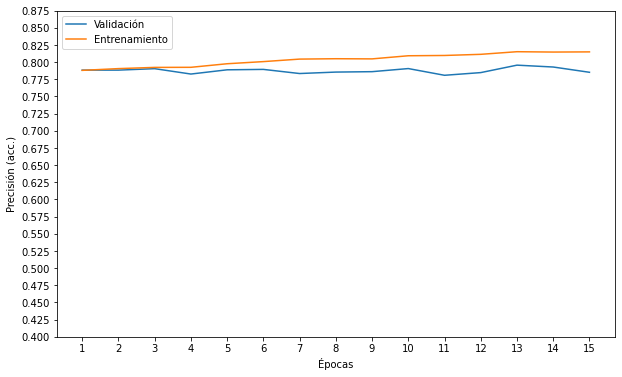

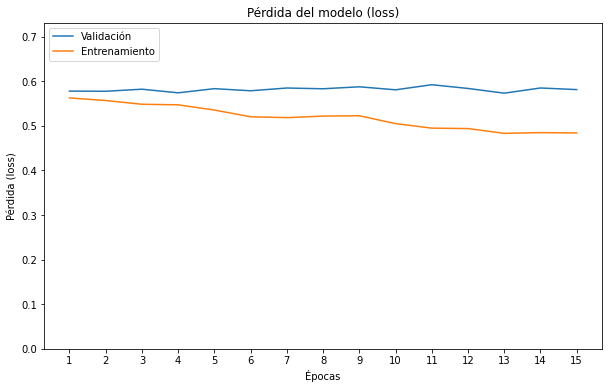

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 53s 649ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 54s 653ms/step - loss: 0.8259 - acc: 0.7177


[0.8258520364761353, 0.7176958918571472]

Se crea la matriz de confusión:

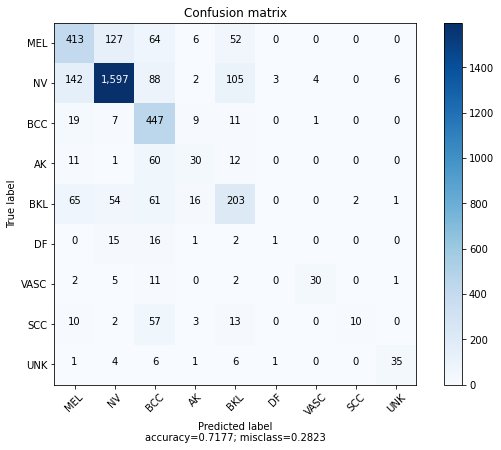

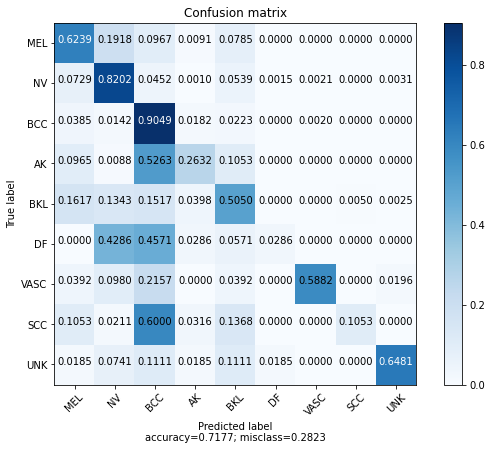

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

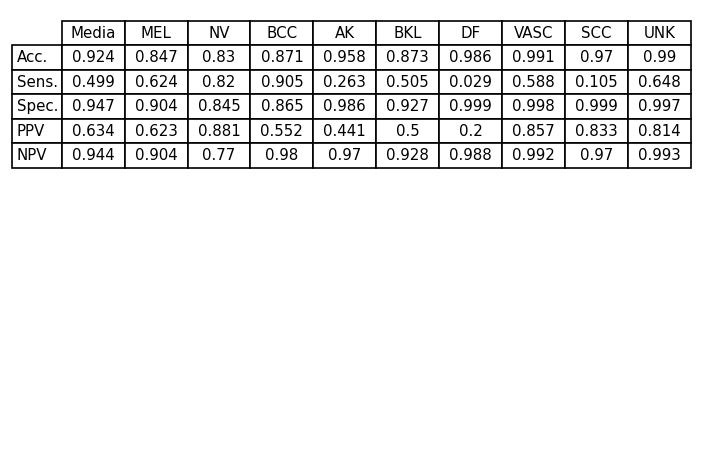

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

### 50 epochs

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=10,
                    callbacks=[call]
                    )

Epoch 1/10
975/975 [==============================] - 1790s 2s/step - loss: 0.6424 - acc: 0.7658 - val_loss: 0.5810 - val_acc: 0.7869
Epoch 2/10
975/975 [==============================] - 1792s 2s/step - loss: 0.6331 - acc: 0.7695 - val_loss: 0.5879 - val_acc: 0.7833
Epoch 3/10
975/975 [==============================] - 1790s 2s/step - loss: 0.6289 - acc: 0.7729 - val_loss: 0.5905 - val_acc: 0.7893
Epoch 4/10
975/975 [==============================] - 1794s 2s/step - loss: 0.6259 - acc: 0.7723 - val_loss: 0.5842 - val_acc: 0.7946
Epoch 5/10
975/975 [==============================] - 1801s 2s/step - loss: 0.6223 - acc: 0.7737 - val_loss: 0.5815 - val_acc: 0.7911
Epoch 6/10
975/975 [==============================] - 1811s 2s/step - loss: 0.6161 - acc: 0.7768 - val_loss: 0.5845 - val_acc: 0.7970
Epoch 7/10
975/975 [==============================] - 1827s 2s/step - loss: 0.6204 - acc: 0.7750 - val_loss: 0.5986 - val_acc: 0.7894
Epoch 8/10
975/975 [==============================] - 1802s 2s

#### Gráficas

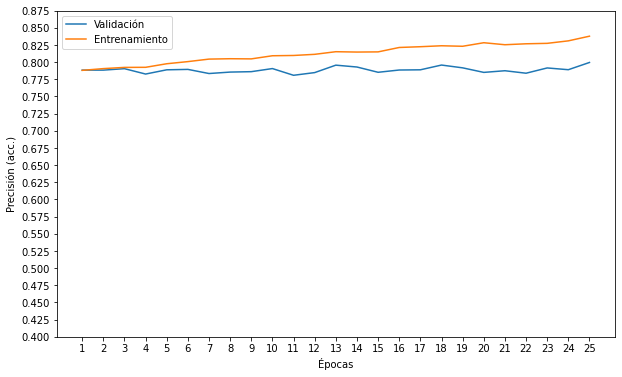

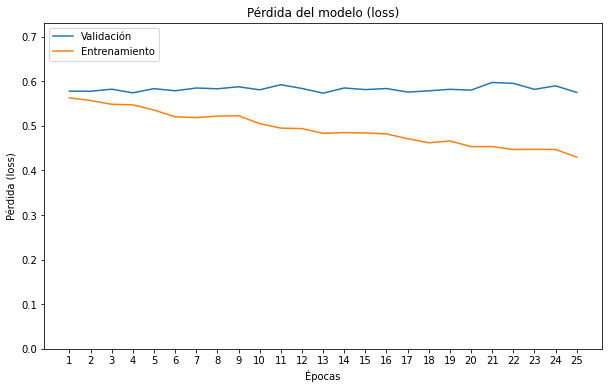

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 56s 679ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 55s 675ms/step - loss: 0.7665 - acc: 0.7374


[0.7665010094642639, 0.7374156713485718]

Se crea la matriz de confusión:

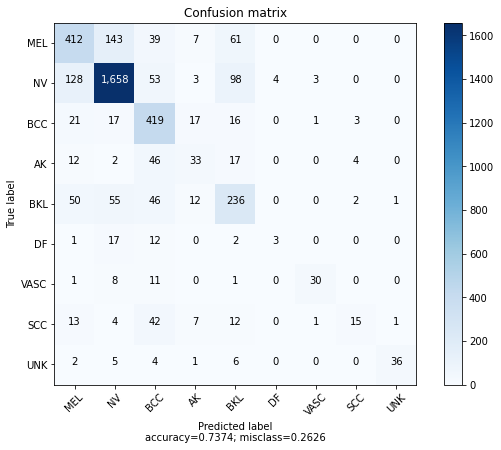

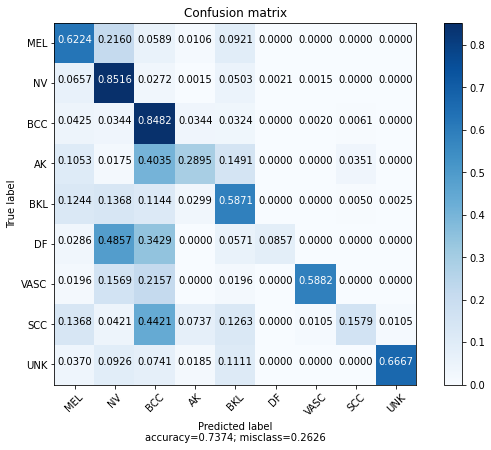

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

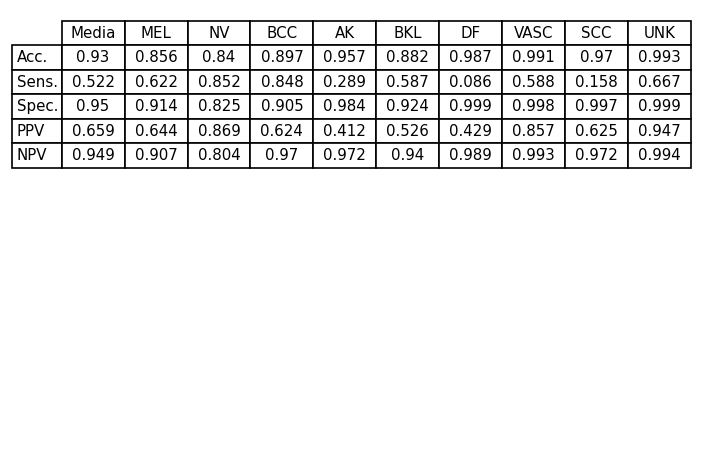

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

# INCORPORACIÓN DATASETS (CON L2)

## O: ISIC+UNK+L2+7P, LR = 1e-4, Descongelando 9 capas, L2 = 0.01, Neuronas a la mitad

Se crea el modelo:

In [ ]:
def create_EfficientNetB0():
  # Se crea una red EfficientNetB0 sin el clasificador (include_top = false) y con los pesos de haber sido entrenada con ImageNet
  modelEf = efn.EfficientNetB0(include_top=False, weights='imagenet', input_shape=(224,224,3))

  # Las capas de la red se ponen como no entrenables
  for layer in modelEf.layers:
    layer.trainable = False

  # Se añade nuestro clasificador
  last_layer = modelEf.layers[-1]
  last_output = last_layer.output
  x=keras.layers.Flatten()(last_output)
  x=keras.layers.Dense(64,activation='relu',kernel_regularizer=regularizers.l2(0.01))(x) # Se añade regularización L2
  x=keras.layers.Dropout(0.5)(x)
  x=keras.layers.Dense(9,activation='softmax')(x)

  model = keras.Model(modelEf.input, x)

  # Se descongelan las 9 últimas capas
  for layer in model.layers[-9:]:
      layer.trainable=True
  
  return model

In [ ]:
model = create_EfficientNetB0()

16809984/16804768 [==============================] - 1s 0us/step


Se crea un Callback que sea llamado al final de cada epoch del entrenamiento para calcular la precisión y error durante el entrenamiento. Esto ya lo hace por defecto la función fit() pero las curvas estaban dando un resultado un tanto extraño (la curva de la precisión de validación mucho mayor que la de entrenamiento), por lo que se optó mejor por esta opción, cuyas curvas sí eran coherentes

In [ ]:
class TrainingHistoryEvaluate(tf.keras.callbacks.Callback):
  def __init__(self):
    self.validAcc = [] 
    self.trainAcc = []
    self.validLoss = []
    self.trainLoss = []

  def on_epoch_end(self, epoch, logs=None):
    valid_generator.reset()
    train_generator.reset()

    lossV,accV = model.evaluate(x=valid_generator,steps=STEP_SIZE_VALID,verbose=1)
    lossT,accT = model.evaluate(x=train_generator,steps=STEP_SIZE_TRAIN,verbose=1)

    self.validAcc.append(accV)
    self.trainAcc.append(accT)
    self.validLoss.append(lossV)
    self.trainLoss.append(lossT)

In [ ]:
call = TrainingHistoryEvaluate()

Se eligen optimizador, learning rate y pérdida (loss)

In [ ]:
opt = tf.keras.optimizers.Adam(learning_rate=0.0001)

model.compile(optimizer=opt,loss='categorical_crossentropy',metrics = ['acc'])

Se entrena el modelo:

### 20 epochs

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=20,
                    callbacks=[call]
                    )

Epoch 1/20
598/598 [==============================] - 1299s 2s/step - loss: 2.5287 - acc: 0.5228 - val_loss: 1.9754 - val_acc: 0.6319
Epoch 2/20
598/598 [==============================] - 1187s 2s/step - loss: 2.0074 - acc: 0.5796 - val_loss: 1.6589 - val_acc: 0.6448
Epoch 3/20
598/598 [==============================] - 1178s 2s/step - loss: 1.7225 - acc: 0.6056 - val_loss: 1.4573 - val_acc: 0.6648
Epoch 4/20
598/598 [==============================] - 1194s 2s/step - loss: 1.5847 - acc: 0.6192 - val_loss: 1.3665 - val_acc: 0.6677
Epoch 5/20
598/598 [==============================] - 1193s 2s/step - loss: 1.4664 - acc: 0.6279 - val_loss: 1.2773 - val_acc: 0.6791
Epoch 6/20
598/598 [==============================] - 1182s 2s/step - loss: 1.3969 - acc: 0.6461 - val_loss: 1.2692 - val_acc: 0.6838
Epoch 7/20
598/598 [==============================] - 1186s 2s/step - loss: 1.3790 - acc: 0.6477 - val_loss: 1.2335 - val_acc: 0.6910
Epoch 8/20
598/598 [==============================] - 1184s 2s

#### Gráficas

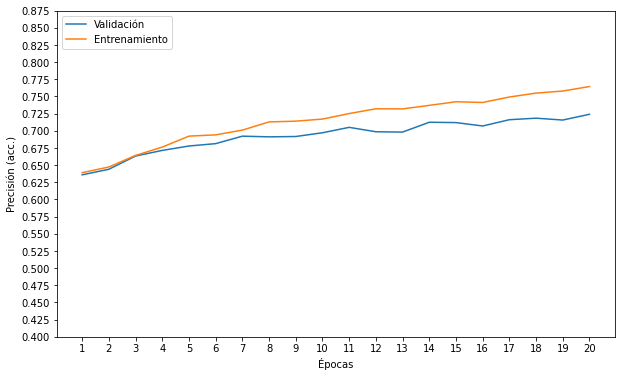

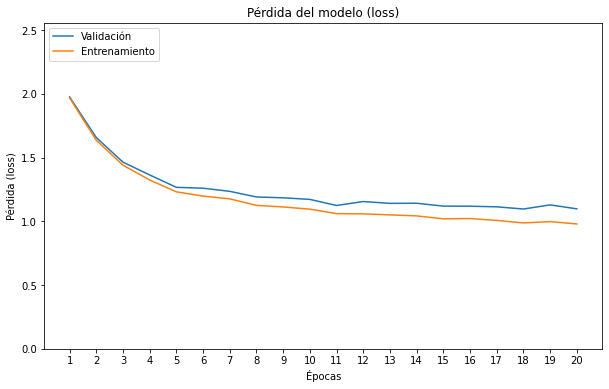

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 69s 836ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 58s 705ms/step - loss: 1.1221 - acc: 0.7265


[1.1220675706863403, 0.726517915725708]

Se crea la matriz de confusión:

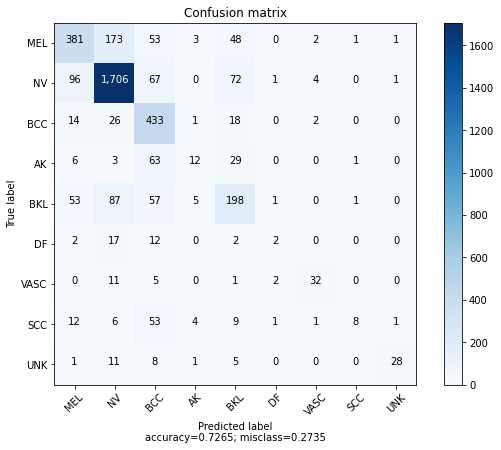

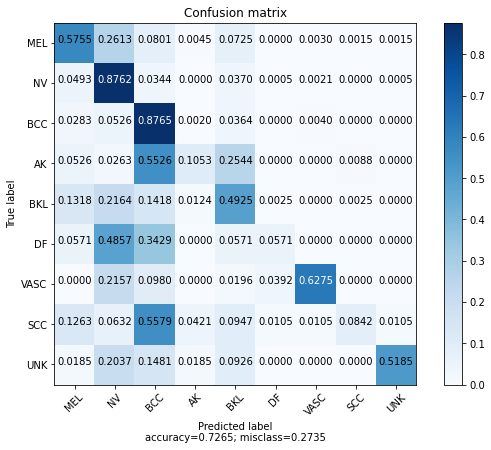

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

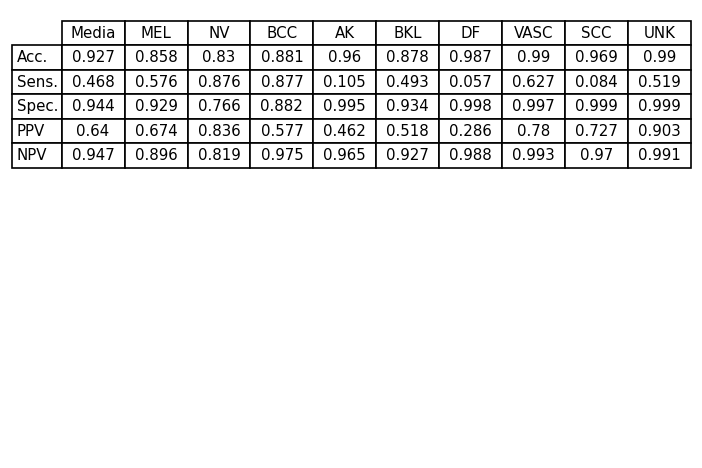

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

### 45 epochs

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=25,
                    callbacks=[call]
                    )

Epoch 1/25
598/598 [==============================] - 1128s 2s/step - loss: 1.1395 - acc: 0.7147 - val_loss: 1.1015 - val_acc: 0.7184
Epoch 2/25
598/598 [==============================] - 1092s 2s/step - loss: 1.1419 - acc: 0.7112 - val_loss: 1.0893 - val_acc: 0.7248
Epoch 3/25
598/598 [==============================] - 1085s 2s/step - loss: 1.1332 - acc: 0.7116 - val_loss: 1.1077 - val_acc: 0.7248
Epoch 4/25
598/598 [==============================] - 1088s 2s/step - loss: 1.1256 - acc: 0.7146 - val_loss: 1.0881 - val_acc: 0.7278
Epoch 5/25
598/598 [==============================] - 1133s 2s/step - loss: 1.1170 - acc: 0.7217 - val_loss: 1.0819 - val_acc: 0.7275
Epoch 6/25
598/598 [==============================] - 1131s 2s/step - loss: 1.1096 - acc: 0.7215 - val_loss: 1.0910 - val_acc: 0.7325
Epoch 7/25
598/598 [==============================] - 1129s 2s/step - loss: 1.1083 - acc: 0.7200 - val_loss: 1.0928 - val_acc: 0.7265
Epoch 8/25
598/598 [==============================] - 1102s 2s

#### Gráficas

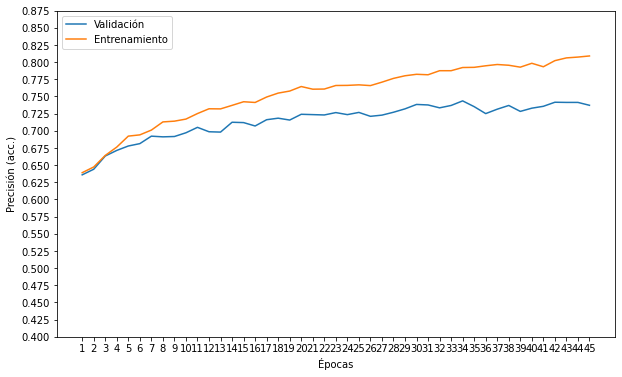

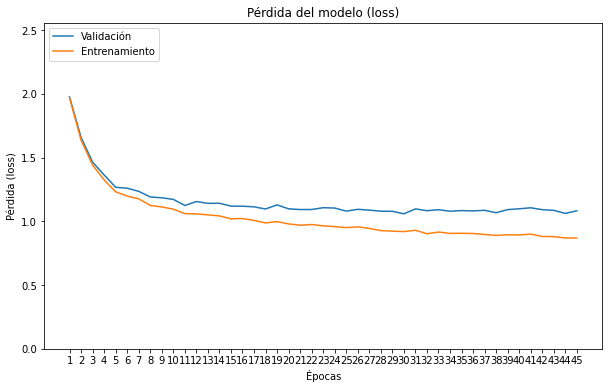

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 55s 676ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 55s 668ms/step - loss: 1.1218 - acc: 0.7372


[1.121827244758606, 0.7371562123298645]

Se crea la matriz de confusión:

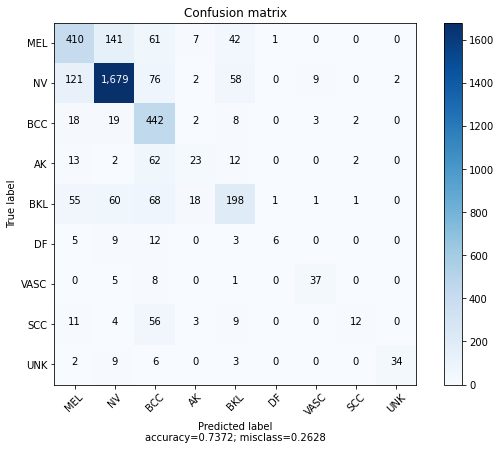

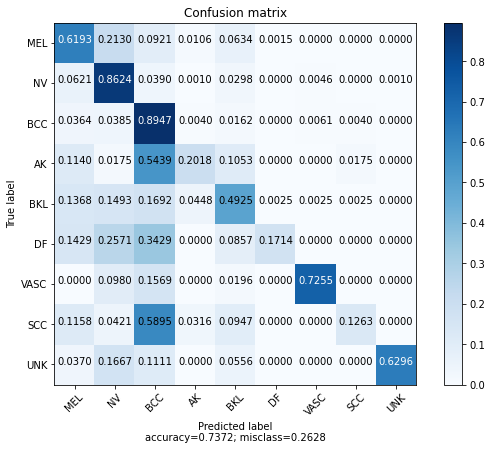

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

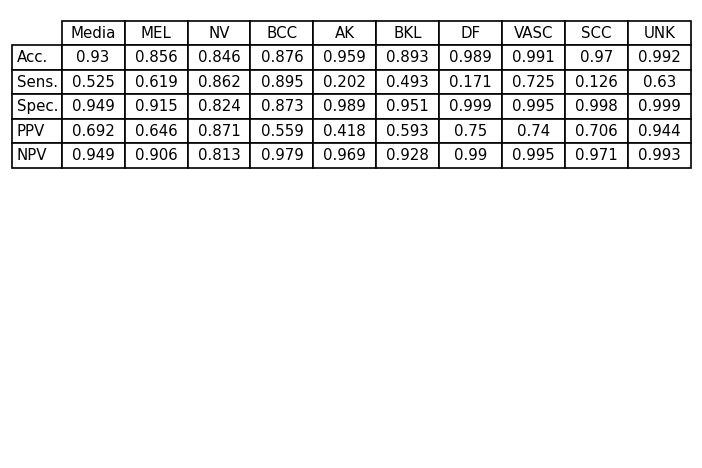

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

### 50 epochs

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=5,
                    callbacks=[call]
                    )

Epoch 1/5
598/598 [==============================] - 1101s 2s/step - loss: 1.0244 - acc: 0.7550 - val_loss: 1.0501 - val_acc: 0.7473
Epoch 2/5
598/598 [==============================] - 1108s 2s/step - loss: 1.0217 - acc: 0.7544 - val_loss: 1.0705 - val_acc: 0.7465
Epoch 3/5
598/598 [==============================] - 1111s 2s/step - loss: 1.0185 - acc: 0.7601 - val_loss: 1.0787 - val_acc: 0.7451
Epoch 4/5
598/598 [==============================] - 1114s 2s/step - loss: 1.0172 - acc: 0.7621 - val_loss: 1.0801 - val_acc: 0.7500
Epoch 5/5
598/598 [==============================] - 1141s 2s/step - loss: 1.0154 - acc: 0.7612 - val_loss: 1.0658 - val_acc: 0.7394


#### Gráficas

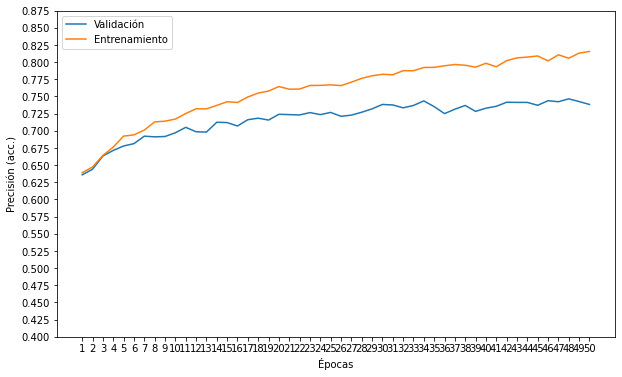

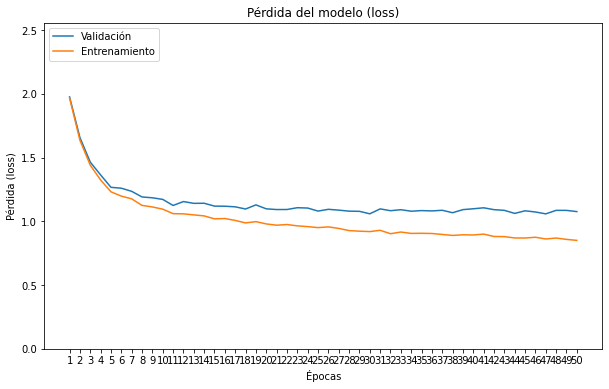

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 62s 750ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 60s 729ms/step - loss: 1.1282 - acc: 0.7343


[1.1282055377960205, 0.7343020439147949]

Se crea la matriz de confusión:

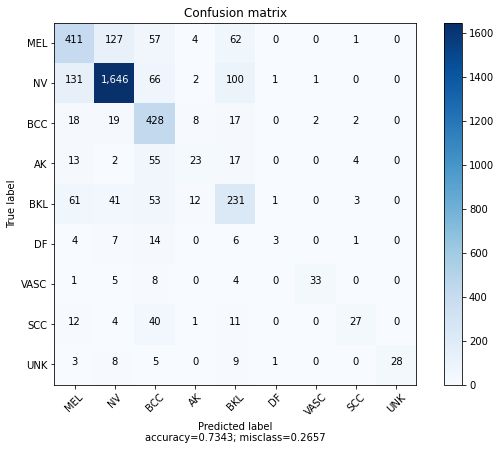

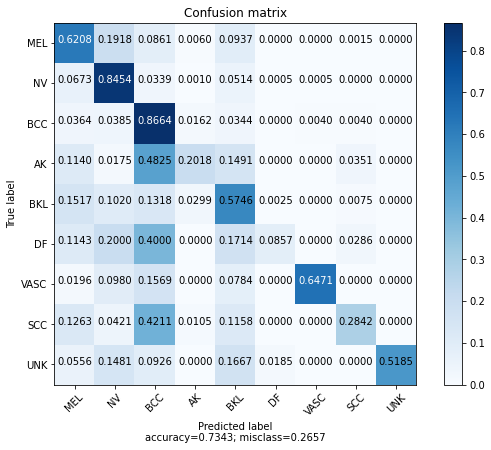

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

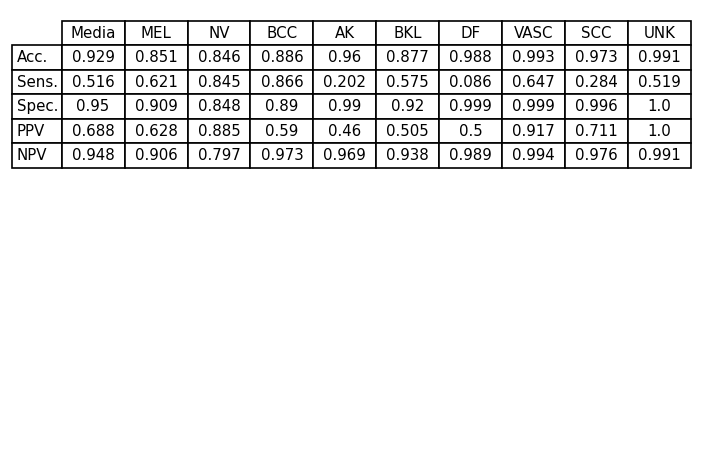

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

## P: ISIC+UNK+SD, LR = 1e-4, Descongelando 9 capas, L2 = 0.01, Neuronas a la mitad

Se crea el modelo:

In [ ]:
def create_EfficientNetB0():
  # Se crea una red EfficientNetB0 sin el clasificador (include_top = false) y con los pesos de haber sido entrenada con ImageNet
  modelEf = efn.EfficientNetB0(include_top=False, weights='imagenet', input_shape=(224,224,3))

  # Las capas de la red se ponen como no entrenables
  for layer in modelEf.layers:
    layer.trainable = False

  # Se añade nuestro clasificador
  last_layer = modelEf.layers[-1]
  last_output = last_layer.output
  x=keras.layers.Flatten()(last_output)
  x=keras.layers.Dense(64,activation='relu',kernel_regularizer=regularizers.l2(0.01))(x) # Se añade regularización L2
  x=keras.layers.Dropout(0.5)(x)
  x=keras.layers.Dense(9,activation='softmax')(x)

  model = keras.Model(modelEf.input, x)

  # Se descongelan las 9 últimas capas
  for layer in model.layers[-9:]:
      layer.trainable=True
  
  return model

In [ ]:
model = create_EfficientNetB0()

16809984/16804768 [==============================] - 2s 0us/step


Se crea un Callback que sea llamado al final de cada epoch del entrenamiento para calcular la precisión y error durante el entrenamiento. Esto ya lo hace por defecto la función fit() pero las curvas estaban dando un resultado un tanto extraño (la curva de la precisión de validación mucho mayor que la de entrenamiento), por lo que se optó mejor por esta opción, cuyas curvas sí eran coherentes

In [ ]:
class TrainingHistoryEvaluate(tf.keras.callbacks.Callback):
  def __init__(self):
    self.validAcc = [] 
    self.trainAcc = []
    self.validLoss = []
    self.trainLoss = []

  def on_epoch_end(self, epoch, logs=None):
    valid_generator.reset()
    train_generator.reset()

    lossV,accV = model.evaluate(x=valid_generator,steps=STEP_SIZE_VALID,verbose=1)
    lossT,accT = model.evaluate(x=train_generator,steps=STEP_SIZE_TRAIN,verbose=1)

    self.validAcc.append(accV)
    self.trainAcc.append(accT)
    self.validLoss.append(lossV)
    self.trainLoss.append(lossT)

In [ ]:
call = TrainingHistoryEvaluate()

Se eligen optimizador, learning rate y pérdida (loss)

In [ ]:
opt = tf.keras.optimizers.Adam(learning_rate=0.0001)

model.compile(optimizer=opt,loss='categorical_crossentropy',metrics = ['acc'])

Se entrena el modelo:

### 10 epochs

In [ ]:
# Necesario para cargar imágenes del dataset SD
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=10,
                    callbacks=[call]
                    )

Epoch 1/10
939/939 [==============================] - 1882s 2s/step - loss: 2.2812 - acc: 0.5921 - val_loss: 1.7148 - val_acc: 0.6788
Epoch 2/10
939/939 [==============================] - 1857s 2s/step - loss: 1.7139 - acc: 0.6484 - val_loss: 1.4385 - val_acc: 0.6983
Epoch 3/10
939/939 [==============================] - 1807s 2s/step - loss: 1.4768 - acc: 0.6684 - val_loss: 1.2923 - val_acc: 0.7064
Epoch 4/10
939/939 [==============================] - 1712s 2s/step - loss: 1.3640 - acc: 0.6786 - val_loss: 1.2001 - val_acc: 0.7102
Epoch 5/10
939/939 [==============================] - 1708s 2s/step - loss: 1.2972 - acc: 0.6850 - val_loss: 1.1618 - val_acc: 0.7146
Epoch 6/10
939/939 [==============================] - 1706s 2s/step - loss: 1.2370 - acc: 0.6962 - val_loss: 1.1256 - val_acc: 0.7171
Epoch 7/10
939/939 [==============================] - 1698s 2s/step - loss: 1.2015 - acc: 0.7025 - val_loss: 1.1054 - val_acc: 0.7223
Epoch 8/10
939/939 [==============================] - 1719s 2s

#### Gráficas

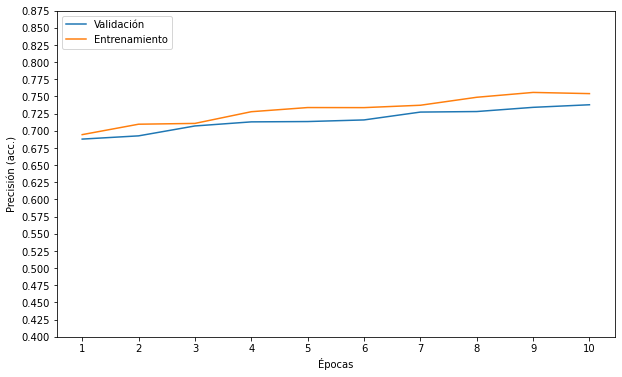

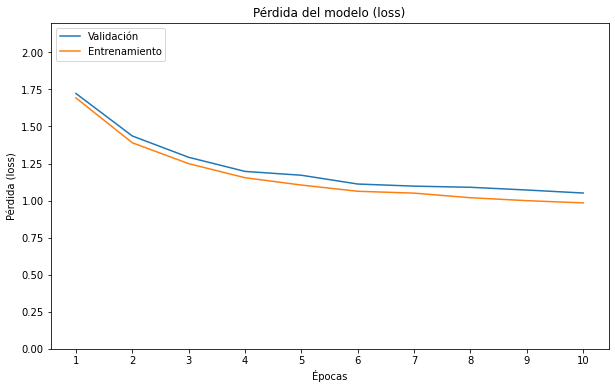

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 64s 778ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 54s 653ms/step - loss: 1.1480 - acc: 0.7008


[1.1480292081832886, 0.7008302807807922]

Se crea la matriz de confusión:

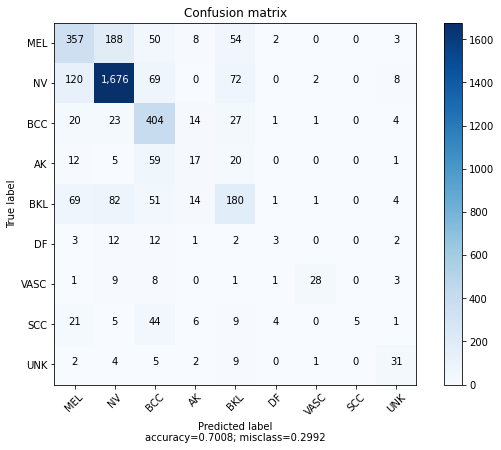

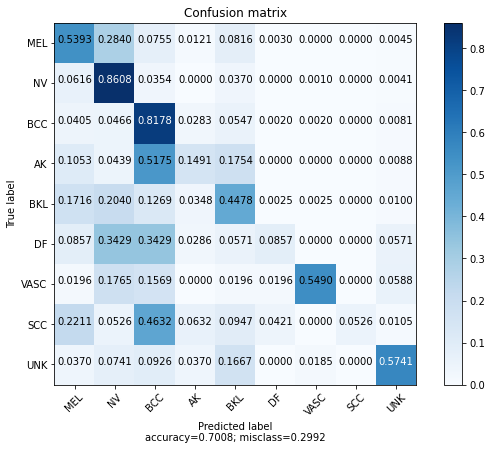

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

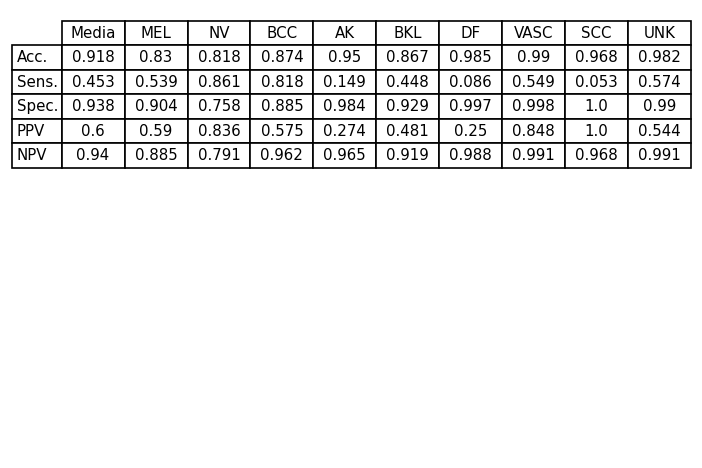

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

### 20 epochs

In [ ]:
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=10,
                    callbacks=[call]
                    )

Epoch 1/10
939/939 [==============================] - 1709s 2s/step - loss: 1.1328 - acc: 0.7193 - val_loss: 1.0676 - val_acc: 0.7378
Epoch 2/10
939/939 [==============================] - 1704s 2s/step - loss: 1.1198 - acc: 0.7208 - val_loss: 1.0670 - val_acc: 0.7370
Epoch 3/10
939/939 [==============================] - 1699s 2s/step - loss: 1.1025 - acc: 0.7269 - val_loss: 1.0387 - val_acc: 0.7406
Epoch 4/10
939/939 [==============================] - 1700s 2s/step - loss: 1.0959 - acc: 0.7313 - val_loss: 1.0500 - val_acc: 0.7382
Epoch 5/10
939/939 [==============================] - 1711s 2s/step - loss: 1.0873 - acc: 0.7317 - val_loss: 1.0285 - val_acc: 0.7423
Epoch 6/10
939/939 [==============================] - 1711s 2s/step - loss: 1.0752 - acc: 0.7360 - val_loss: 1.0374 - val_acc: 0.7428
Epoch 7/10
939/939 [==============================] - 1730s 2s/step - loss: 1.0707 - acc: 0.7382 - val_loss: 1.0332 - val_acc: 0.7428
Epoch 8/10
939/939 [==============================] - 1761s 2s

#### Gráficas

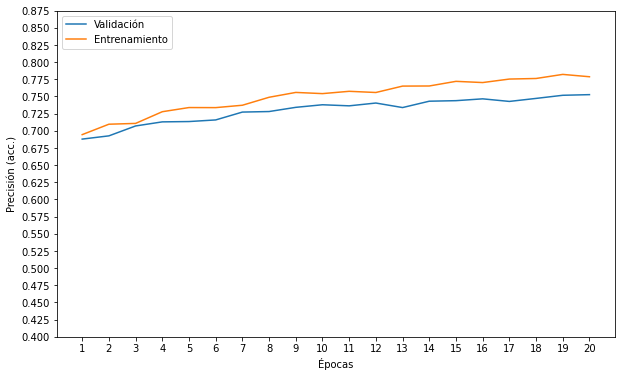

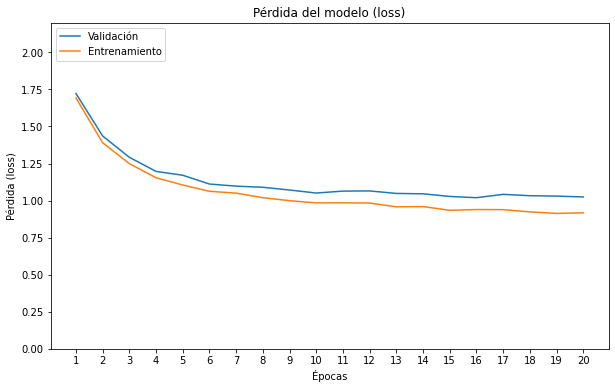

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 58s 705ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 57s 701ms/step - loss: 1.1157 - acc: 0.7167


[1.1157090663909912, 0.7166579961776733]

Se crea la matriz de confusión:

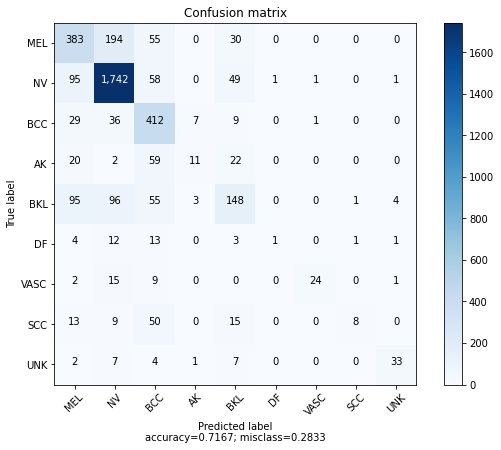

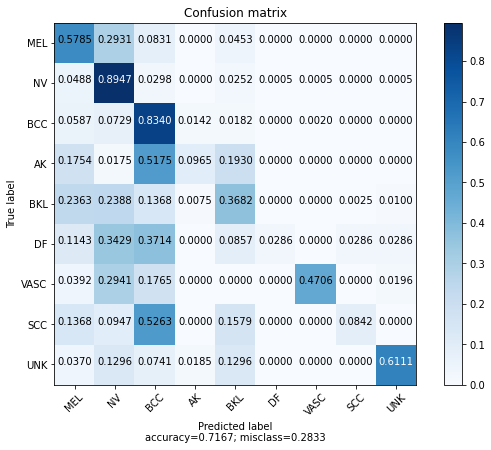

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

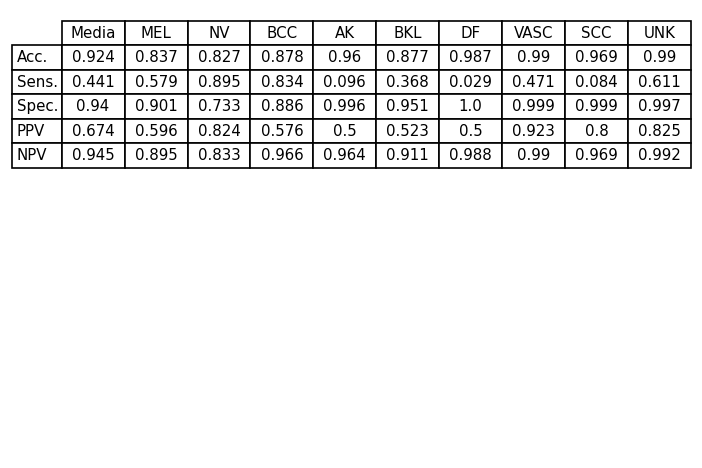

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

### 30 epochs

In [ ]:
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=10,
                    callbacks=[call]
                    )

Epoch 1/10
939/939 [==============================] - 1788s 2s/step - loss: 1.0447 - acc: 0.7452 - val_loss: 1.0213 - val_acc: 0.7541
Epoch 2/10
939/939 [==============================] - 1751s 2s/step - loss: 1.0383 - acc: 0.7480 - val_loss: 1.0150 - val_acc: 0.7603
Epoch 3/10
939/939 [==============================] - 1758s 2s/step - loss: 1.0297 - acc: 0.7508 - val_loss: 0.9913 - val_acc: 0.7607
Epoch 4/10
939/939 [==============================] - 1733s 2s/step - loss: 1.0226 - acc: 0.7515 - val_loss: 1.0124 - val_acc: 0.7552
Epoch 5/10
939/939 [==============================] - 1700s 2s/step - loss: 1.0150 - acc: 0.7572 - val_loss: 1.0183 - val_acc: 0.7555
Epoch 6/10
939/939 [==============================] - 1708s 2s/step - loss: 1.0211 - acc: 0.7528 - val_loss: 0.9966 - val_acc: 0.7629
Epoch 7/10
939/939 [==============================] - 1712s 2s/step - loss: 1.0148 - acc: 0.7552 - val_loss: 1.0133 - val_acc: 0.7534
Epoch 8/10
939/939 [==============================] - 1704s 2s

#### Gráficas

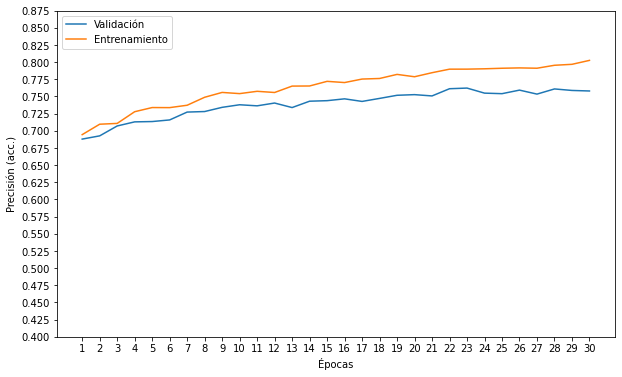

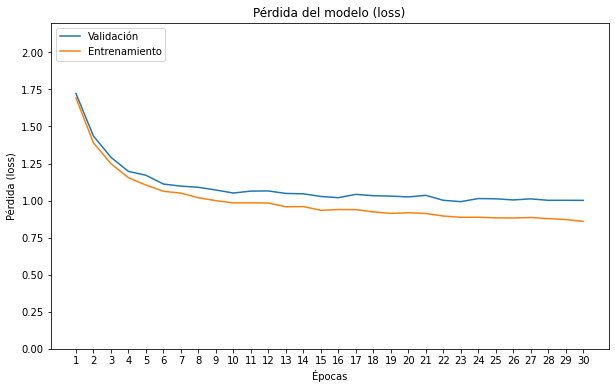

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 53s 651ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 54s 654ms/step - loss: 1.1080 - acc: 0.7112


[1.1080257892608643, 0.7112091183662415]

Se crea la matriz de confusión:

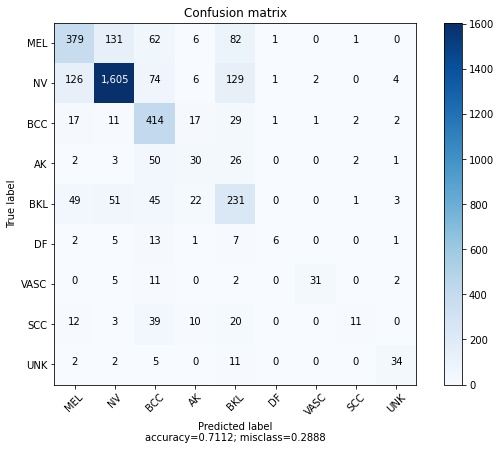

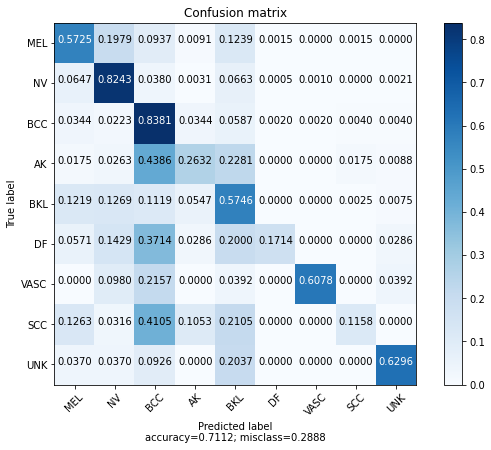

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

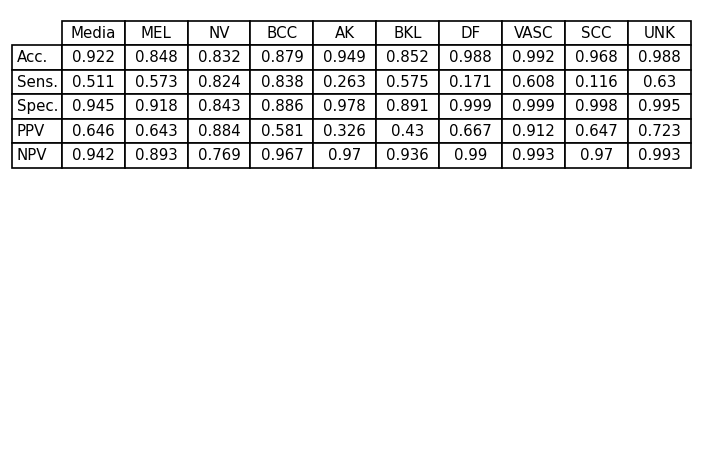

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

### 40 epochs

In [ ]:
model = load_model('/content/drive/My Drive/efficientNet10_30.h5')
# es necesario dividir el entrenamiento en partes ya que requiere mucho tiempo
# se carga el modelo entrenado por 30 epochs y se sigue hasta 50

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=10,
                    callbacks=[call]
                    )

Epoch 1/10
939/939 [==============================] - 1971s 2s/step - loss: 1.0169 - acc: 0.7554 - val_loss: 0.8978 - val_acc: 0.7879
Epoch 2/10
939/939 [==============================] - 1761s 2s/step - loss: 1.0049 - acc: 0.7610 - val_loss: 0.9071 - val_acc: 0.7879
Epoch 3/10
939/939 [==============================] - 1738s 2s/step - loss: 1.0000 - acc: 0.7606 - val_loss: 0.9145 - val_acc: 0.7832
Epoch 4/10
939/939 [==============================] - 1714s 2s/step - loss: 0.9904 - acc: 0.7617 - val_loss: 0.9084 - val_acc: 0.7812
Epoch 5/10
939/939 [==============================] - 1739s 2s/step - loss: 0.9937 - acc: 0.7615 - val_loss: 0.9068 - val_acc: 0.7892
Epoch 6/10
939/939 [==============================] - 1836s 2s/step - loss: 0.9791 - acc: 0.7665 - val_loss: 0.9256 - val_acc: 0.7806
Epoch 7/10
939/939 [==============================] - 1840s 2s/step - loss: 0.9762 - acc: 0.7663 - val_loss: 0.9067 - val_acc: 0.7897
Epoch 8/10
939/939 [==============================] - 1722s 2s

#### Gráficas

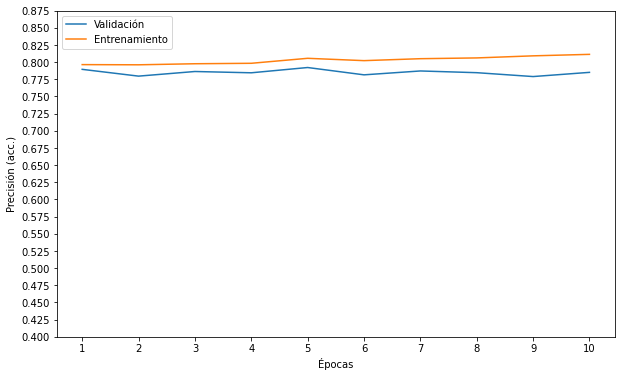

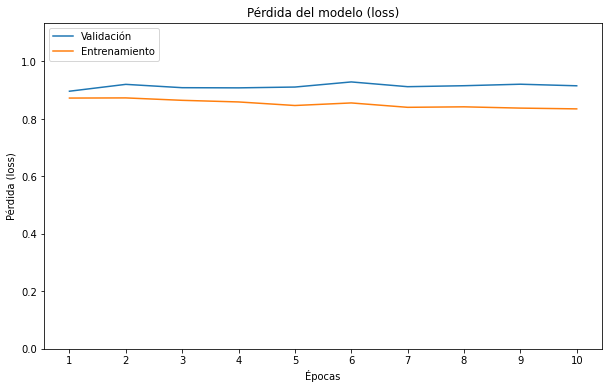

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 66s 802ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 54s 653ms/step - loss: 1.0970 - acc: 0.7307


[1.0969635248184204, 0.7306694388389587]

Se crea la matriz de confusión:

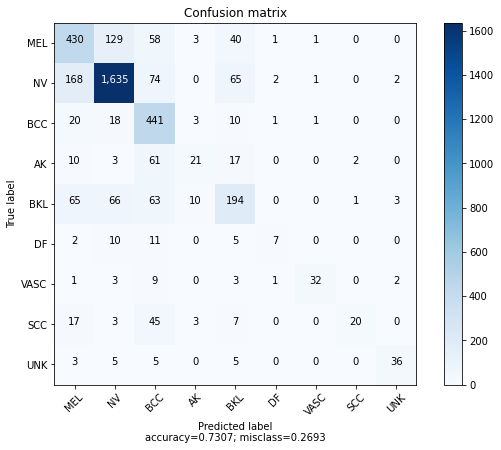

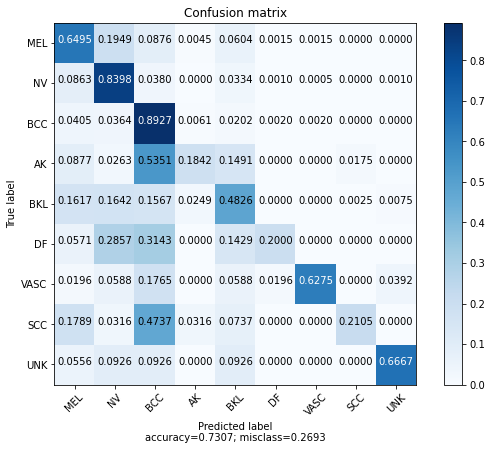

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

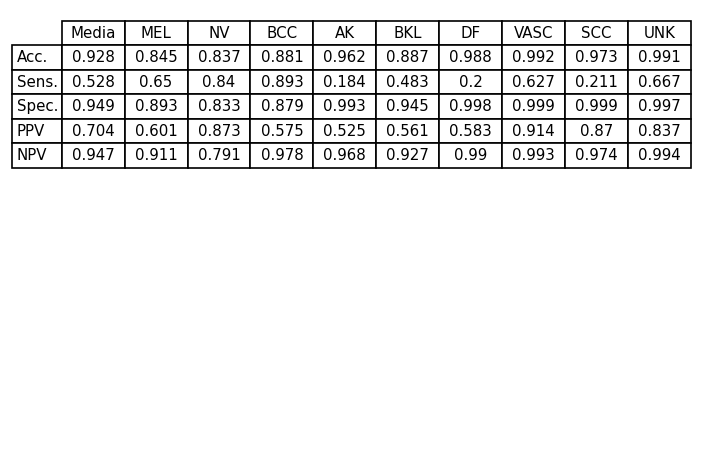

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

### 50 epochs

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=10,
                    callbacks=[call]
                    )

Epoch 1/10
939/939 [==============================] - 2019s 2s/step - loss: 0.9684 - acc: 0.7712 - val_loss: 0.9225 - val_acc: 0.7790
Epoch 2/10
939/939 [==============================] - 2027s 2s/step - loss: 0.9596 - acc: 0.7741 - val_loss: 0.9280 - val_acc: 0.7809
Epoch 3/10
939/939 [==============================] - 2009s 2s/step - loss: 0.9632 - acc: 0.7754 - val_loss: 0.9267 - val_acc: 0.7815
Epoch 4/10
939/939 [==============================] - 2008s 2s/step - loss: 0.9513 - acc: 0.7757 - val_loss: 0.9284 - val_acc: 0.7813
Epoch 5/10
939/939 [==============================] - 1995s 2s/step - loss: 0.9528 - acc: 0.7737 - val_loss: 0.9395 - val_acc: 0.7779
Epoch 6/10
939/939 [==============================] - 2008s 2s/step - loss: 0.9548 - acc: 0.7756 - val_loss: 0.9260 - val_acc: 0.7843
Epoch 7/10
939/939 [==============================] - 2006s 2s/step - loss: 0.9515 - acc: 0.7776 - val_loss: 0.9375 - val_acc: 0.7878
Epoch 8/10
939/939 [==============================] - 2011s 2s

#### Gráficas

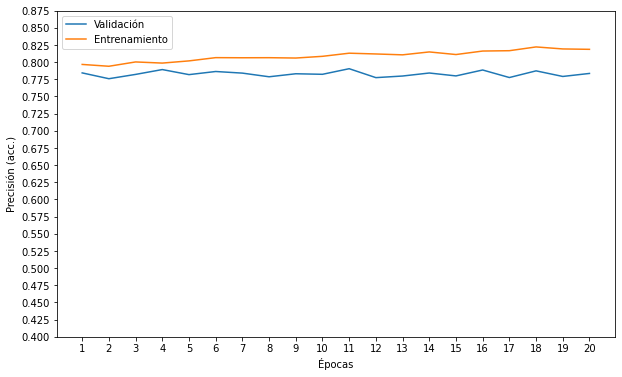

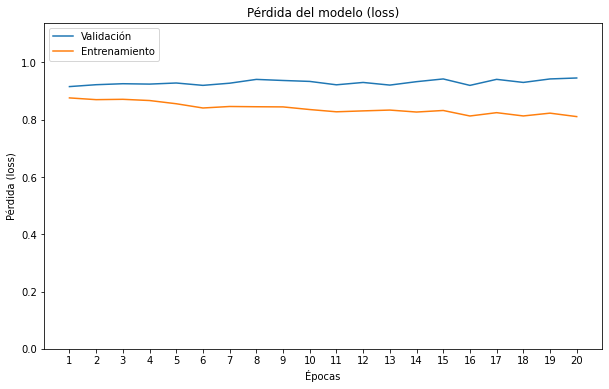

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 62s 759ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 62s 760ms/step - loss: 1.1024 - acc: 0.7276


[1.1023882627487183, 0.7275558114051819]

Se crea la matriz de confusión:

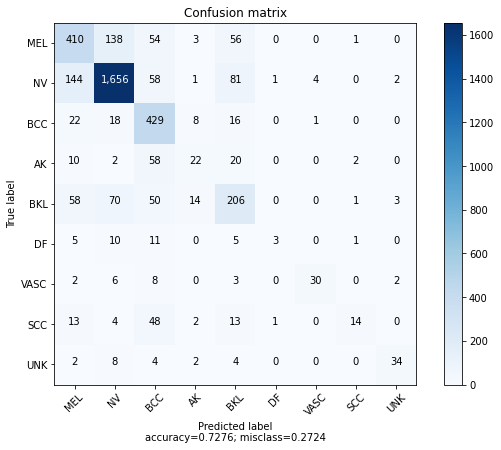

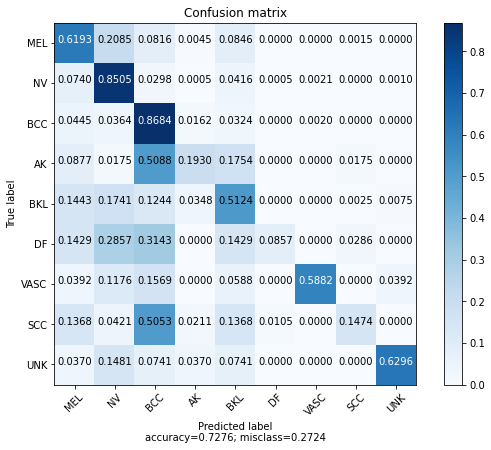

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

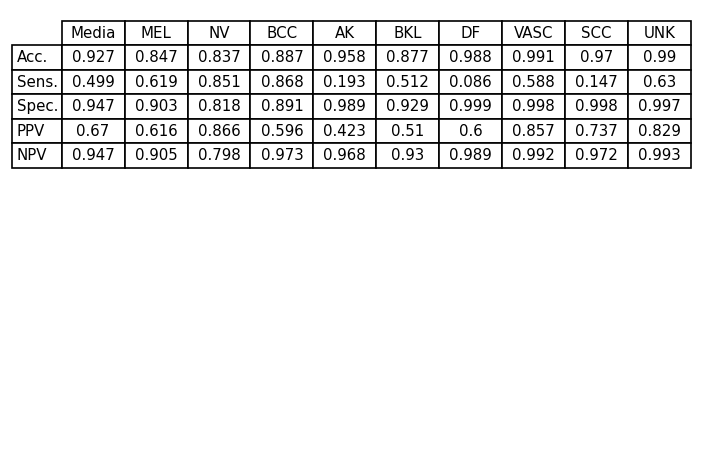

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

## Q: ISIC+UNK+L2+7P+SD, LR = 1e-4, Descongelando 9 capas, L2 = 0.01, Neuronas a la mitad

Se crea el modelo:

In [ ]:
def create_EfficientNetB0():
  # Se crea una red EfficientNetB0 sin el clasificador (include_top = false) y con los pesos de haber sido entrenada con ImageNet
  modelEf = efn.EfficientNetB0(include_top=False, weights='imagenet', input_shape=(224,224,3))

  # Las capas de la red se ponen como no entrenables
  for layer in modelEf.layers:
    layer.trainable = False

  # Se añade nuestro clasificador
  last_layer = modelEf.layers[-1]
  last_output = last_layer.output
  x=keras.layers.Flatten()(last_output)
  x=keras.layers.Dense(64,activation='relu',kernel_regularizer=regularizers.l2(0.01))(x) # Se añade regularización L2
  x=keras.layers.Dropout(0.5)(x)
  x=keras.layers.Dense(9,activation='softmax')(x)

  model = keras.Model(modelEf.input, x)

  # Se descongelan las 9 últimas capas
  for layer in model.layers[-9:]:
      layer.trainable=True
  
  return model

In [ ]:
model = create_EfficientNetB0()

16809984/16804768 [==============================] - 0s 0us/step


Se crea un Callback que sea llamado al final de cada epoch del entrenamiento para calcular la precisión y error durante el entrenamiento. Esto ya lo hace por defecto la función fit() pero las curvas estaban dando un resultado un tanto extraño (la curva de la precisión de validación mucho mayor que la de entrenamiento), por lo que se optó mejor por esta opción, cuyas curvas sí eran coherentes

In [ ]:
class TrainingHistoryEvaluate(tf.keras.callbacks.Callback):
  def __init__(self):
    self.validAcc = [] 
    self.trainAcc = []
    self.validLoss = []
    self.trainLoss = []

  def on_epoch_end(self, epoch, logs=None):
    valid_generator.reset()
    train_generator.reset()

    lossV,accV = model.evaluate(x=valid_generator,steps=STEP_SIZE_VALID,verbose=1)
    lossT,accT = model.evaluate(x=train_generator,steps=STEP_SIZE_TRAIN,verbose=1)

    self.validAcc.append(accV)
    self.trainAcc.append(accT)
    self.validLoss.append(lossV)
    self.trainLoss.append(lossT)

In [ ]:
call = TrainingHistoryEvaluate()

Se eligen optimizador, learning rate y pérdida (loss)

In [ ]:
opt = tf.keras.optimizers.Adam(learning_rate=0.0001)

model.compile(optimizer=opt,loss='categorical_crossentropy',metrics = ['acc'])

Se entrena el modelo:

### 10 epochs

In [ ]:
# Necesario para cargar imágenes del dataset SD
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=10,
                    callbacks=[call]
                    )

Epoch 1/10
975/975 [==============================] - 2158s 2s/step - loss: 2.1408 - acc: 0.6121 - val_loss: 1.6470 - val_acc: 0.6887
Epoch 2/10
975/975 [==============================] - 1962s 2s/step - loss: 1.6867 - acc: 0.6499 - val_loss: 1.3857 - val_acc: 0.7041
Epoch 3/10
975/975 [==============================] - 2025s 2s/step - loss: 1.4694 - acc: 0.6625 - val_loss: 1.2622 - val_acc: 0.7076
Epoch 4/10
975/975 [==============================] - 2032s 2s/step - loss: 1.3616 - acc: 0.6759 - val_loss: 1.1770 - val_acc: 0.7197
Epoch 5/10
975/975 [==============================] - 2035s 2s/step - loss: 1.2918 - acc: 0.6834 - val_loss: 1.1457 - val_acc: 0.7234
Epoch 6/10
975/975 [==============================] - 2038s 2s/step - loss: 1.2477 - acc: 0.6924 - val_loss: 1.0943 - val_acc: 0.7316
Epoch 7/10
975/975 [==============================] - 2044s 2s/step - loss: 1.2095 - acc: 0.6973 - val_loss: 1.0871 - val_acc: 0.7351
Epoch 8/10
975/975 [==============================] - 2045s 2s

#### Gráficas

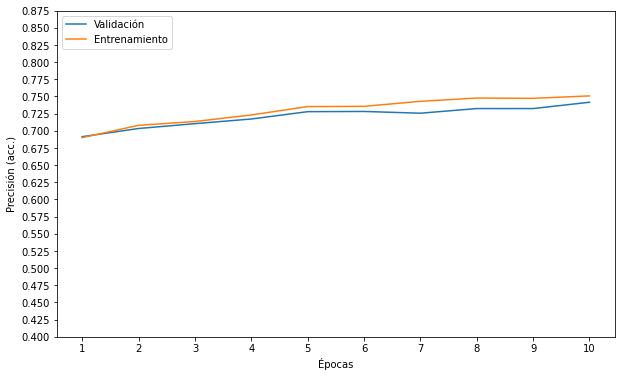

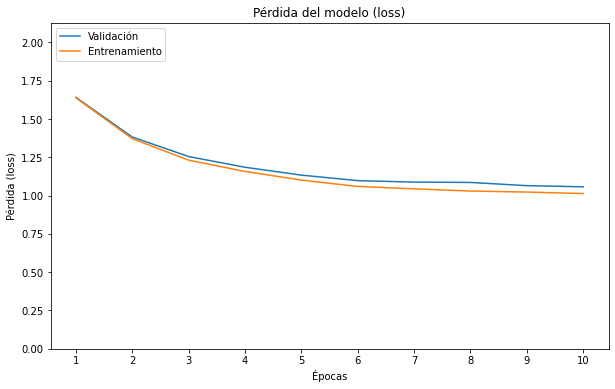

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 78s 950ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 62s 755ms/step - loss: 1.1613 - acc: 0.7052


[1.1612834930419922, 0.705241322517395]

Se crea la matriz de confusión:

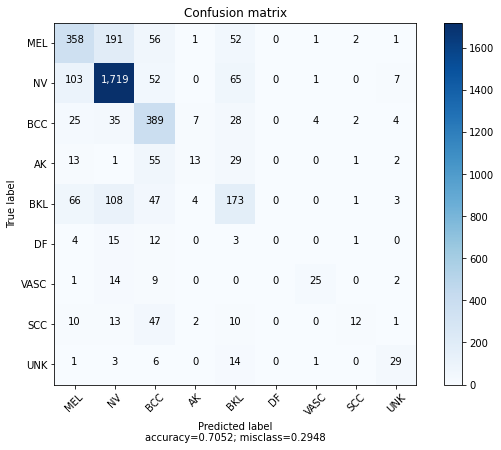

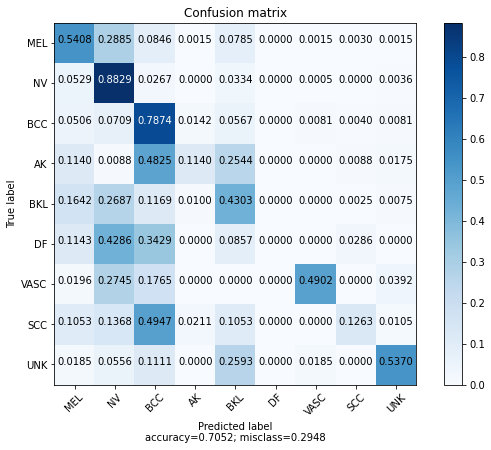

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in true_divide


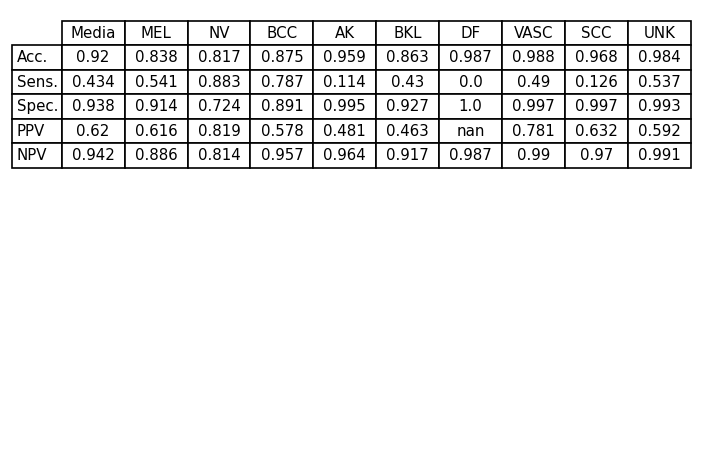

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

### 24 epochs

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=14,
                    callbacks=[call]
                    )

Epoch 1/14
975/975 [==============================] - 2031s 2s/step - loss: 1.1490 - acc: 0.7139 - val_loss: 1.0542 - val_acc: 0.7416
Epoch 2/14
975/975 [==============================] - 2036s 2s/step - loss: 1.1431 - acc: 0.7191 - val_loss: 1.0538 - val_acc: 0.7422
Epoch 3/14
975/975 [==============================] - 2048s 2s/step - loss: 1.1196 - acc: 0.7218 - val_loss: 1.0372 - val_acc: 0.7438
Epoch 4/14
975/975 [==============================] - 2034s 2s/step - loss: 1.1128 - acc: 0.7222 - val_loss: 1.0301 - val_acc: 0.7479
Epoch 5/14
975/975 [==============================] - 1992s 2s/step - loss: 1.1073 - acc: 0.7266 - val_loss: 1.0122 - val_acc: 0.7491
Epoch 6/14
975/975 [==============================] - 1980s 2s/step - loss: 1.0993 - acc: 0.7301 - val_loss: 1.0281 - val_acc: 0.7477
Epoch 7/14
975/975 [==============================] - 1963s 2s/step - loss: 1.0901 - acc: 0.7291 - val_loss: 1.0066 - val_acc: 0.7563
Epoch 8/14
975/975 [==============================] - 1967s 2s

#### Gráficas

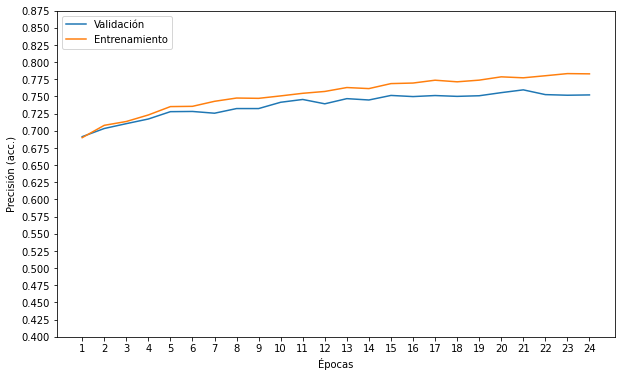

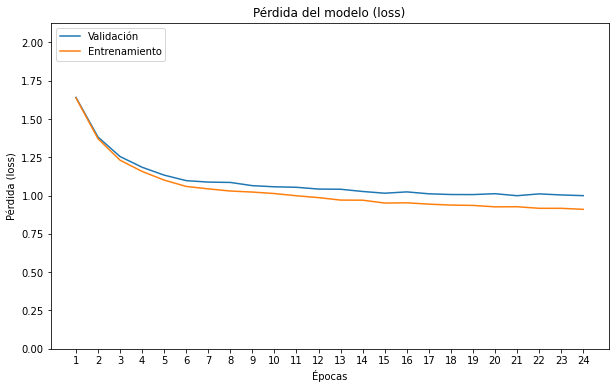

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 59s 716ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 58s 712ms/step - loss: 1.1097 - acc: 0.7208


[1.1096563339233398, 0.7208095192909241]

Se crea la matriz de confusión:

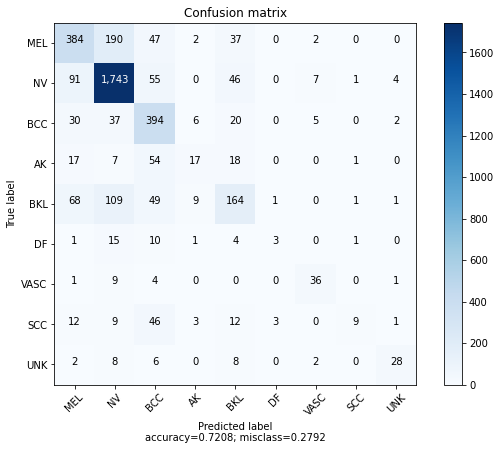

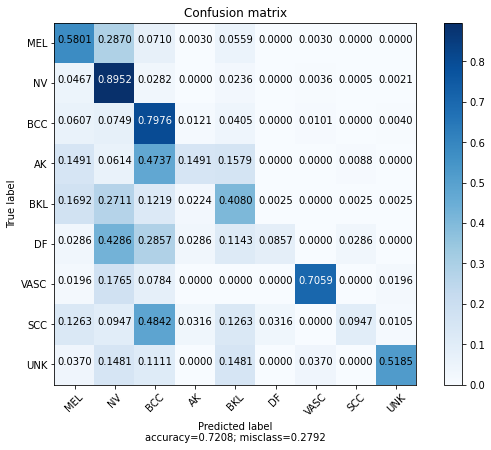

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

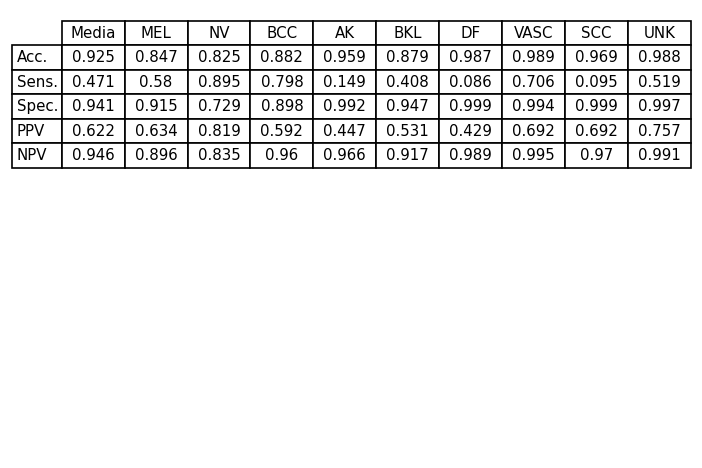

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

### 30 epochs

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=6,
                    callbacks=[call]
                    )

Epoch 1/6
975/975 [==============================] - 1978s 2s/step - loss: 1.0402 - acc: 0.7464 - val_loss: 0.9905 - val_acc: 0.7589
Epoch 2/6
975/975 [==============================] - 1966s 2s/step - loss: 1.0342 - acc: 0.7491 - val_loss: 0.9917 - val_acc: 0.7595
Epoch 3/6
975/975 [==============================] - 1999s 2s/step - loss: 1.0271 - acc: 0.7513 - val_loss: 0.9867 - val_acc: 0.7625
Epoch 4/6
975/975 [==============================] - 1995s 2s/step - loss: 1.0249 - acc: 0.7538 - val_loss: 1.0052 - val_acc: 0.7497
Epoch 5/6
975/975 [==============================] - 1982s 2s/step - loss: 1.0192 - acc: 0.7547 - val_loss: 0.9829 - val_acc: 0.7586
Epoch 6/6
975/975 [==============================] - 1991s 2s/step - loss: 1.0117 - acc: 0.7551 - val_loss: 0.9858 - val_acc: 0.7605


#### Gráficas

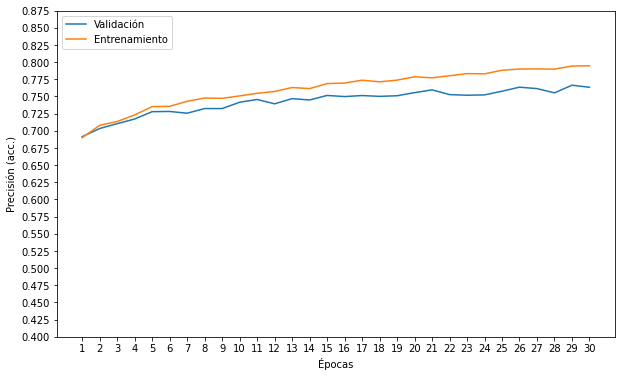

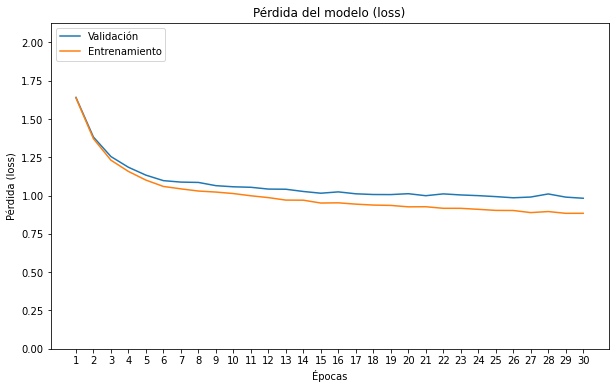

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 59s 715ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 59s 715ms/step - loss: 1.1280 - acc: 0.7133


[1.127979040145874, 0.7132849097251892]

Se crea la matriz de confusión:

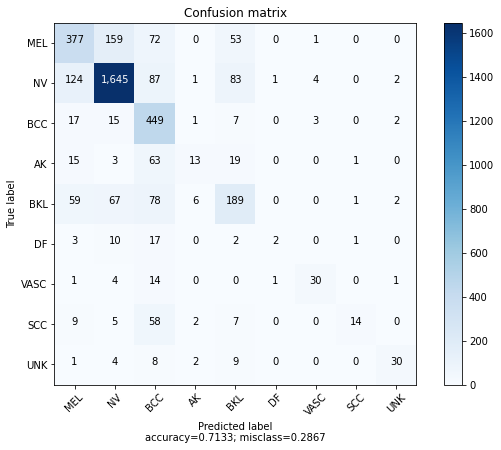

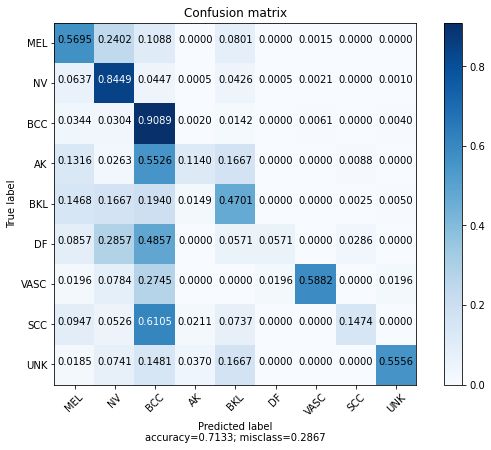

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

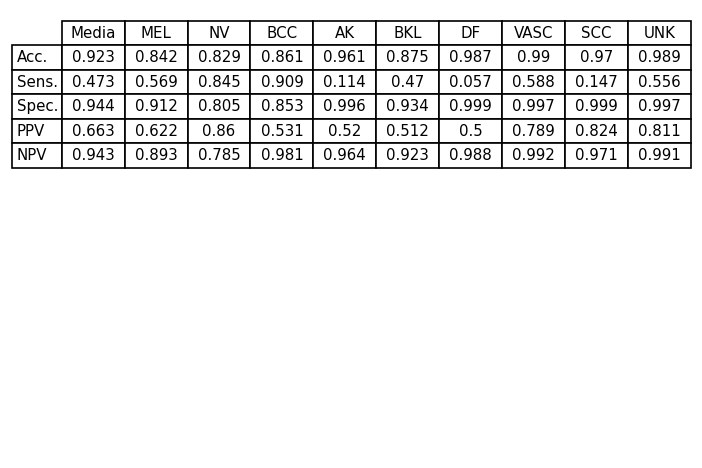

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

### 40 epochs

In [ ]:
model = load_model('efficientNetQ_30.h5')
# es necesario dividir el entrenamiento en partes ya que requiere mucho tiempo
# se carga el modelo entrenado por 30 epochs y se sigue hasta 50

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=10,
                    callbacks=[call]
                    )

Epoch 1/10
975/975 [==============================] - 2200s 2s/step - loss: 1.0244 - acc: 0.7527 - val_loss: 0.9058 - val_acc: 0.7869
Epoch 2/10
975/975 [==============================] - 2034s 2s/step - loss: 1.0168 - acc: 0.7540 - val_loss: 0.9000 - val_acc: 0.7893
Epoch 3/10
975/975 [==============================] - 2034s 2s/step - loss: 1.0105 - acc: 0.7570 - val_loss: 0.9034 - val_acc: 0.7884
Epoch 4/10
975/975 [==============================] - 2044s 2s/step - loss: 1.0071 - acc: 0.7575 - val_loss: 0.9270 - val_acc: 0.7837
Epoch 5/10
975/975 [==============================] - 2029s 2s/step - loss: 1.0011 - acc: 0.7580 - val_loss: 0.9147 - val_acc: 0.7887
Epoch 6/10
975/975 [==============================] - 2027s 2s/step - loss: 0.9984 - acc: 0.7598 - val_loss: 0.9281 - val_acc: 0.7842
Epoch 7/10
975/975 [==============================] - 2017s 2s/step - loss: 0.9912 - acc: 0.7613 - val_loss: 0.9217 - val_acc: 0.7843
Epoch 8/10
975/975 [==============================] - 2011s 2s

#### Gráficas

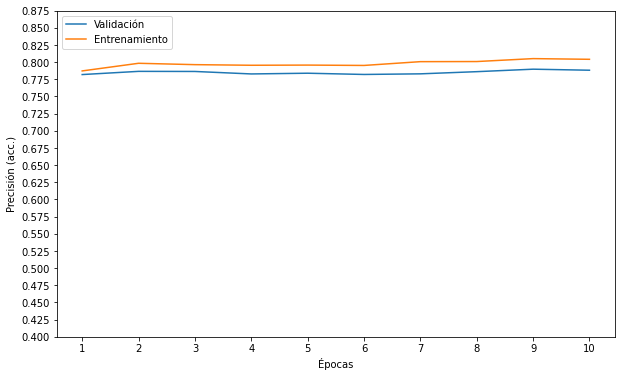

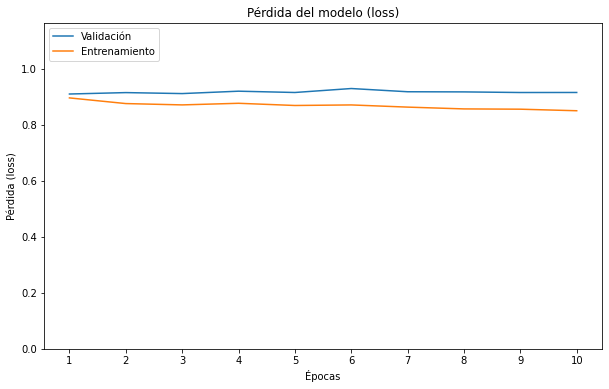

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 76s 924ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 60s 737ms/step - loss: 1.0848 - acc: 0.7348


[1.0848091840744019, 0.7348209619522095]

Se crea la matriz de confusión:

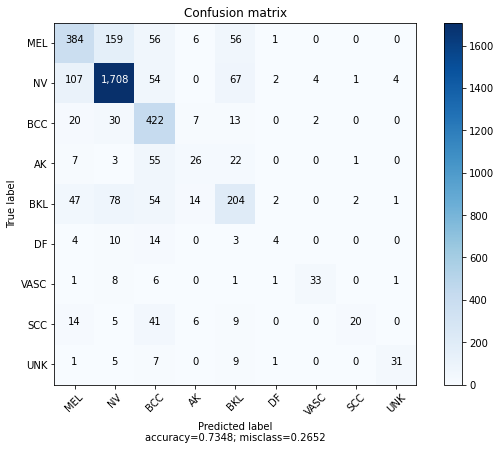

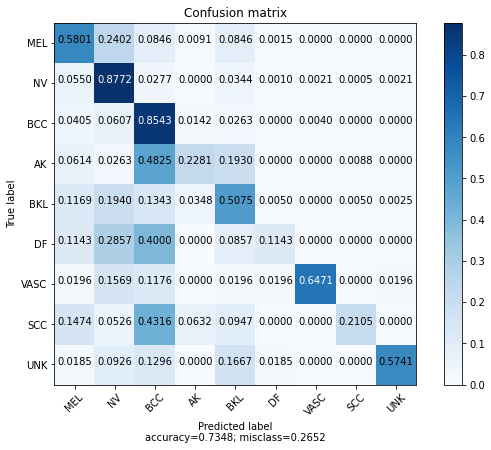

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

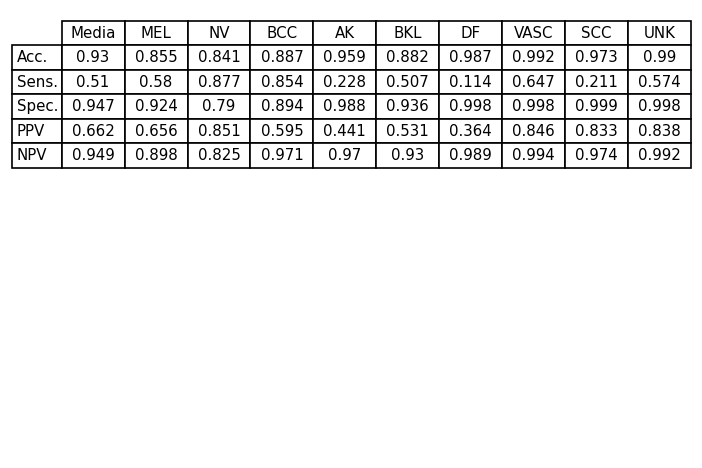

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

### 50 epochs

In [ ]:
history = model.fit(x=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=10,
                    callbacks=[call]
                    )

Epoch 1/10
975/975 [==============================] - 2014s 2s/step - loss: 0.9815 - acc: 0.7654 - val_loss: 0.9332 - val_acc: 0.7827
Epoch 2/10
975/975 [==============================] - 2016s 2s/step - loss: 0.9765 - acc: 0.7688 - val_loss: 0.9166 - val_acc: 0.7870
Epoch 3/10
975/975 [==============================] - 2022s 2s/step - loss: 0.9742 - acc: 0.7707 - val_loss: 0.9178 - val_acc: 0.7890
Epoch 4/10
975/975 [==============================] - 1976s 2s/step - loss: 0.9724 - acc: 0.7691 - val_loss: 0.9253 - val_acc: 0.7918
Epoch 5/10
975/975 [==============================] - 2003s 2s/step - loss: 0.9669 - acc: 0.7723 - val_loss: 0.9158 - val_acc: 0.7914
Epoch 6/10
975/975 [==============================] - 1982s 2s/step - loss: 0.9627 - acc: 0.7740 - val_loss: 0.9195 - val_acc: 0.7861
Epoch 7/10
975/975 [==============================] - 1969s 2s/step - loss: 0.9669 - acc: 0.7715 - val_loss: 0.9373 - val_acc: 0.7854
Epoch 8/10
975/975 [==============================] - 1932s 2s

#### Gráficas

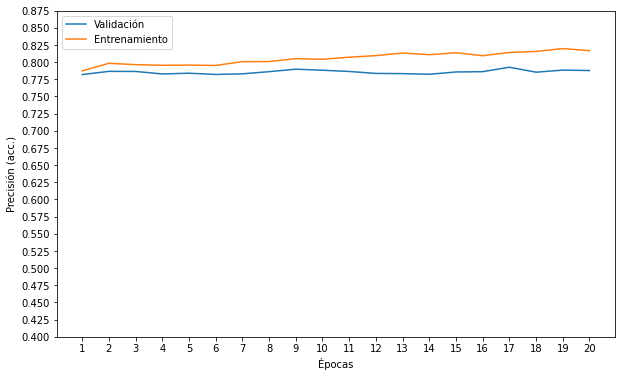

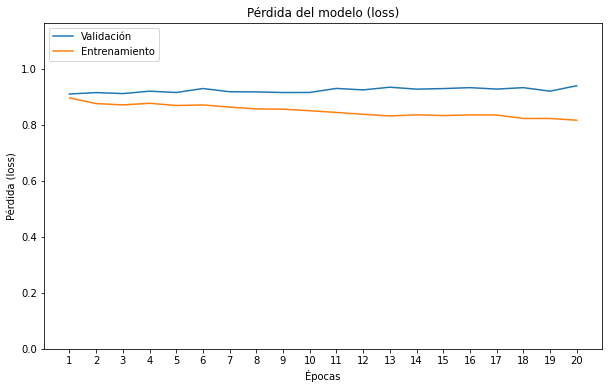

In [ ]:
plot_customHistory(call)

#### Estadísticas

Se extraen las etiquetas verdaderas del conjunto de test:

In [ ]:
test_label_truth = test_generator.labels

test_label_truth = np.argmax(test_label_truth,axis=1)

Se hace la predicción del modelo para el conjunto de test:

In [ ]:
test_generator.reset()
pred = model.predict(x=test_generator,steps=STEP_SIZE_TEST,verbose=1)

pred_label = np.argmax(pred,axis=1)

82/82 [==============================] - 60s 726ms/step


Se evalúa el modelo para conseguir directamente la precisión y el error

In [ ]:
# Loss y acc total, respectivamente
model.evaluate(x=test_generator,steps=STEP_SIZE_TEST)

82/82 [==============================] - 59s 724ms/step - loss: 1.0949 - acc: 0.7418


[1.0949275493621826, 0.7418266534805298]

Se crea la matriz de confusión:

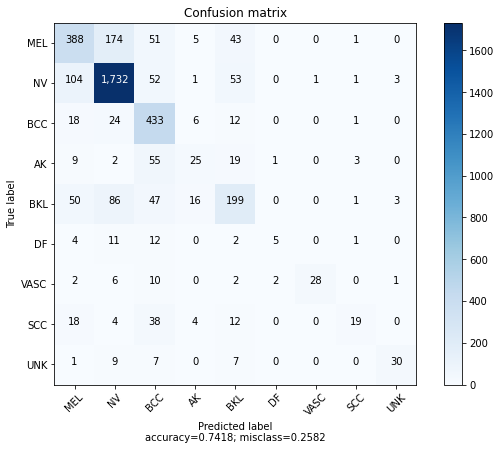

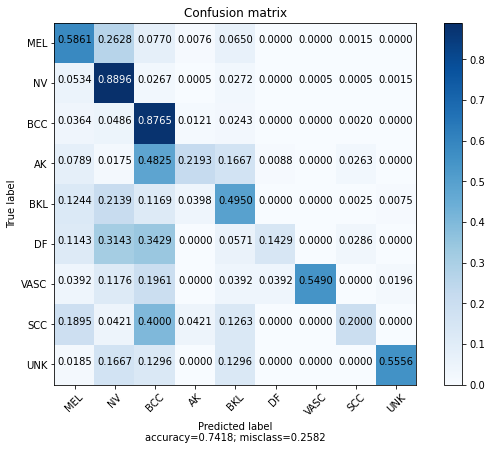

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_true=test_label_truth, y_pred=pred_label)

plot_confusion_matrix(confusion_matrix,normalize=False)
plot_confusion_matrix(confusion_matrix,normalize=True)

Se extraen estadísticas por clases:

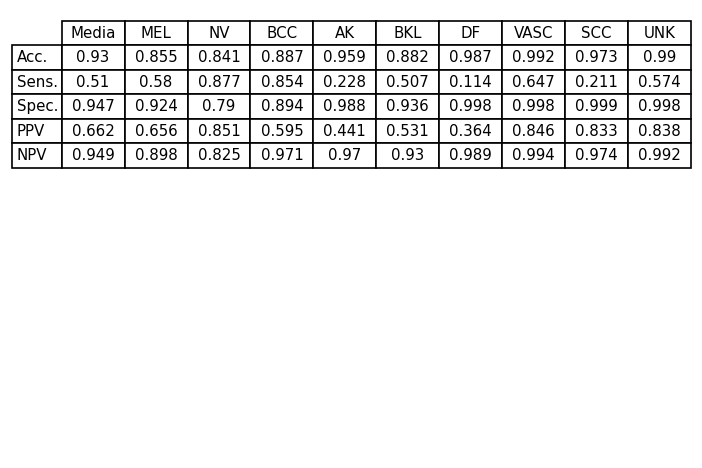

In [ ]:
# Estadísticas por categorías
classification_stats(confusion_matrix)

# Guardar modelo y resultados

In [ ]:
model.save('efficientNet_Q.h5') #guardar modelo

In [ ]:
save_customHistory(callback=call,history=history,filepath='efficientNet_Q') # se guardan los datos de entrenamiento (callback y history generado por fit())